## Which Countries have had the most significant progression in happiness and why?

### Import

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('whitegrid')
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] =(10, 7)
plt.rcParams['figure.facecolor'] = '#FFE5B4'

In [2]:
pd.set_option('display.max_rows', None);

In [ ]:
Beans

In [3]:
# Import data and save originals

original_data_2023 = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\2023\WHR_2023.xls")
data_2023 = pd.DataFrame(original_data_2023)

original_2021 = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\2021\WHR2021.xls")
data_2021 = pd.DataFrame(original_2021)

original_data = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\2023\WHR_before_2023.xls")
data = pd.DataFrame(original_data)

original_country_region = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\country_region.xlsx")
country_region = pd.DataFrame(original_country_region)

original_world_life_expectancy = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\world_life_expectancy.xlsx")
world_life_expectancy = pd.DataFrame(original_world_life_expectancy)

original_taiwan_life_expectancy = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\taiwan_life_expectancy.xlsx")
taiwan_life_expectancy = pd.DataFrame(original_taiwan_life_expectancy)

### 2023 Prep

In [4]:
data_2023.head(10)

,Country name,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,7.8042,0.036162,7.875078,7.733322,10.792010,0.968770,71.149994,0.961408,-0.018824,0.181745,1.777825,1.888380,1.584900,0.534574,0.771510,0.126331,0.535299,2.363241
1,Denmark,7.5864,0.041028,7.666815,7.505985,10.962164,0.954112,71.250145,0.933533,0.134242,0.195814,1.777825,1.949406,1.547875,0.537302,0.734416,0.208459,0.525221,2.083766
2,Iceland,7.5296,0.048612,7.624879,7.434321,10.895531,0.982533,72.050018,0.936349,0.210987,0.667848,1.777825,1.925508,1.619666,0.559096,0.738164,0.249635,0.187119,2.250382
3,Israel,7.4729,0.031609,7.534853,7.410946,10.638705,0.943344,72.697205,0.808866,-0.023080,0.708094,1.777825,1.833398,1.520674,0.576730,0.568518,0.124048,0.158292,2.691290
4,Netherlands,7.4030,0.029294,7.460416,7.345583,10.942279,0.930499,71.550018,0.886875,0.212686,0.378929,1.777825,1.942274,1.488228,0.545473,0.672327,0.250547,0.394062,2.110044
5,Sweden,7.3952,0.037362,7.468428,7.321971,10.882823,0.939249,72.150154,0.947971,0.164789,0.202448,1.777825,1.920950,1.510329,0.561825,0.753629,0.224848,0.520469,1.903127
6,Norway,7.3155,0.044143,7.402020,7.228980,11.087730,0.943477,71.500023,0.946616,0.140636,0.282745,1.777825,1.994440,1.521009,0.544111,0.751827,0.211889,0.462955,1.829270
7,Switzerland,7.2401,0.042789,7.323966,7.156234,11.164027,0.920439,72.899956,0.891074,0.026686,0.266348,1.777825,2.021803,1.462816,0.582254,0.677915,0.150750,0.474700,1.869847
8,Luxembourg,7.2279,0.069081,7.363298,7.092502,11.659949,0.878501,71.675003,0.914938,0.023950,0.344978,1.777825,2.199664,1.356879,0.548878,0.709672,0.149281,0.418380,1.845181
9,New Zealand,7.1229,0.038227,7.197824,7.047976,10.661865,0.952398,70.350052,0.886574,0.174828,0.271205,1.777825,1.841704,1.543546,0.512778,0.671927,0.230235,0.471221,1.851519


In [5]:
# Drop unwanted columns

data_2023_columns = ['Country name',
                     'Ladder score',
                     'Logged GDP per capita',
                     'Social support',
                     'Healthy life expectancy',
                     'Freedom to make life choices',
                     'Generosity',
                     'Perceptions of corruption']
data_2023 = data_2023[data_2023_columns]
list(data_2023.columns)

['Country name',
 'Ladder score',
 'Logged GDP per capita',
 'Social support',
 'Healthy life expectancy',
 'Freedom to make life choices',
 'Generosity',
 'Perceptions of corruption']

In [6]:
data_2023 = data_2023.rename(columns = {'Country name':'country_name',
                                      'Ladder score':'happiness_score',
                                      'Logged GDP per capita':'log_gdp_per_capita',
                                      'Social support':'social_support',
                                      'Healthy life expectancy':'life_expectancy',
                                      'Freedom to make life choices':'freedom',
                                      'Generosity':'generosity',
                                      'Perceptions of corruption':'perception_of_corruption'})
list(data_2023.columns)

['country_name',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [7]:
data_2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country_name              137 non-null    object 
 1   happiness_score           137 non-null    float64
 2   log_gdp_per_capita        137 non-null    float64
 3   social_support            137 non-null    float64
 4   life_expectancy           136 non-null    float64
 5   freedom                   137 non-null    float64
 6   generosity                137 non-null    float64
 7   perception_of_corruption  137 non-null    float64
dtypes: float64(7), object(1)
memory usage: 8.7+ KB


In [8]:
data_2023.describe()

,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,137.000000,137.000000,137.000000,136.000000,137.000000,137.000000,137.000000
mean,5.539755,9.449785,0.799045,64.967627,0.787427,0.022444,0.725375
std,1.139908,1.207315,0.129188,5.750394,0.112350,0.141711,0.176960
min,1.859000,5.526723,0.341341,51.530212,0.381642,-0.254276,0.146112
25%,4.723900,8.590914,0.722042,60.648690,0.723874,-0.073543,0.667848
50%,5.684300,9.567472,0.827064,65.837624,0.800536,0.001419,0.773583
75%,6.333800,10.540300,0.895955,69.412264,0.874468,0.117025,0.845892
max,7.804200,11.659949,0.982533,77.279778,0.961408,0.531386,0.929089


In [9]:
# Check for duplicated rows 

data_2023.duplicated().any()

False

In [10]:
# Check for duplicate country_names

data_2023['country_name'].duplicated().any()

False

In [11]:
# Check for missing data

data_2023[data_2023.isnull().any(axis=1)]

,country_name,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
98,State of Palestine,4.9078,8.716377,0.859495,NaN,0.6945,-0.13237,0.835795


In [12]:
# Insert missing data

data_2023.loc[data_2023['country_name'] == 'State of Palestine', 'life_expectancy'] = 74.2798

In [13]:
# Check for missing data again

data_2023.isnull().sum()

country_name                0
happiness_score             0
log_gdp_per_capita          0
social_support              0
life_expectancy             0
freedom                     0
generosity                  0
perception_of_corruption    0
dtype: int64

In [14]:
## Use country_region to add regions to data_2023, Prepare country_region for merge

country_region.head(10)

,country_name,region,global_cardinal
0,Andorra,Europe,Global North
1,United Arab Emirates,Middle east,Global South
2,Afghanistan,Asia & Pacific,Global South
3,Antigua and Barbuda,South/Latin America,Global South
4,Anguilla,South/Latin America,Global South
5,Albania,Europe,Global North
6,Armenia,Europe,Global North
7,Netherlands Antilles,South/Latin America,Global South
8,Angola,Africa,Global South
9,Antarctica,Asia & Pacific,Global South


In [15]:
# Drop unwanted columns from country_region dataframe

country_region = country_region.drop(['global_cardinal'], axis=1)
list(country_region.columns)

['country_name', 'region']

In [16]:
# Order by country_name and reset index

country_region = country_region.sort_values('country_name').reset_index().drop('index', axis=1)
country_region.head(10)

,country_name,region
0,Afghanistan,Asia & Pacific
1,Aland Islands,Europe
2,Albania,Europe
3,Algeria,Arab States
4,American Samoa,Asia & Pacific
5,Andorra,Europe
6,Angola,Africa
7,Anguilla,South/Latin America
8,Antarctica,Asia & Pacific
9,Antigua and Barbuda,South/Latin America


In [17]:
# Create copy

test_data_2023 = data_2023

In [18]:
## Merge test_data_2023 with country_region to add region

test_data_2023 = pd.merge(test_data_2023, country_region, how = 'left', on = 'country_name')
data_2023_columns = ['country_name',
                     'region', 
                     'happiness_score',
                     'log_gdp_per_capita',
                     'social_support',
                     'life_expectancy',
                     'freedom',
                     'generosity',
                     'perception_of_corruption']
test_data_2023 = test_data_2023[data_2023_columns]
test_data_2023.head(10)

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Finland,Europe,7.8042,10.792010,0.968770,71.149994,0.961408,-0.018824,0.181745
1,Denmark,Europe,7.5864,10.962164,0.954112,71.250145,0.933533,0.134242,0.195814
2,Iceland,Europe,7.5296,10.895531,0.982533,72.050018,0.936349,0.210987,0.667848
3,Israel,Middle east,7.4729,10.638705,0.943344,72.697205,0.808866,-0.023080,0.708094
4,Netherlands,Europe,7.4030,10.942279,0.930499,71.550018,0.886875,0.212686,0.378929
5,Sweden,Europe,7.3952,10.882823,0.939249,72.150154,0.947971,0.164789,0.202448
6,Norway,Europe,7.3155,11.087730,0.943477,71.500023,0.946616,0.140636,0.282745
7,Switzerland,Europe,7.2401,11.164027,0.920439,72.899956,0.891074,0.026686,0.266348
8,Luxembourg,Europe,7.2279,11.659949,0.878501,71.675003,0.914938,0.023950,0.344978
9,New Zealand,Asia & Pacific,7.1229,10.661865,0.952398,70.350052,0.886574,0.174828,0.271205


In [19]:
# Check for NaN region

test_data_2023['region'].isna().any()

True

In [20]:
# Locate NaN rows

test_data_2023[test_data_2023.isna().any(axis=1)][['country_name','region']]

,country_name,region
17,Czechia,NaN
26,Taiwan Province of China,NaN
33,Kosovo,NaN
56,South Korea,NaN
62,Moldova,NaN
69,Russia,NaN
81,Hong Kong S.A.R. of China,NaN
85,Congo (Brazzaville),NaN
86,North Macedonia,NaN
88,Laos,NaN


In [21]:
test_data_2023.sort_values('country_name')

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
136,Afghanistan,Asia & Pacific,1.8590,7.324032,0.341341,54.712410,0.381642,-0.081011,0.847215
82,Albania,Europe,5.2773,9.567472,0.717909,69.150070,0.794328,-0.006932,0.878094
80,Algeria,Arab States,5.3291,9.300214,0.855219,66.549232,0.571240,-0.117374,0.716906
51,Argentina,South/Latin America,6.0237,9.958788,0.890890,67.200081,0.822678,-0.089480,0.814013
78,Armenia,Europe,5.3417,9.614713,0.790231,67.788971,0.795605,-0.155315,0.705434
11,Australia,Asia & Pacific,7.0946,10.821049,0.933870,71.049942,0.890200,0.197561,0.495916
10,Austria,Europe,7.0973,10.898906,0.888436,71.150047,0.854737,0.101604,0.496774
41,Bahrain,Arab States,6.1732,10.775782,0.843845,65.824997,0.943973,0.117025,0.736699
117,Bangladesh,Asia & Pacific,4.2821,8.684880,0.544469,64.548424,0.845008,0.005050,0.698185
16,Belgium,Europe,6.8591,10.843587,0.914871,70.899086,0.825229,0.001419,0.548573


In [22]:
country_region.sort_values('country_name')

,country_name,region
0,Afghanistan,Asia & Pacific
1,Aland Islands,Europe
2,Albania,Europe
3,Algeria,Arab States
4,American Samoa,Asia & Pacific
5,Andorra,Europe
6,Angola,Africa
7,Anguilla,South/Latin America
8,Antarctica,Asia & Pacific
9,Antigua and Barbuda,South/Latin America


In [23]:
country_region.shape

(248, 2)

In [24]:
# Correct NaN rows

test_data_2023.loc[test_data_2023['country_name'] == 'Czechia', 'country_name'] = 'Czech Republic'
test_data_2023.loc[test_data_2023['country_name'] == 'Taiwan Province of China', 'country_name'] = 'Taiwan'
test_data_2023.loc[test_data_2023['country_name'] == 'Hong Kong S.A.R. of China', 'country_name'] = 'Hong Kong'
test_data_2023.loc[test_data_2023['country_name'] == 'Congo (Kinshasa)', 'country_name'] = 'Congo Kinshasa'
test_data_2023.loc[test_data_2023['country_name'] == 'Congo (Brazzaville)', 'country_name'] = 'Congo Brazzaville'
test_data_2023.loc[test_data_2023['country_name'] == 'North Macedonia', 'country_name'] = 'Macedonia'
test_data_2023.loc[test_data_2023['country_name'] == 'Ivory Coast', 'country_name'] = '''Côte D'Ivoire'''
test_data_2023.loc[test_data_2023['country_name'] == 'State of Palestine', 'country_name'] = 'Palestine'

country_region.loc[117, 'country_name'] = 'South Korea'
country_region.loc[145, 'country_name'] = 'Moldova'
country_region.loc[121, 'country_name'] = 'Laos'
country_region.loc[country_region['country_name'] == 'Russian Federation', 'country_name'] = 'Russia'
country_region.loc[country_region['country_name'] == 'Congo, The Democratic Republic of the', 'country_name'] = 'Congo Kinshasa'
country_region.loc[country_region['country_name'] == 'Congo', 'country_name'] = 'Congo Brazzaville'
country_region.loc[country_region['country_name'] == 'Palestinian Territory', 'country_name'] = 'Palestine'
country_region.loc[country_region['country_name'] == 'Iran, Islamic Republic of', 'country_name'] = 'Iran'
country_region.loc[country_region['country_name'] == 'Turkey', 'country_name'] = 'Turkiye'
country_region.loc[country_region['country_name'] == 'Tanzania, United Republic of', 'country_name'] = 'Tanzania'

country_region.loc[248] = ['Kosovo', 'Europe']

In [25]:
## Merge again

test_data_2023 = test_data_2023.rename(columns = {'region' : 'region_2'})
test_data_2023 = pd.merge(test_data_2023, country_region, how = 'left', on = 'country_name')
test_data_2023 = test_data_2023[data_2023_columns]

In [26]:
# Check for NaN region again

test_data_2023['region'].isna().any()

False

In [27]:
# Check proper regions were entered

print(test_data_2023.drop_duplicates('region', keep='first')['region'])

0                    Europe
3               Middle east
9            Asia & Pacific
12            North America
22      South/Latin America
39    South/Central America
41              Arab States
58                   Africa
Name: region, dtype: object


In [28]:
# Check for missing data

test_data_2023.isnull().sum()

country_name                0
region                      0
happiness_score             0
log_gdp_per_capita          0
social_support              0
life_expectancy             0
freedom                     0
generosity                  0
perception_of_corruption    0
dtype: int64

In [29]:
# Sort by country_name and reset index

test_data_2023 = test_data_2023.sort_values('country_name').reset_index().drop('index', axis=1)
test_data_2023.head(10)

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,1.8590,7.324032,0.341341,54.712410,0.381642,-0.081011,0.847215
1,Albania,Europe,5.2773,9.567472,0.717909,69.150070,0.794328,-0.006932,0.878094
2,Algeria,Arab States,5.3291,9.300214,0.855219,66.549232,0.571240,-0.117374,0.716906
3,Argentina,South/Latin America,6.0237,9.958788,0.890890,67.200081,0.822678,-0.089480,0.814013
4,Armenia,Europe,5.3417,9.614713,0.790231,67.788971,0.795605,-0.155315,0.705434
5,Australia,Asia & Pacific,7.0946,10.821049,0.933870,71.049942,0.890200,0.197561,0.495916
6,Austria,Europe,7.0973,10.898906,0.888436,71.150047,0.854737,0.101604,0.496774
7,Bahrain,Arab States,6.1732,10.775782,0.843845,65.824997,0.943973,0.117025,0.736699
8,Bangladesh,Asia & Pacific,4.2821,8.684880,0.544469,64.548424,0.845008,0.005050,0.698185
9,Belgium,Europe,6.8591,10.843587,0.914871,70.899086,0.825229,0.001419,0.548573


In [30]:
### Save dataframe, data_2023 is ready for analysis

data_2023 = test_data_2023

### 2023 Analysis

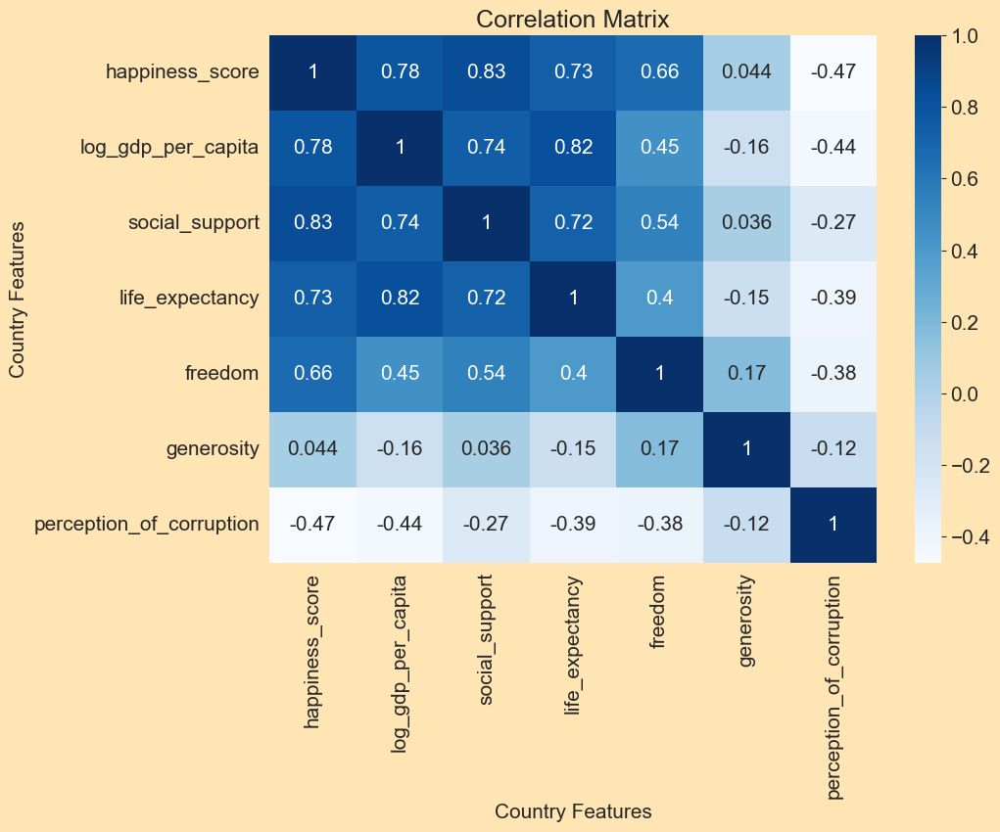

In [31]:
### What country feature correlates with happiness?

corr = data_2023.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [32]:
# Show what correlates to happiness

happiness_correlation_matrix = data_2023.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
happiness_correlation_matrix

happiness_score             1.000000
social_support              0.834623
log_gdp_per_capita          0.784368
life_expectancy             0.732440
freedom                     0.662922
generosity                  0.043687
perception_of_corruption   -0.471976
Name: happiness_score, dtype: float64

In [33]:
# Show all positive correlations

correlation_matrix = data_2023.corr(numeric_only = True)
corr_unstack = correlation_matrix.unstack().sort_values()
data_2023_high_corr = corr_unstack.sort_values(ascending=False)
data_2023_high_corr = data_2023_high_corr[(data_2023_high_corr < 1) & (data_2023_high_corr > 0.5)].drop_duplicates()
data_2023_high_corr

happiness_score     social_support        0.834623
life_expectancy     log_gdp_per_capita    0.821225
log_gdp_per_capita  happiness_score       0.784368
                    social_support        0.738087
happiness_score     life_expectancy       0.732440
life_expectancy     social_support        0.723622
freedom             happiness_score       0.662922
social_support      freedom               0.541808
dtype: float64

In [34]:
## Plot Data
# Order legend

legend = data_2023.groupby('region')['happiness_score'].count().reset_index().sort_values('happiness_score', ascending = False)['region'].tolist()

Text(0, 0.5, 'Social Support')

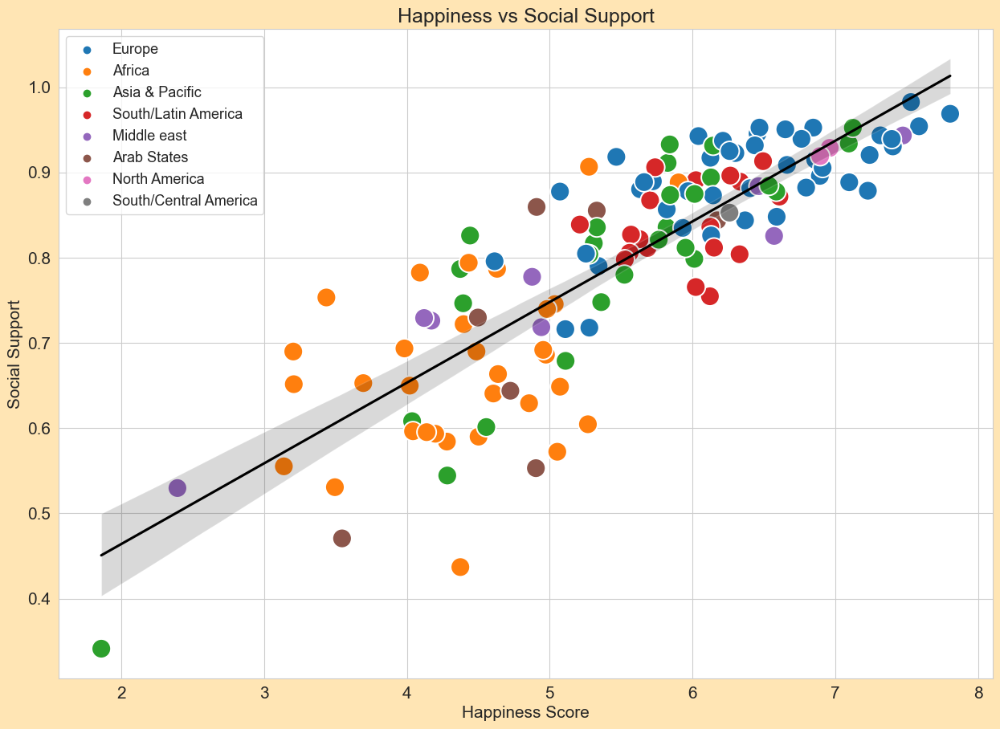

In [35]:
# Plot happiness_score and social_support

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Social Support')
ax = happ_gdp_corr = sns.scatterplot(x = data_2023.happiness_score,
                                     y = data_2023.social_support,
                                     hue_order = legend, 
                                     hue = data_2023['region'], 
                                     s = 300)
sns.regplot(data=data_2023, 
            x="happiness_score",
            y="social_support",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Social Support')

Text(0, 0.5, 'Log GDP per Capita')

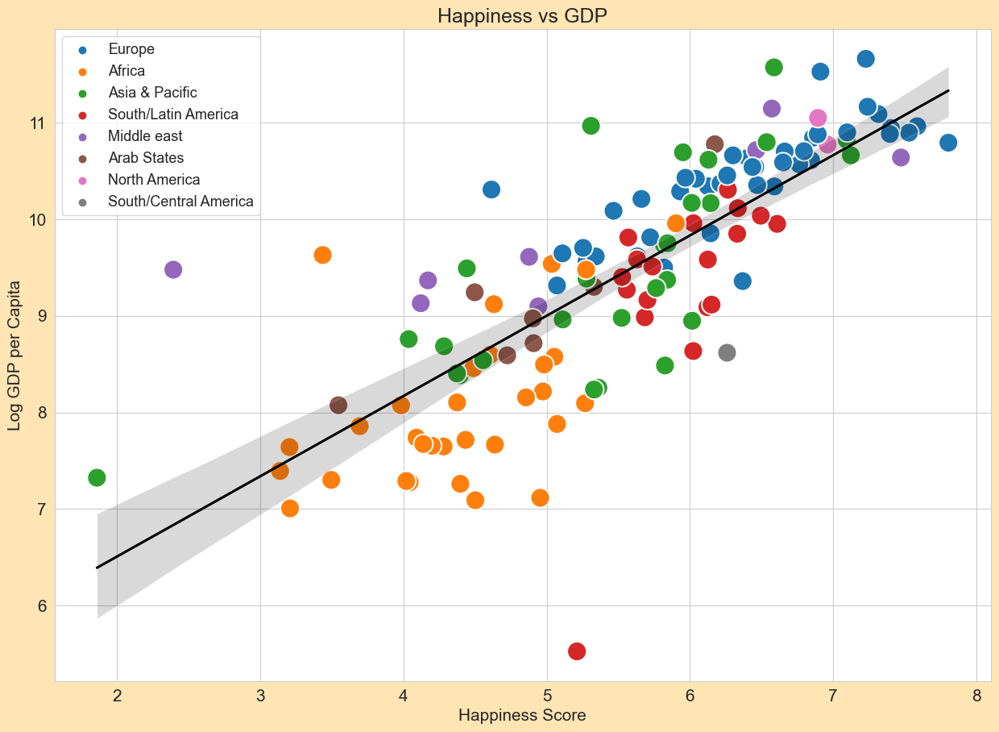

In [36]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = data_2023.happiness_score,
                                     y = data_2023.log_gdp_per_capita, 
                                     hue_order = legend, 
                                     hue = data_2023['region'], 
                                     s = 300)
sns.regplot(data=data_2023, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

Text(0, 0.5, 'Life Expectancy')

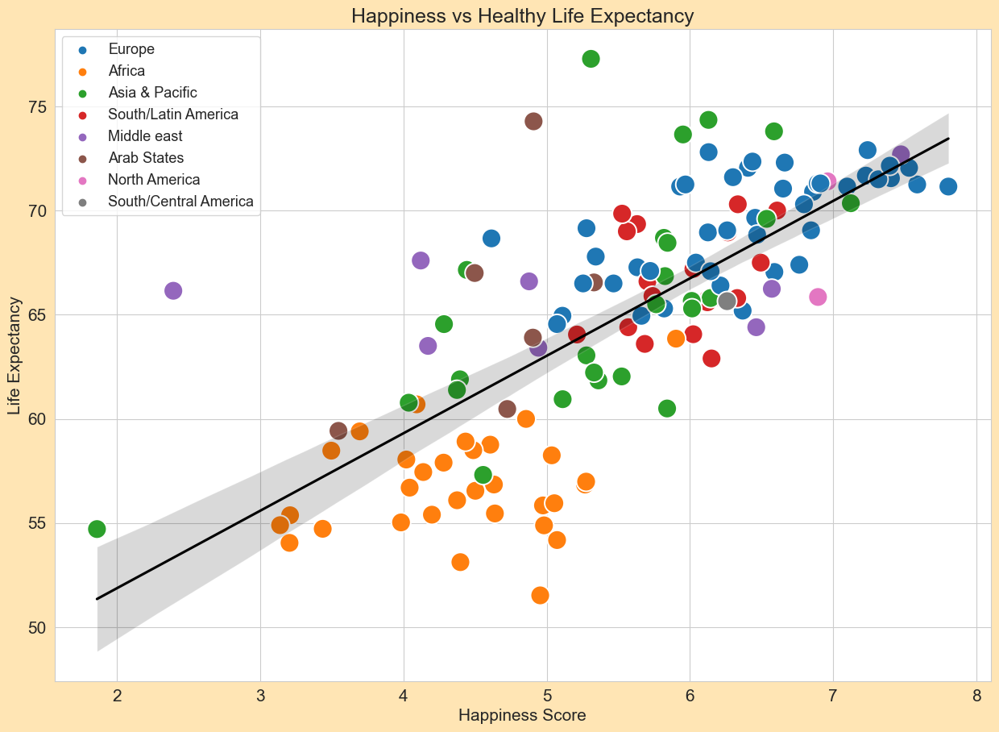

In [37]:
# Plot happiness_score and healthy_life_expectancy

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Healthy Life Expectancy')
ax = happ_gdp_corr = sns.scatterplot(x = data_2023.happiness_score,
                                     y = data_2023.life_expectancy, 
                                     hue_order = legend, 
                                     hue = data_2023['region'], 
                                     s = 300)
sns.regplot(data=data_2023, 
            x="happiness_score",
            y="life_expectancy",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Life Expectancy')

In [38]:
# Top 10 happiest countries in 2023

bar_high = data_2023.sort_values('happiness_score').sort_values('happiness_score', ascending=False).head(10)
bar_low = data_2023.sort_values('happiness_score').sort_values('happiness_score', ascending=True).head(10)

bar = pd.concat([bar_high,bar_low]).sort_values('happiness_score', ascending=False)
bar

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
39,Finland,Europe,7.8042,10.792010,0.968770,71.149994,0.961408,-0.018824,0.181745
32,Denmark,Europe,7.5864,10.962164,0.954112,71.250145,0.933533,0.134242,0.195814
52,Iceland,Europe,7.5296,10.895531,0.982533,72.050018,0.936349,0.210987,0.667848
58,Israel,Middle east,7.4729,10.638705,0.943344,72.697205,0.808866,-0.023080,0.708094
90,Netherlands,Europe,7.4030,10.942279,0.930499,71.550018,0.886875,0.212686,0.378929
117,Sweden,Europe,7.3952,10.882823,0.939249,72.150154,0.947971,0.164789,0.202448
95,Norway,Europe,7.3155,11.087730,0.943477,71.500023,0.946616,0.140636,0.282745
118,Switzerland,Europe,7.2401,11.164027,0.920439,72.899956,0.891074,0.026686,0.266348
72,Luxembourg,Europe,7.2279,11.659949,0.878501,71.675003,0.914938,0.023950,0.344978
91,New Zealand,Asia & Pacific,7.1229,10.661865,0.952398,70.350052,0.886574,0.174828,0.271205


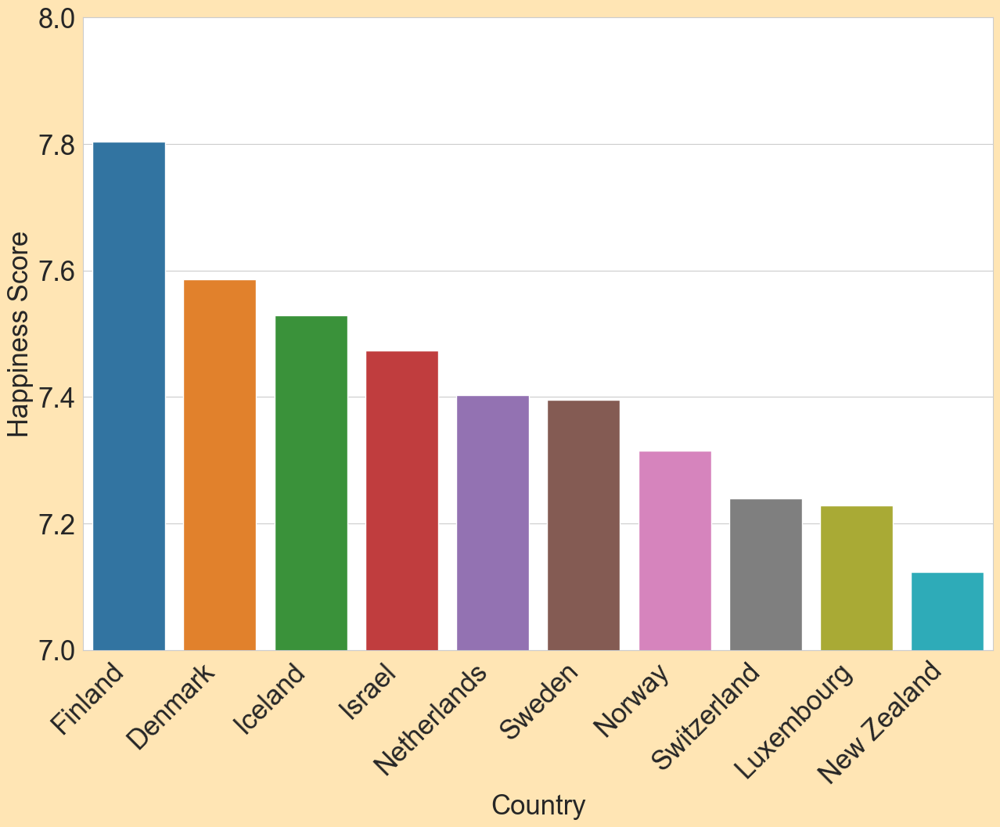

In [39]:
# Top 10 highest happiness_score in 2023

ax = sns.barplot(data=bar_high, x='country_name', y='happiness_score')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.ylim(7, 8)
plt.xlabel('Country', fontsize=25)
plt.ylabel('Happiness Score', fontsize=25)
plt.tick_params(labelsize=25)

plt.show()

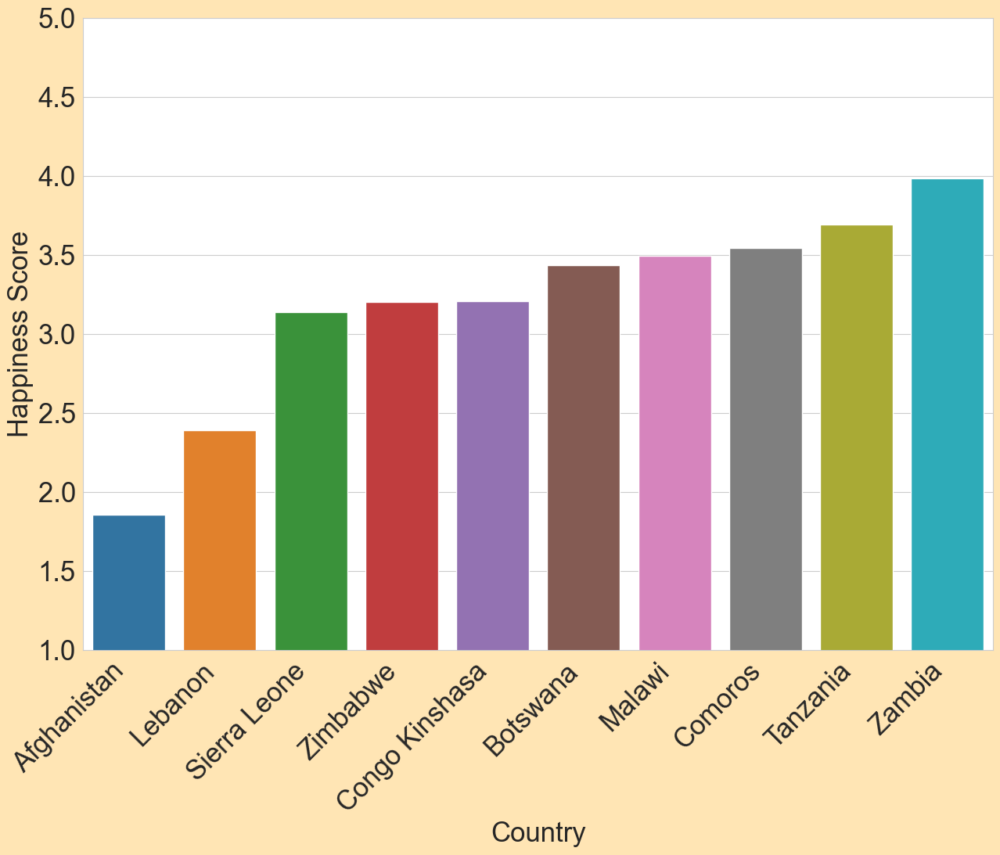

In [40]:
# Top 10 lowest happiness_score in 2023

ax = sns.barplot(data=bar_low, x='country_name', y='happiness_score')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.ylim(1, 5)
plt.xlabel('Country', fontsize=25)
plt.ylabel('Happiness Score', fontsize=25)
plt.tick_params(labelsize=25)

plt.show()

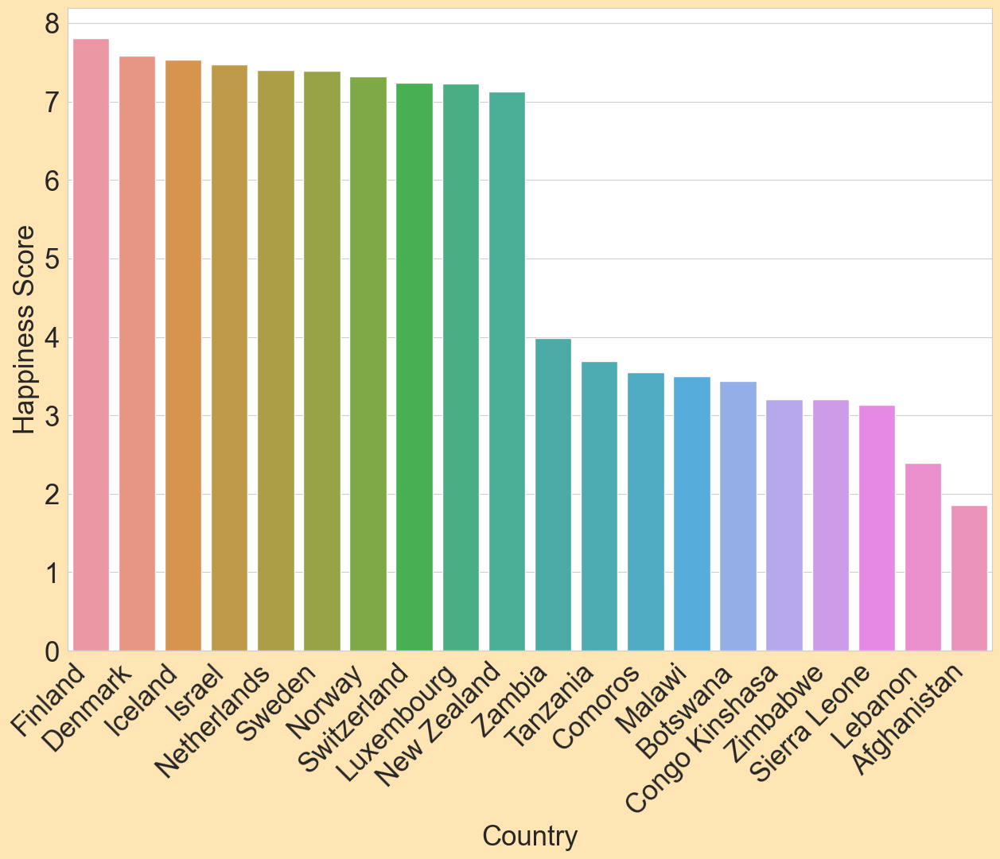

In [41]:
# Top 10 highest and lowest happiness_score

ax = sns.barplot(data=bar, x='country_name', y='happiness_score')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.xlabel('Country', fontsize=25)
plt.ylabel('Happiness Score', fontsize=25)
plt.tick_params(labelsize=25)

plt.show()

### All Years Prep

In [42]:
data.head(10)

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,0.414297,0.258195
1,Afghanistan,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,0.481421,0.237092
2,Afghanistan,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,0.516907,0.275324
3,Afghanistan,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,0.479835,0.267175
4,Afghanistan,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,0.613513,0.267919
5,Afghanistan,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204,0.547417,0.273328
6,Afghanistan,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,0.491641,0.374861
7,Afghanistan,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,0.491410,0.339276
8,Afghanistan,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,0.501409,0.348332
9,Afghanistan,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393,0.435270,0.371326


In [43]:
# Drop unwanted columns

data = data.drop(['Positive affect', 'Negative affect'], axis=1)

In [44]:
# Rename columns

data = data.rename(columns = {'Country name':'country_name',
                              'Life Ladder':'happiness_score',
                              'Log GDP per capita':'log_gdp_per_capita',
                              'Social support':'social_support',
                              'Healthy life expectancy at birth':'life_expectancy',
                              'Freedom to make life choices':'freedom',
                              'Generosity':'generosity',
                              'Perceptions of corruption':'perception_of_corruption'})
list(data.columns)

['country_name',
 'year',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [45]:
## Use country_region to add regions to data
# Create copy to work on

test_data = data

In [46]:
# Merge with country_region to add region

test_data = pd.merge(test_data, country_region, how = 'left', on = 'country_name')
data_columns = ['country_name',
                'region',
                'year',
                'happiness_score',
                'log_gdp_per_capita',
                'social_support',
                'life_expectancy',
                'freedom',
                'generosity',
                'perception_of_corruption']
test_data = test_data[data_columns]
test_data.head(10)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [47]:
test_data_country_region = test_data[['country_name','region']].drop_duplicates()
test_data_country_region

,country_name,region
0,Afghanistan,Asia & Pacific
14,Albania,Europe
29,Algeria,Arab States
39,Angola,Africa
43,Argentina,South/Latin America
60,Armenia,Europe
76,Australia,Asia & Pacific
92,Austria,Europe
107,Azerbaijan,Asia & Pacific
121,Bahrain,Arab States


In [48]:
test_data_country_region.shape

(165, 2)

In [49]:
# Check for NaN region

test_data_country_region['region'].isna().any()

True

In [50]:
# Locate NaN rows

test_data_country_region[test_data_country_region.isnull().any(axis=1)]

,country_name,region
421,Congo (Brazzaville),NaN
434,Congo (Kinshasa),NaN
491,Czechia,NaN
793,Hong Kong S.A.R. of China,NaN
943,Ivory Coast,NaN
1458,North Macedonia,NaN
1755,Somaliland region,NaN
1828,State of Palestine,NaN
1878,Syria,NaN
1885,Taiwan Province of China,NaN


In [51]:
country_region

,country_name,region
0,Afghanistan,Asia & Pacific
1,Aland Islands,Europe
2,Albania,Europe
3,Algeria,Arab States
4,American Samoa,Asia & Pacific
5,Andorra,Europe
6,Angola,Africa
7,Anguilla,South/Latin America
8,Antarctica,Asia & Pacific
9,Antigua and Barbuda,South/Latin America


In [52]:
# Correct NaN rows

test_data.loc[test_data['country_name'] == 'Congo (Brazzaville)', 'country_name'] = 'Congo Brazzaville'
test_data.loc[test_data['country_name'] == 'Congo (Kinshasa)', 'country_name'] = 'Congo Kinshasa'
test_data.loc[test_data['country_name'] == 'Czechia', 'country_name'] = 'Czech Republic'
test_data.loc[test_data['country_name'] == 'Hong Kong S.A.R. of China', 'country_name'] = 'Hong Kong'
test_data.loc[test_data['country_name'] == 'Ivory Coast', 'country_name'] = '''Côte D'Ivoire'''
test_data.loc[test_data['country_name'] == 'North Macedonia', 'country_name'] = 'Macedonia'
test_data.loc[test_data['country_name'] == 'Somaliland region', 'country_name'] = 'Somaliland'
test_data.loc[test_data['country_name'] == 'State of Palestine', 'country_name'] = 'Palestine'
test_data.loc[test_data['country_name'] == 'Taiwan Province of China', 'country_name'] = 'Taiwan'

country_region.loc[country_region['country_name'] == 'Syrian Arab Republic', 'country_name'] = 'Syria'

country_region.loc[249] = ['Somaliland', 'Africa']


In [53]:
# Merge again

test_data = test_data.rename(columns = {'region' : 'region_2'})
test_data = pd.merge(test_data, country_region, how = 'left', on = 'country_name')
test_data = test_data[data_columns]
test_data.head(30)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [54]:
# Check for NaN region again

test_data['region'].isna().any()

False

In [55]:
# Save dataframe

data = test_data

In [56]:
## Prepare data for analysis
# Check for duplicated rows 

test_data = data

test_data.duplicated().any()

False

In [57]:
# Check for missing data

test_data.isnull().sum()

country_name                  0
region                        0
year                          0
happiness_score               0
log_gdp_per_capita           20
social_support               13
life_expectancy              54
freedom                      33
generosity                   73
perception_of_corruption    116
dtype: int64

In [58]:
# Locate missing data in life_expectancy column

test_data[test_data['life_expectancy'].isnull() == True][['country_name', 'year', 'life_expectancy']]

,country_name,year,life_expectancy
793,Hong Kong,2006,NaN
794,Hong Kong,2008,NaN
795,Hong Kong,2009,NaN
796,Hong Kong,2010,NaN
797,Hong Kong,2011,NaN
798,Hong Kong,2012,NaN
799,Hong Kong,2014,NaN
800,Hong Kong,2016,NaN
801,Hong Kong,2017,NaN
802,Hong Kong,2019,NaN


In [59]:
# Fill in missing life_expectancy for Hong Kong and Kosovo with data from ourworldindata.org

world_life_expectancy.head(10)

,Data Source,World Development Indicators,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Last Updated Date,2023-09-19 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Country Name,Country Code,Indicator Name,Indicator Code,1960.000000,1961.000000,1962.000000,1963.000000,1964.000000,1965.000000,...,2013.000000,2014.000000,2015.000000,2016.000000,2017.000000,2018.000000,2019.000000,2020.000000,2021.000000,2022.0
4,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,64.152000,64.537000,64.752000,65.132000,65.294000,65.502000,...,75.636000,75.601000,75.683000,75.617000,75.903000,76.072000,76.248000,75.723000,74.626000,NaN
5,Africa Eastern and Southern,AFE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,44.085552,44.386697,44.752182,44.913159,45.479043,45.498338,...,60.709870,61.337917,61.856458,62.444050,62.922390,63.365863,63.755678,63.313860,62.454590,NaN
6,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.535000,33.068000,33.547000,34.016000,34.494000,34.953000,...,62.417000,62.545000,62.659000,63.136000,63.016000,63.081000,63.565000,62.575000,61.982000,NaN
7,Africa Western and Central,AFW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,37.845152,38.164950,38.735102,39.063715,39.335360,39.618038,...,55.673406,55.922229,56.195872,56.581678,56.888446,57.189139,57.555796,57.226373,56.988657,NaN
8,Angola,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,38.211000,37.267000,37.539000,37.824000,38.131000,38.495000,...,59.307000,60.040000,60.655000,61.092000,61.680000,62.144000,62.448000,62.261000,61.643000,NaN
9,Albania,ALB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,54.439000,55.634000,56.671000,57.844000,58.983000,60.019000,...,78.123000,78.407000,78.644000,78.860000,79.047000,79.184000,79.282000,76.989000,76.463000,NaN


In [60]:
# CLean world_life_expectancy for use

world_life_expectancy = world_life_expectancy.drop(world_life_expectancy.index[[0, 1, 2]]).reset_index().drop('index', axis=1)

new_header = world_life_expectancy.iloc[0].to_list()
world_life_expectancy = world_life_expectancy[1:]
world_life_expectancy.columns = new_header

In [61]:
world_life_expectancy.head(10)

,Country Name,Country Code,Indicator Name,Indicator Code,1960.0,1961.0,1962.0,1963.0,1964.0,1965.0,...,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0
1,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,64.152000,64.537000,64.752000,65.132000,65.294000,65.502000,...,75.636000,75.601000,75.683000,75.617000,75.903000,76.072000,76.248000,75.723000,74.626000,NaN
2,Africa Eastern and Southern,AFE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,44.085552,44.386697,44.752182,44.913159,45.479043,45.498338,...,60.709870,61.337917,61.856458,62.444050,62.922390,63.365863,63.755678,63.313860,62.454590,NaN
3,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.535000,33.068000,33.547000,34.016000,34.494000,34.953000,...,62.417000,62.545000,62.659000,63.136000,63.016000,63.081000,63.565000,62.575000,61.982000,NaN
4,Africa Western and Central,AFW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,37.845152,38.164950,38.735102,39.063715,39.335360,39.618038,...,55.673406,55.922229,56.195872,56.581678,56.888446,57.189139,57.555796,57.226373,56.988657,NaN
5,Angola,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,38.211000,37.267000,37.539000,37.824000,38.131000,38.495000,...,59.307000,60.040000,60.655000,61.092000,61.680000,62.144000,62.448000,62.261000,61.643000,NaN
6,Albania,ALB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,54.439000,55.634000,56.671000,57.844000,58.983000,60.019000,...,78.123000,78.407000,78.644000,78.860000,79.047000,79.184000,79.282000,76.989000,76.463000,NaN
7,Andorra,AND,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Arab World,ARB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,44.972899,45.676401,46.122576,46.972472,47.895758,48.232107,...,70.196514,70.492629,70.758222,70.943062,71.429596,71.633017,71.844626,70.923360,70.814483,NaN
9,United Arab Emirates,ARE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,48.811000,49.695000,50.686000,51.584000,52.848000,53.985000,...,78.853000,79.044000,79.223000,79.335000,79.504000,79.627000,79.726000,78.946000,78.710000,NaN
10,Argentina,ARG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,63.978000,64.360000,64.244000,64.449000,64.363000,64.593000,...,76.491000,76.755000,76.760000,76.308000,76.833000,76.999000,77.284000,75.892000,75.390000,NaN


In [62]:
# Drop unnecessary columns

world_life_expectancy_columns = ['Country Name',2005.0,
                                                 2006.0,
                                                 2007.0,
                                                 2008.0,
                                                 2009.0,
                                                 2010.0,
                                                 2011.0,
                                                 2012.0,
                                                 2013.0,
                                                 2014.0,
                                                 2015.0,
                                                 2016.0,
                                                 2017.0,
                                                 2018.0,
                                                 2019.0,
                                                 2020.0,
                                                 2021.0,
                                                 2022.0]
world_life_expectancy = world_life_expectancy[world_life_expectancy_columns]
list(world_life_expectancy.columns)

['Country Name',
 2005.0,
 2006.0,
 2007.0,
 2008.0,
 2009.0,
 2010.0,
 2011.0,
 2012.0,
 2013.0,
 2014.0,
 2015.0,
 2016.0,
 2017.0,
 2018.0,
 2019.0,
 2020.0,
 2021.0,
 2022.0]

In [63]:
# Rename Columns

world_life_expectancy = world_life_expectancy.rename(columns = {'Country Name' : 'country_name',
                                                                2005.0 : 2005,
                                                                2006.0 : 2006,
                                                                2007.0 : 2007,
                                                                2008.0 : 2008,
                                                                2009.0 : 2009,
                                                                2010.0 : 2010,
                                                                2011.0 : 2011,
                                                                2012.0 : 2012,
                                                                2013.0 : 2013,
                                                                2014.0 : 2014,
                                                                2015.0 : 2015,
                                                                2016.0 : 2016,
                                                                2017.0 : 2017,
                                                                2018.0 : 2018,
                                                                2019.0 : 2019,
                                                                2020.0 : 2020,
                                                                2021.0 : 2021,
                                                                2022.0 : 2022})
list(world_life_expectancy.columns)

['country_name',
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016,
 2017,
 2018,
 2019,
 2020,
 2021,
 2022]

In [64]:
# Melt world_life_expectancy to match format of data_2

melted_world_life_expectancy = pd.melt(world_life_expectancy, id_vars=['country_name'], var_name='year', value_name='life_expectancy')
world_life_expectancy = melted_world_life_expectancy.sort_values(['country_name','year']).reset_index().drop('index', axis=1)
world_life_expectancy.head(10)

,country_name,year,life_expectancy
0,Afghanistan,2005,58.361
1,Afghanistan,2006,58.684
2,Afghanistan,2007,59.111
3,Afghanistan,2008,59.852
4,Afghanistan,2009,60.364
5,Afghanistan,2010,60.851
6,Afghanistan,2011,61.419
7,Afghanistan,2012,61.923
8,Afghanistan,2013,62.417
9,Afghanistan,2014,62.545


In [65]:
# Check table for NaN rows

world_life_expectancy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4788 entries, 0 to 4787
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country_name     4788 non-null   object 
 1   year             4788 non-null   object 
 2   life_expectancy  4383 non-null   float64
dtypes: float64(1), object(2)
memory usage: 112.3+ KB


In [66]:
# Drop NaN rows

world_life_expectancy = world_life_expectancy[world_life_expectancy['life_expectancy'].isna() == False].reset_index().drop('index', axis =1)

world_life_expectancy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4383 entries, 0 to 4382
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country_name     4383 non-null   object 
 1   year             4383 non-null   object 
 2   life_expectancy  4383 non-null   float64
dtypes: float64(1), object(2)
memory usage: 102.9+ KB


In [67]:
# Rename column to avoid duplicates during merge.
# Rename country_name to match data_2

world_life_expectancy = world_life_expectancy.rename(columns = {'life_expectancy' : 'life_expectancy_new'})

world_life_expectancy.loc[world_life_expectancy['country_name'] == 'Hong Kong SAR, China', 'country_name'] = 'Hong Kong'

In [68]:
# Merge world_life_expectancy with data_2

merge = pd.merge(test_data,world_life_expectancy, how = 'left', on = ['country_name','year'])
merge.head(30)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,life_expectancy_new
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,59.852
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,60.364
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,60.851
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,61.419
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,61.923
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204,62.417
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,62.545
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,62.659
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,63.136
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393,63.016


In [69]:
merge[(merge['life_expectancy'].isna() == True) & (merge['life_expectancy_new'].isna() == False)][['country_name','year', 'life_expectancy', 'life_expectancy_new']]

,country_name,year,life_expectancy,life_expectancy_new
793,Hong Kong,2006,NaN,82.375610
794,Hong Kong,2008,NaN,82.375610
795,Hong Kong,2009,NaN,82.775610
796,Hong Kong,2010,NaN,82.978049
797,Hong Kong,2011,NaN,83.421951
798,Hong Kong,2012,NaN,83.480488
799,Hong Kong,2014,NaN,83.980488
800,Hong Kong,2016,NaN,84.226829
801,Hong Kong,2017,NaN,84.680488
802,Hong Kong,2019,NaN,85.180488


In [70]:
# Replace life_expectancy of Hong Kong and Kosovo with new data

merge['life_expectancy'] = merge['life_expectancy'].combine_first(merge['life_expectancy_new'])
merge[merge['country_name'].isin (['Hong Kong', 'Kosovo']) == True][['country_name','year', 'life_expectancy', 'life_expectancy_new']]

,country_name,year,life_expectancy,life_expectancy_new
793,Hong Kong,2006,82.375610,82.375610
794,Hong Kong,2008,82.375610,82.375610
795,Hong Kong,2009,82.775610,82.775610
796,Hong Kong,2010,82.978049,82.978049
797,Hong Kong,2011,83.421951,83.421951
798,Hong Kong,2012,83.480488,83.480488
799,Hong Kong,2014,83.980488,83.980488
800,Hong Kong,2016,84.226829,84.226829
801,Hong Kong,2017,84.680488,84.680488
802,Hong Kong,2019,85.180488,85.180488


In [71]:
# Drop life_expectancy_new and save as data_2

test_data = merge.drop('life_expectancy_new', axis=1)
test_data = test_data[data_columns]
test_data.head(10)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [72]:
# Check for remaining NaN rows

test_data[test_data['life_expectancy'].isna() == True][['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1046,Kosovo,2022,NaN
1755,Somaliland,2009,NaN
1756,Somaliland,2010,NaN
1757,Somaliland,2011,NaN
1758,Somaliland,2012,NaN
1833,Palestine,2011,NaN
1834,Palestine,2012,NaN
1835,Palestine,2013,NaN
1836,Palestine,2014,NaN
1837,Palestine,2015,NaN


In [73]:
# Fill in missing life_expectancy for Taiwan with data from macrotrends.net

taiwan_life_expectancy

,year,life_expectancy_new
0,2022,80.87
1,2021,80.70
2,2020,80.53
3,2019,80.36
4,2018,80.19
5,2017,80.00
6,2016,79.82
7,2015,79.63
8,2014,79.45
9,2013,79.26


In [74]:
# Add country_name column 

taiwan_life_expectancy['country_name'] = 'Taiwan'
taiwan_life_expectancy

,year,life_expectancy_new,country_name
0,2022,80.87,Taiwan
1,2021,80.70,Taiwan
2,2020,80.53,Taiwan
3,2019,80.36,Taiwan
4,2018,80.19,Taiwan
5,2017,80.00,Taiwan
6,2016,79.82,Taiwan
7,2015,79.63,Taiwan
8,2014,79.45,Taiwan
9,2013,79.26,Taiwan


In [75]:
# Merge data_2 with taiwan_life_expectancy

merge = pd.merge(test_data, taiwan_life_expectancy, how='left', on = ['country_name','year'])
merge

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,life_expectancy_new
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,NaN
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,NaN
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,NaN
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,NaN
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,NaN
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204,NaN
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,NaN
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,NaN
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,NaN
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393,NaN


In [76]:
# Set life_expectancy for Taiwan to NaN so it can be updated

merge.loc[merge['country_name'] == 'Taiwan', 'life_expectancy'] = np.NaN

In [77]:
# Replace life_expectancy of Taiwan with new data

merge['life_expectancy'] = merge['life_expectancy'].combine_first(merge['life_expectancy_new'])
merge[merge['country_name'] == 'Taiwan'] [['country_name','year','life_expectancy','life_expectancy_new']]

,country_name,year,life_expectancy,life_expectancy_new
1885,Taiwan,2006,77.69,77.69
1886,Taiwan,2008,78.19,78.19
1887,Taiwan,2010,78.62,78.62
1888,Taiwan,2011,78.83,78.83
1889,Taiwan,2012,79.05,79.05
1890,Taiwan,2013,79.26,79.26
1891,Taiwan,2014,79.45,79.45
1892,Taiwan,2015,79.63,79.63
1893,Taiwan,2016,79.82,79.82
1894,Taiwan,2017,80.00,80.00


In [78]:
# Drop life_expectancy_new and save as data_2

test_data = merge.drop('life_expectancy_new', axis=1)
test_data = test_data[data_columns].sort_values(['country_name','year']).reset_index().drop('index', axis=1)
test_data.head(10)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [79]:
# Check for remaining NaN rows

test_data[test_data['life_expectancy'].isna() == True][['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1046,Kosovo,2022,NaN
1507,Palestine,2011,NaN
1508,Palestine,2012,NaN
1509,Palestine,2013,NaN
1510,Palestine,2014,NaN
1511,Palestine,2015,NaN
1512,Palestine,2016,NaN
1513,Palestine,2017,NaN
1514,Palestine,2018,NaN
1515,Palestine,2019,NaN


In [80]:
# Enter life_expectancy for Kosovo 2022 and Palestine manually

test_data.loc[1046, 'life_expectancy'] = 79.5237
test_data.loc[1502, 'life_expectancy'] = 71.92
test_data.loc[1503, 'life_expectancy'] = 72.15
test_data.loc[1504, 'life_expectancy'] = 72.41
test_data.loc[1505, 'life_expectancy'] = 72.61
test_data.loc[1506, 'life_expectancy'] = 73.00
test_data.loc[1507, 'life_expectancy'] = 73.24
test_data.loc[1508, 'life_expectancy'] = 73.47
test_data.loc[1509, 'life_expectancy'] = 74.03
test_data.loc[1510, 'life_expectancy'] = 72.62
test_data.loc[1511, 'life_expectancy'] = 74.41
test_data.loc[1512, 'life_expectancy'] = 74.55
test_data.loc[1513, 'life_expectancy'] = 74.83
test_data.loc[1514, 'life_expectancy'] = 74.79
test_data.loc[1515, 'life_expectancy'] = 75.24
test_data.loc[1516, 'life_expectancy'] = 75.40

test_data[test_data['country_name'] == 'Palestine'] [['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1502,Palestine,2006,71.92
1503,Palestine,2007,72.15
1504,Palestine,2008,72.41
1505,Palestine,2009,72.61
1506,Palestine,2010,73.00
1507,Palestine,2011,73.24
1508,Palestine,2012,73.47
1509,Palestine,2013,74.03
1510,Palestine,2014,72.62
1511,Palestine,2015,74.41


In [81]:
# The rest of the missing data is not easily availble and will be left as is

test_data[test_data['life_expectancy'].isna() == True][['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1770,Somaliland,2009,NaN
1771,Somaliland,2010,NaN
1772,Somaliland,2011,NaN
1773,Somaliland,2012,NaN


In [82]:
# Check for NaN rows in data_2
# The rest of the missing data is not easily availble and will be left as is

test_data.isnull().sum()

country_name                  0
region                        0
year                          0
happiness_score               0
log_gdp_per_capita           20
social_support               13
life_expectancy               4
freedom                      33
generosity                   73
perception_of_corruption    116
dtype: int64

In [83]:
# Save progress on data_2 as data

data = test_data

In [84]:
## Combine data_2023 and data
# Create duplicates

test_data = data
test_data_2023 = data_2023

# Check that columns names are the same

print(test_data.shape, test_data_2023.shape)

(2199, 10) (137, 9)


In [85]:
list(test_data.columns)

['country_name',
 'region',
 'year',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [86]:
list(test_data_2023.columns)

['country_name',
 'region',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [87]:
# Add year column to data_2023

test_data_2023['year'] = 2023

In [88]:
test_data = pd.concat([data, test_data_2023])
print(test_data.shape, test_data[test_data['year'] == 2023].shape, test_data[test_data['year'] != 2023].shape)

(2336, 10) (137, 10) (2199, 10)


In [89]:
# Reset index and save as data

data = test_data.sort_values(['country_name', 'year']).reset_index().drop('index', axis=1)

### Find outliers in data

In [90]:
test_data = data

test_data.groupby('year')['happiness_score'].mean().reset_index()

,year,happiness_score
0,2005,6.446164
1,2006,5.196935
2,2007,5.418291
3,2008,5.418554
4,2009,5.457640
5,2010,5.496782
6,2011,5.424088
7,2012,5.443612
8,2013,5.393302
9,2014,5.386267


In [91]:
# Find countries with an unusually low amount of reports.

test_data_n_reports_country = test_data.groupby('country_name')['happiness_score'].count().to_frame('n_reports').reset_index()
test_data_n_reports_country.head(10)

,country_name,n_reports
0,Afghanistan,15
1,Albania,16
2,Algeria,11
3,Angola,4
4,Argentina,18
5,Armenia,17
6,Australia,17
7,Austria,16
8,Azerbaijan,14
9,Bahrain,12


In [92]:
n_reports_std = test_data_n_reports_country['n_reports'].std()
n_reports_mean = test_data_n_reports_country['n_reports'].mean()
print(n_reports_mean, n_reports_std, n_reports_std * 2)

14.157575757575758 4.811003033128803 9.622006066257606


In [93]:
test_data_n_reports_country['within_2_std'] = test_data_n_reports_country['n_reports'].between(n_reports_mean - (n_reports_std * 2), n_reports_mean + (n_reports_std * 2))

In [94]:
# Countries with an unusually low amount of reports, may be excluded due to skew 

test_data_n_reports_country[test_data_n_reports_country['within_2_std'] == False]

,country_name,n_reports,within_2_std
3,Angola,4,False
13,Belize,2,False
15,Bhutan,3,False
36,Cuba,1,False
41,Djibouti,4,False
47,Eswatini,3,False
59,Guyana,1,False
83,Lesotho,4,False
92,Maldives,1,False
112,Oman,1,False


### Data All Years Analysis

In [95]:
test_data = data

In [96]:
print(test_data.shape)
test_data.describe()

(2336, 10)


,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,2336.000000,2316.000000,2323.000000,2332.000000,2303.000000,2263.000000,2220.000000
mean,5.482776,9.393316,0.809993,63.770831,0.750212,0.001449,0.743972
std,1.126221,1.156463,0.121455,7.194730,0.138948,0.160037,0.185325
min,1.281271,5.526723,0.228217,6.720000,0.257534,-0.337527,0.035198
25%,4.646820,8.502017,0.744791,59.480000,0.659464,-0.108697,0.687844
50%,5.439057,9.502519,0.835509,65.255001,0.771577,-0.020794,0.798790
75%,6.314347,10.380333,0.904686,69.000000,0.860766,0.095138,0.867713
max,8.018934,11.663788,0.987343,85.497561,0.985178,0.702708,0.983276


In [97]:
n_reports_country = test_data.groupby('country_name')['happiness_score'].count().sort_values(ascending=False).reset_index().rename(columns = {'happiness_score':'n_reports'})
n_reports_country.head(10)

,country_name,n_reports
0,Lebanon,18
1,Indonesia,18
2,Kyrgyzstan,18
3,Kenya,18
4,Kazakhstan,18
5,Jordan,18
6,Japan,18
7,Italy,18
8,Israel,18
9,India,18


In [98]:
n_reports_country.groupby('n_reports')['country_name'].count().sort_values(ascending=False).reset_index().rename(columns = {'country_name':'n_countries'})

,n_reports,n_countries
0,18,50
1,17,25
2,16,19
3,15,14
4,11,9
5,13,8
6,14,7
7,5,6
8,12,5
9,1,5


In [99]:
test_data.groupby('country_name')['happiness_score'].mean().sort_values(ascending=False).reset_index().head(10)

,country_name,happiness_score
0,Denmark,7.668593
1,Finland,7.630711
2,Norway,7.469026
3,Iceland,7.465061
4,Switzerland,7.456454
5,Netherlands,7.449111
6,Sweden,7.378256
7,Canada,7.303492
8,Israel,7.277166
9,New Zealand,7.269344


In [100]:
test_data.groupby('year')['happiness_score'].mean().sort_values(ascending=False).reset_index()

,year,happiness_score
0,2005,6.446164
1,2020,5.727539
2,2021,5.636193
3,2022,5.585126
4,2019,5.570995
5,2023,5.539755
6,2018,5.498683
7,2010,5.496782
8,2017,5.460421
9,2009,5.457640


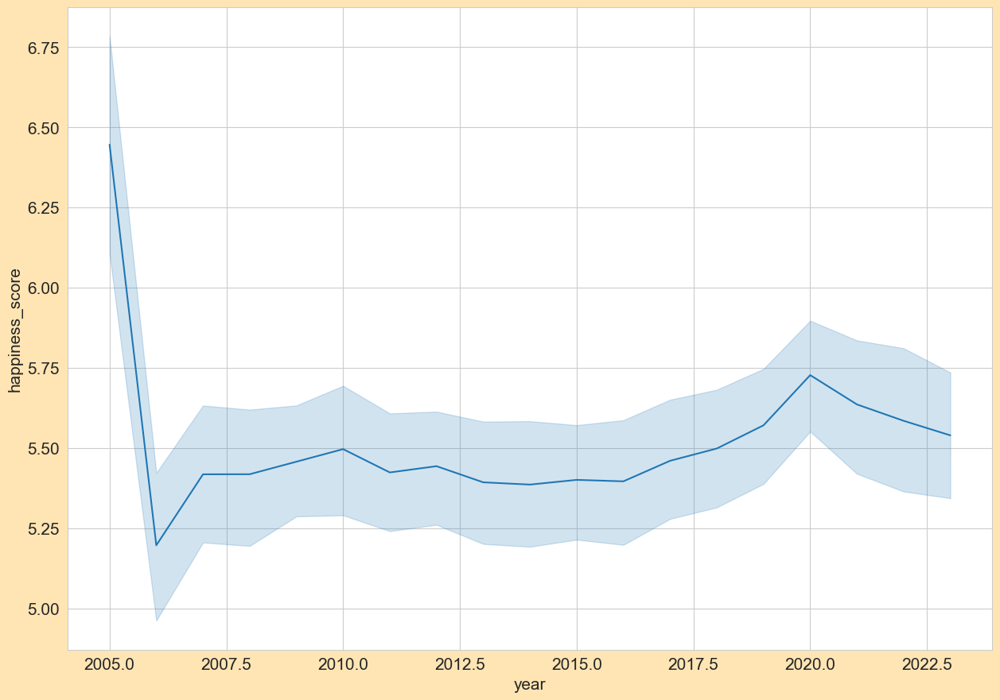

In [101]:
# Change of world happiness over time

sns.lineplot(data=test_data, x='year',y='happiness_score')
plt.show()

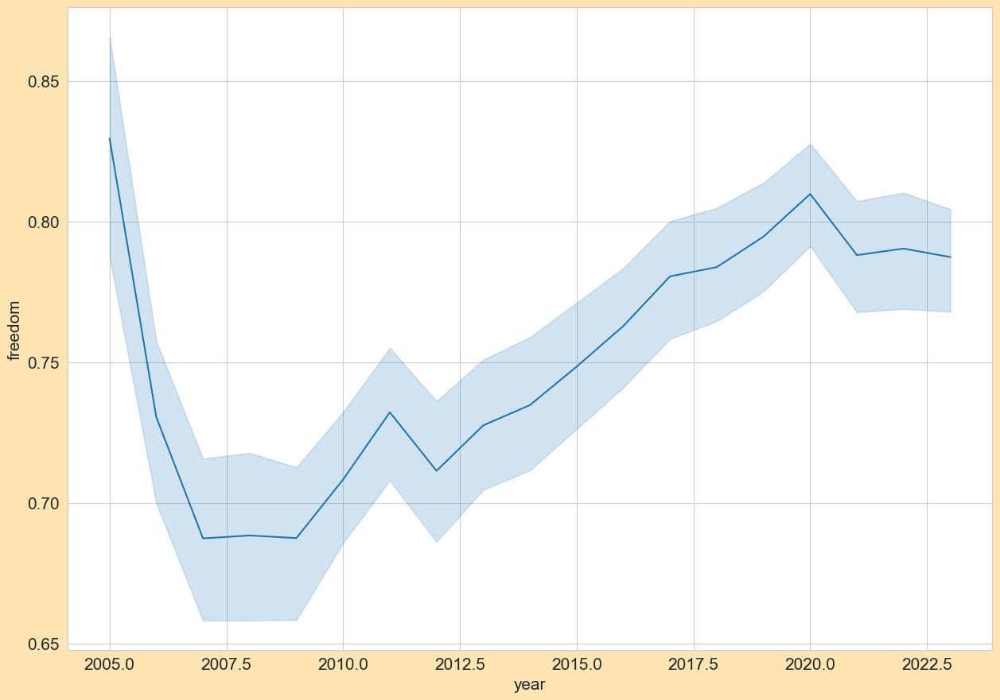

In [102]:
sns.lineplot(data=test_data, x='year',y='freedom')
plt.show()

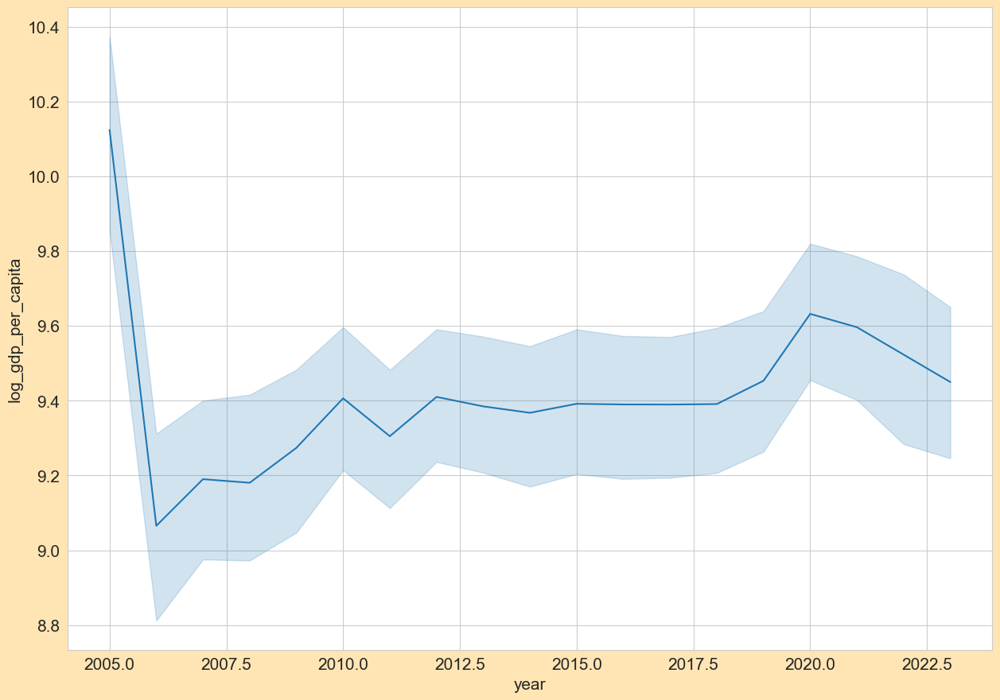

In [103]:
sns.lineplot(data=test_data, x='year',y='log_gdp_per_capita')
plt.show()

In [104]:
#################

## Which countries had the largest increase or decrease in happiness score since 2007

In [105]:
###############


test_data_n_reports_year = test_data.groupby('year')['happiness_score'].count().to_frame('n_reports').reset_index()
test_data_n_reports_year

,year,n_reports
0,2005,27
1,2006,89
2,2007,102
3,2008,110
4,2009,114
5,2010,124
6,2011,146
7,2012,141
8,2013,136
9,2014,144


Text(0, 0.5, 'Log GDP per Capita')

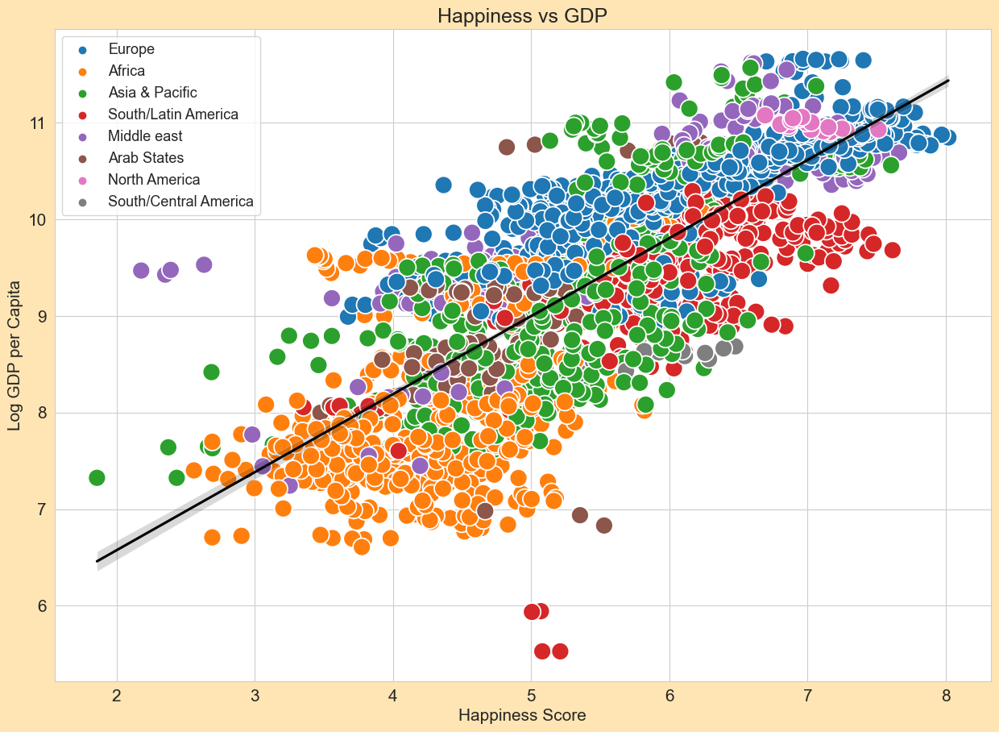

In [106]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita, 
                                     hue_order = ['Europe',
                                                  'Africa',
                                                  'Asia & Pacific',
                                                  'South/Latin America',
                                                  'Middle east',
                                                  'Arab States',
                                                  'North America',
                                                  'South/Central America'], 
                                     hue = data['region'], 
                                     s = 250)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

Text(0, 0.5, 'Log GDP per Capita')

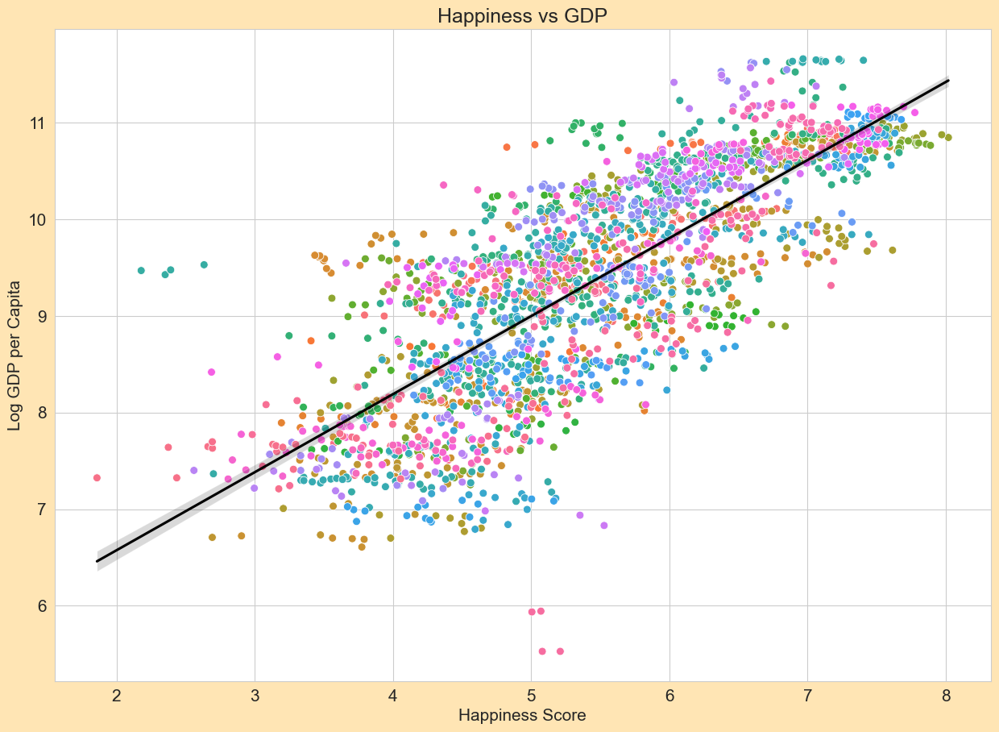

In [107]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita,
                                     hue = data['country_name'], 
                                     s = 50)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

ax.get_legend().remove()
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

Text(0, 0.5, 'Log GDP per Capita')

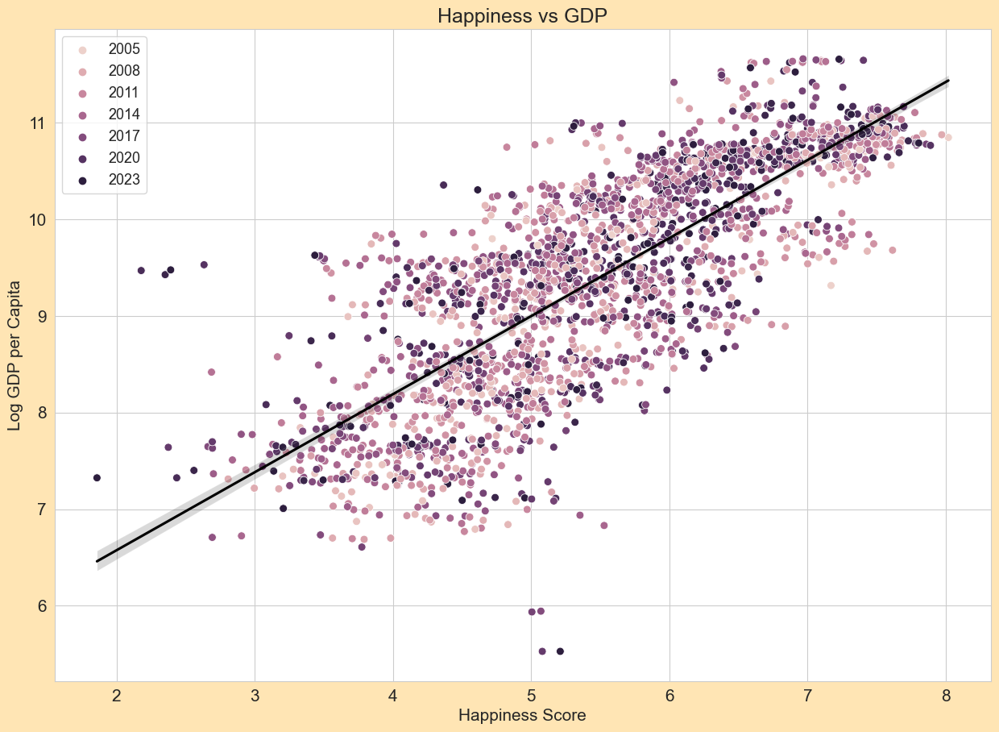

In [108]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita,
                                     hue = data['year'], 
                                     s = 50)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

In [109]:
###############

In [110]:
test_data_pivot = pd.pivot(test_data, index='year', columns='country_name', values='happiness_score')

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_15032\1586914393.py:1: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  test_data_pivot = pd.pivot(test_data, index='year', columns='country_name', values='happiness_score')


In [111]:
test_data_pivot

country_name,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
2005,NaN,NaN,NaN,NaN,NaN,NaN,7.340688,NaN,NaN,NaN,...,NaN,6.983557,NaN,NaN,NaN,7.169621,NaN,NaN,NaN,NaN
2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,NaN,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,NaN,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,NaN,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,5.700523,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,5.936869,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,4.823976,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,5.027187,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,6.689711,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188


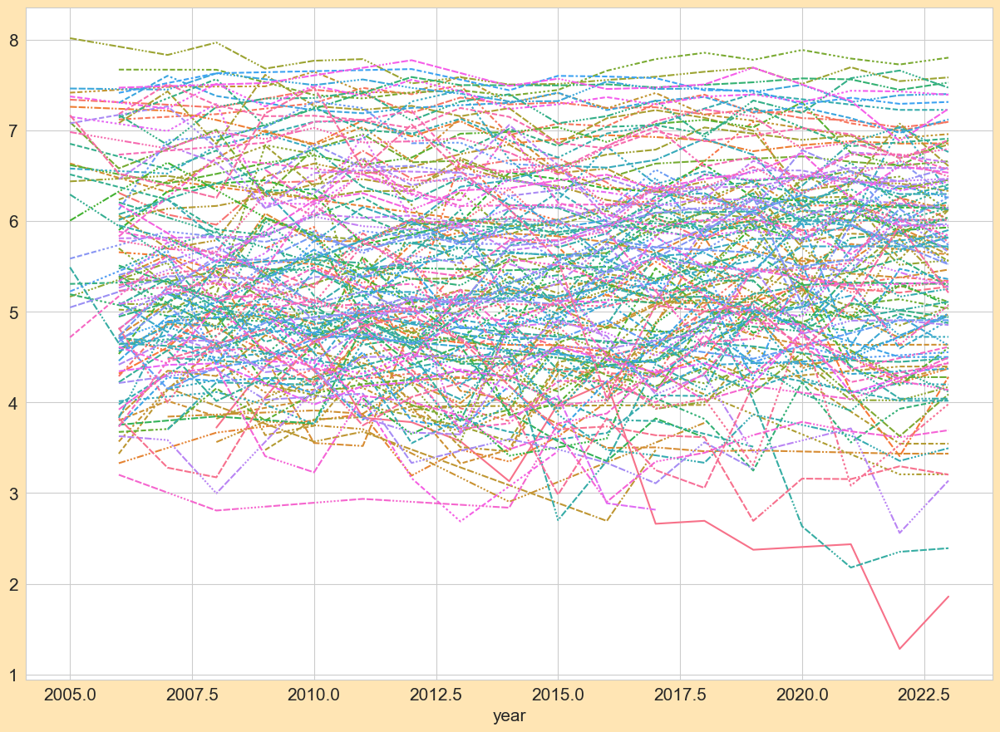

In [112]:
sns.lineplot(data=test_data_pivot)

plt.legend([],[], frameon=False)

In [113]:
####################

In [114]:
test_data = data
print(test_data.groupby('year')['year'].count(), test_data.groupby('year')['year'].count().describe())

year
2005     27
2006     89
2007    102
2008    110
2009    114
2010    124
2011    146
2012    141
2013    136
2014    144
2015    142
2016    141
2017    147
2018    141
2019    143
2020    116
2021    122
2022    114
2023    137
Name: year, dtype: int64 count     19.000000
mean     122.947368
std       28.712122
min       27.000000
25%      114.000000
50%      136.000000
75%      141.500000
max      147.000000
Name: year, dtype: float64


In [115]:
##### 1 consecutive year
test_data = data
test_data_2 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [116]:
# Find the difference between 1 consecutive years by country

test_data_2['diff']=test_data_2.groupby(['country_name',test_data_2['year'].diff().ne(1).cumsum()])['happiness_score'].diff(1)
test_data_2.head(20)

,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,0.678188
2,Afghanistan,2010,4.758381,0.356603
3,Afghanistan,2011,3.831719,-0.926662
4,Afghanistan,2012,3.782938,-0.048782
5,Afghanistan,2013,3.572100,-0.210837
6,Afghanistan,2014,3.130896,-0.441205
7,Afghanistan,2015,3.982855,0.851959
8,Afghanistan,2016,4.220169,0.237314
9,Afghanistan,2017,2.661718,-1.558450


In [117]:
top_1year_index = test_data_2.sort_values('diff', ascending = False).head(5).index.tolist()
bottom_1year_index = test_data_2.sort_values('diff', ascending = True).head(5).index.tolist()

In [118]:
top_1year_index

[132, 627, 2315, 614, 246]

In [119]:
bottom_1year_index

[629, 1196, 2316, 9, 2264]

In [120]:
a = top_1year_index
a = [x - 1 for x in a]
a

[131, 626, 2314, 613, 245]

In [121]:
top_1year_index = top_1year_index + a
top_1year_index.sort()
top_1year_index

[131, 132, 245, 246, 613, 614, 626, 627, 2314, 2315]

In [122]:
top_1year = test_data_2.iloc[top_1year_index].reset_index().drop('index', axis=1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,0.203211
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,-0.033099
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,-0.645637
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,-0.104041
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,-0.734692
9,Zambia,2020,4.837992,1.531196


In [123]:


top_1year['diff'] = top_1year['happiness_score'] - top_1year.groupby('country_name')['happiness_score'].shift(1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,NaN
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,NaN
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,NaN
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,NaN
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,NaN
9,Zambia,2020,4.837992,1.531196


<Axes: xlabel='year', ylabel='happiness_score'>

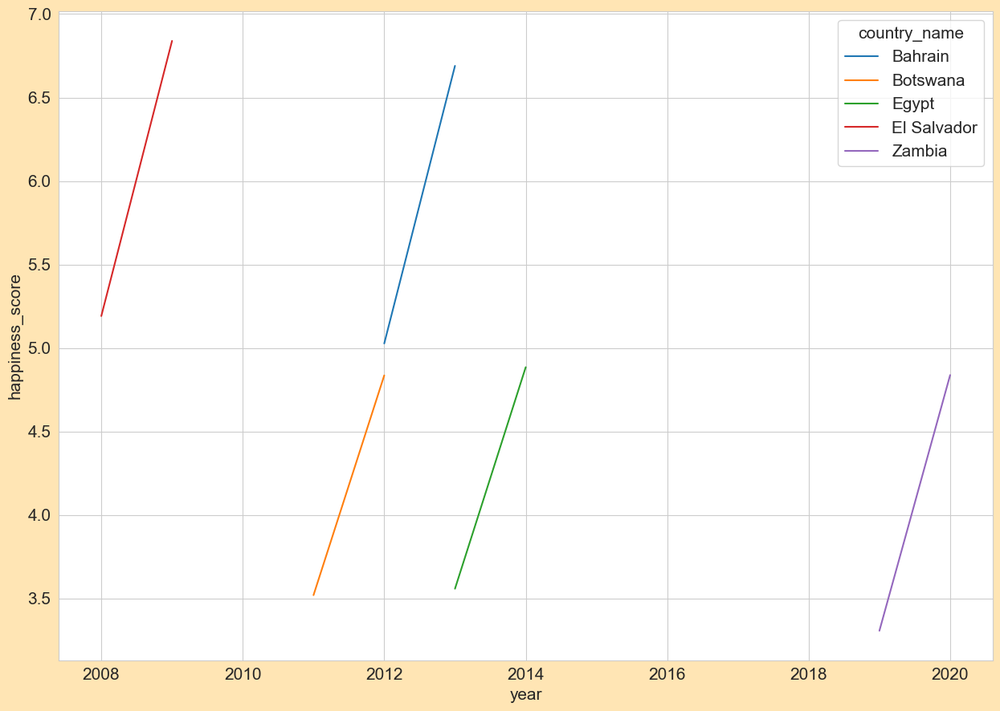

In [124]:
sns.lineplot(data=top_1year, x = 'year', y = 'happiness_score', hue  = 'country_name')

In [125]:
top_1year_countries = top_1year['country_name'].drop_duplicates().tolist()

top_1year_all = test_data_2[test_data_2['country_name'].isin(top_1year_countries)]

<Axes: xlabel='year', ylabel='happiness_score'>

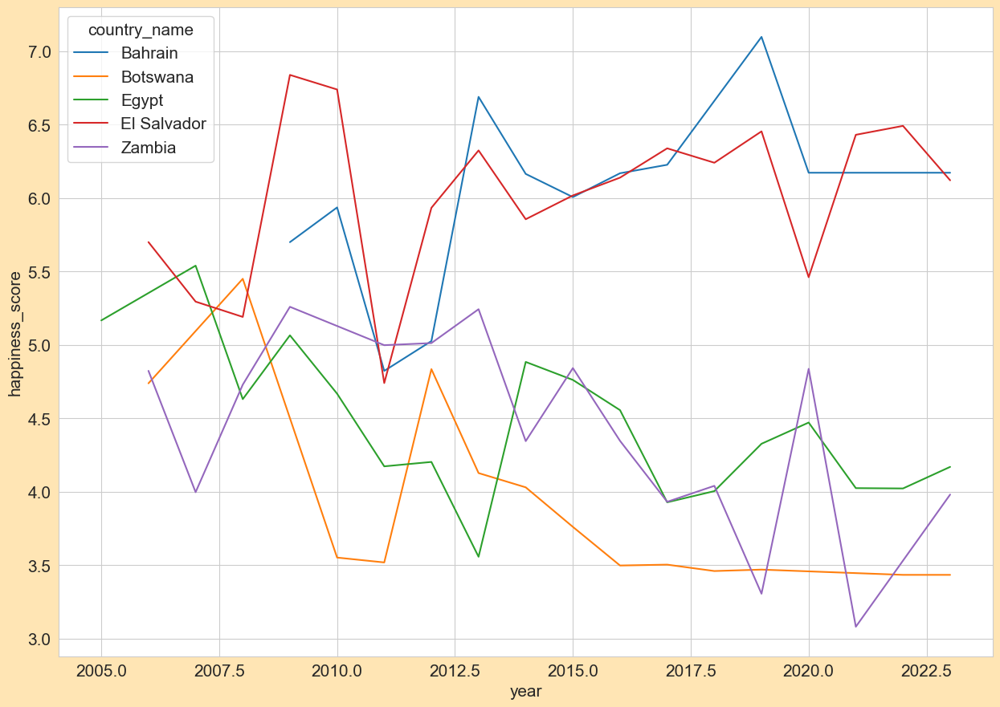

In [126]:
sns.lineplot(data=top_1year_all, x = 'year', y = 'happiness_score', hue = 'country_name')

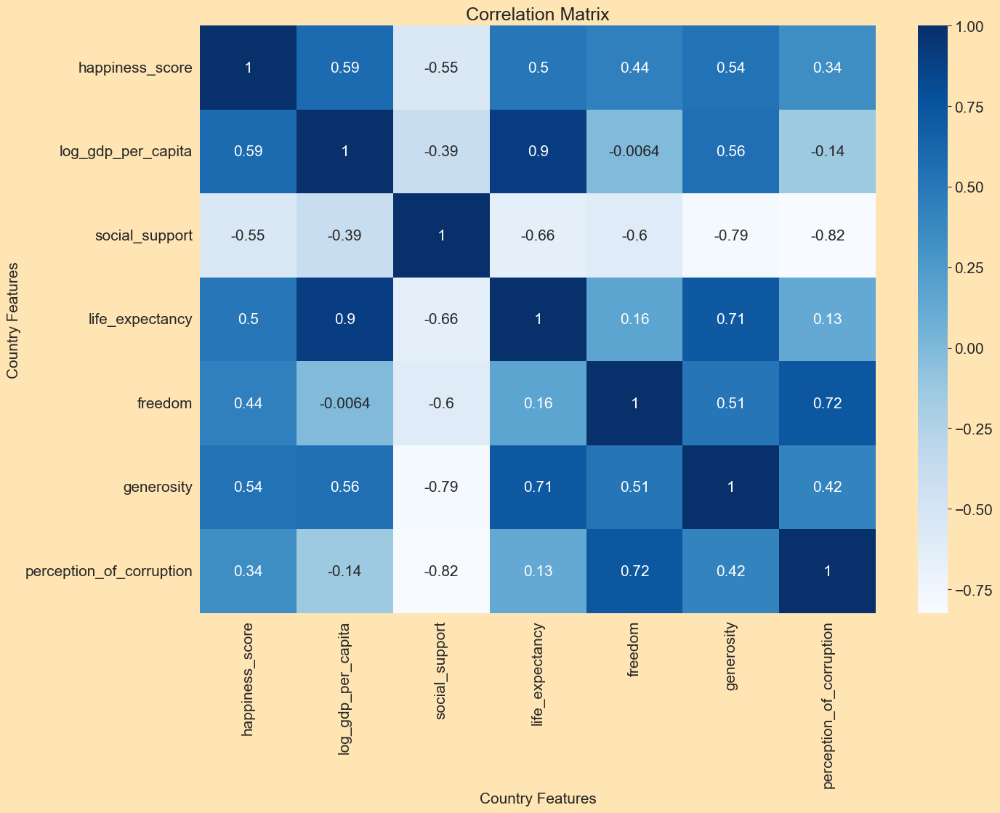

In [127]:
corr = data[data['country_name'] == 'Bahrain'].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

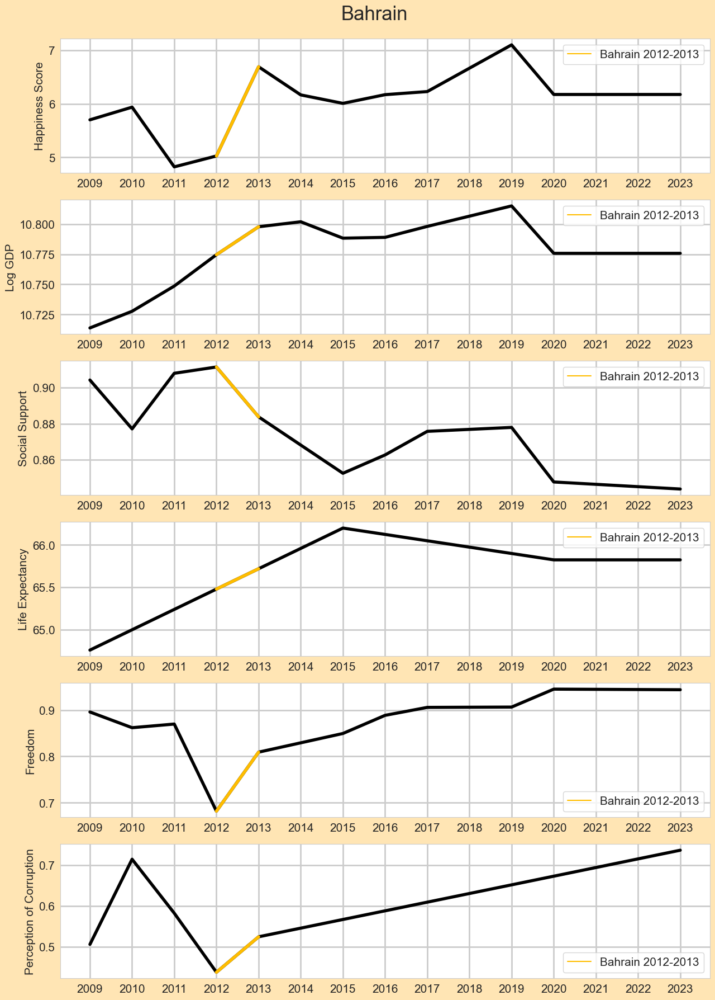

In [128]:
Bahrain_2012_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2012, 2013]) == True)]
Bahrain_2012_2013.loc[Bahrain_2012_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2012-2013'

fig, ax = plt.subplots(6, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )


sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2012_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Perception of Corruption')
ax[5].grid(linewidth=2)
ax[5].legend(title='')


### 1 consecutive year

In [129]:
test_data = data
con_01 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [130]:
# Find the difference between 2 consecutive years by country

con_01['diff']= con_01.groupby(['country_name',con_01['year'].diff().ne(1).cumsum()])['happiness_score'].diff(1)
con_01_all_diff = con_01[con_01['diff'].isna() == False]

print(con_01.shape)
con_01.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,0.678188
2,Afghanistan,2010,4.758381,0.356603
3,Afghanistan,2011,3.831719,-0.926662
4,Afghanistan,2012,3.782938,-0.048782
5,Afghanistan,2013,3.572100,-0.210837
6,Afghanistan,2014,3.130896,-0.441205
7,Afghanistan,2015,3.982855,0.851959
8,Afghanistan,2016,4.220169,0.237314
9,Afghanistan,2017,2.661718,-1.558450


In [131]:
con_01['diff'].describe()

count    1980.000000
mean        0.010683
std         0.378108
min        -1.998616
25%        -0.179920
50%         0.015136
75%         0.208412
max         1.662524
Name: diff, dtype: float64

In [132]:
# Mean and Standard Deviation

con_01_mean = 0.023076
con_01_std = 0.453463

# 2 Standard Deviations

print(con_01_std * 2)

0.906926


In [133]:
# show differences that are unusallly large (2 standard deviations away)

con_01_top = con_01[con_01['diff'] > con_01_mean + (con_01_std * 2)].sort_values('diff', ascending=False)

print(con_01_top.shape)
con_01_top.sort_values('diff', ascending=False)

(25, 4)


,country_name,year,happiness_score,diff
132,Bahrain,2013,6.689711,1.662524
627,El Salvador,2009,6.839087,1.647593
2315,Zambia,2020,4.837992,1.531196
614,Egypt,2014,4.885073,1.326552
246,Botswana,2012,4.835939,1.316018
818,Guinea,2017,4.873723,1.270868
1565,Nigeria,2020,5.502948,1.236464
630,El Salvador,2012,5.934371,1.193077
1895,South Africa,2014,4.828456,1.167729
2301,Yemen,2019,4.196913,1.139399


In [134]:
con_01_top_index = con_01_top.index.tolist()
con_01_top_index.sort()

a = [x-1 for x in con_01_top_index]
b = [x-2 for x in con_01_top_index]

con_01_top_all_index = con_01_top_index + a + b 
con_01_top_all_index = list(set(con_01_top_all_index)) # Removing overlapping Country Year 
con_01_top_all_index.sort()

print(con_01_top_index[:12])
print(con_01_top_all_index[:12])

[132, 200, 246, 297, 614, 627, 630, 639, 766, 772, 818, 829]
[130, 131, 132, 198, 199, 200, 244, 245, 246, 295, 296, 297]


In [135]:
con_01 = data.iloc[con_01_top_all_index]

print(con_01.shape)
con_01.head(20)

(74, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
130,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
198,Benin,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
199,Benin,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235
200,Benin,Africa,2018,5.819827,8.019668,0.503544,55.200001,0.713264,0.002967,0.746511
244,Botswana,Africa,2010,3.553020,9.445679,0.865625,50.599998,0.826219,-0.138166,0.813985
245,Botswana,Africa,2011,3.519921,9.491772,0.860028,51.040001,0.812514,-0.245455,0.816158
246,Botswana,Africa,2012,4.835939,9.470853,0.836743,51.480000,0.799410,-0.194504,0.814423
295,Burkina Faso,Africa,2013,3.325950,7.508565,0.745217,52.520000,0.741257,-0.014703,0.764721


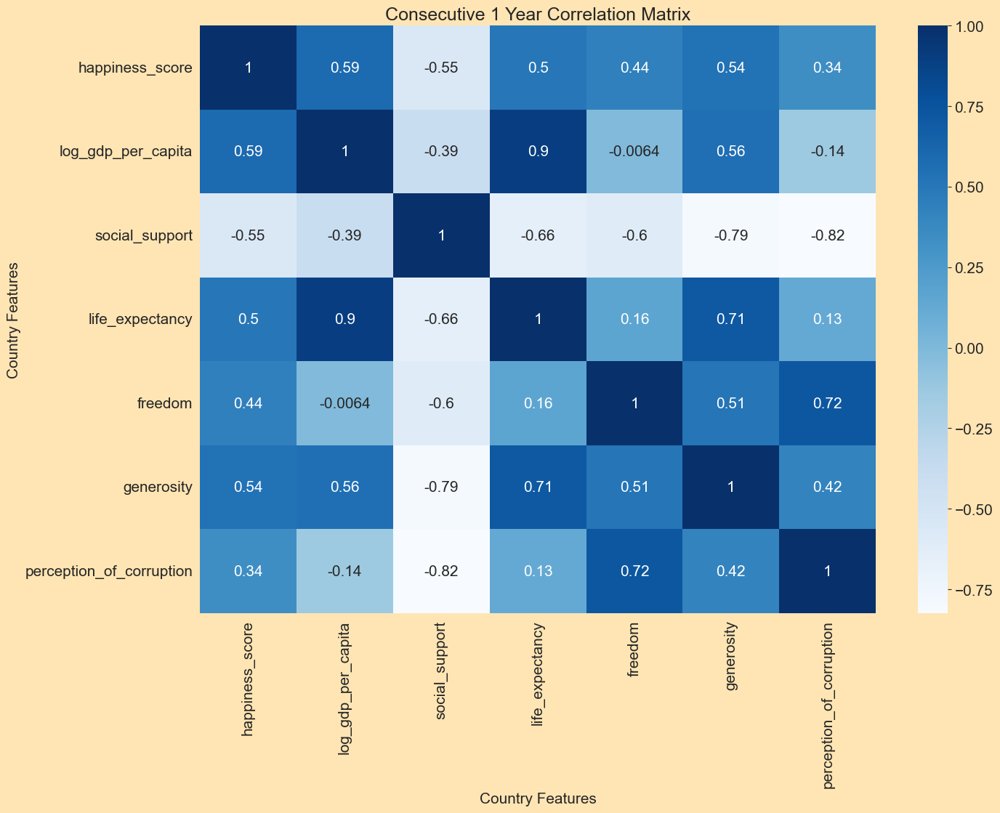

In [136]:
### What country feature correlates with happiness in con_01?

con_01_corr_matrix = con_01.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Consecutive 1 Year Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [137]:
# Show what correlates to happiness in con_01

con_01_happiness_corr = con_01.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_01_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.499848
life_expectancy             0.490155
social_support              0.376016
freedom                     0.196367
generosity                 -0.264642
perception_of_corruption   -0.422044
Name: happiness_score, dtype: float64

In [138]:
# Show all positive correlations in con_01

con_01_corr = con_01.corr(numeric_only = True)
con_01_corr_unstack = con_01_corr.unstack().sort_values()
con_01_high_corr = con_01_corr_unstack.sort_values(ascending=False)
con_01_high_corr = con_01_high_corr[(con_01_high_corr < 1) & (con_01_high_corr > 0.5)].drop_duplicates()
con_01_high_corr

Series([], dtype: float64)

### 2 consecutive years

In [139]:
test_data = data
con_02 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [140]:
# Find the difference between 2 consecutive years by country

con_02['diff']=con_02.groupby(['country_name',con_02['year'].diff().ne(1).cumsum()])['happiness_score'].diff(2)
con_02_all_diff = con_02[con_02['diff'].isna() == False]

print(con_02.shape)
con_02.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,1.034791
3,Afghanistan,2011,3.831719,-0.570059
4,Afghanistan,2012,3.782938,-0.975443
5,Afghanistan,2013,3.572100,-0.259619
6,Afghanistan,2014,3.130896,-0.652042
7,Afghanistan,2015,3.982855,0.410754
8,Afghanistan,2016,4.220169,1.089273
9,Afghanistan,2017,2.661718,-1.321136


In [141]:
con_02['diff'].describe()

count    1762.000000
mean        0.023076
std         0.453463
min        -2.533434
25%        -0.202323
50%         0.024372
75%         0.260243
max         1.865735
Name: diff, dtype: float64

In [142]:
# Mean and Standard Deviation

con_02_mean = 0.023076
con_02_std = 0.453463

# 2 Standard Deviations

print(con_02_std * 2)

0.906926


In [143]:
# show differences that are unusallly large (2 standard deviations away)

con_02_top = con_02[con_02['diff'] > con_02_mean + (con_02_std * 2)].sort_values('diff', ascending=False)

print(con_02_top.shape)
con_02_top.sort_values('diff', ascending=False)

(48, 4)


,country_name,year,happiness_score,diff
132,Bahrain,2013,6.689711,1.865735
200,Benin,2018,5.819827,1.812469
1198,Liberia,2017,4.424491,1.722900
819,Guinea,2018,5.252227,1.649372
631,El Salvador,2013,6.325063,1.583768
628,El Salvador,2010,6.739911,1.548417
627,El Salvador,2009,6.839087,1.543552
2322,Zimbabwe,2010,4.681570,1.507306
772,Ghana,2017,5.481311,1.495395
766,Ghana,2011,5.608200,1.410504


In [144]:
con_02_top_index = con_02_top.index.tolist()
con_02_top_index.sort()

a = [x-1 for x in con_02_top_index]
b = [x-2 for x in con_02_top_index]

con_02_top_all_index = con_02_top_index + a + b 
con_02_top_all_index = list(set(con_02_top_all_index)) # Removing overlapping Country Year 
con_02_top_all_index.sort()

print(con_02_top_index[:12])
print(con_02_top_all_index[:12])

[2, 8, 77, 132, 133, 199, 200, 246, 297, 371, 454, 500]
[0, 1, 2, 6, 7, 8, 75, 76, 77, 130, 131, 132]


In [145]:
con_02 = data.iloc[con_02_top_all_index]

print(con_02.shape)
con_02.head(20)

(136, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
75,Armenia,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683
76,Armenia,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826
77,Armenia,Europe,2019,5.488087,9.569242,0.781604,67.099998,0.844324,-0.179027,0.583473
130,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522


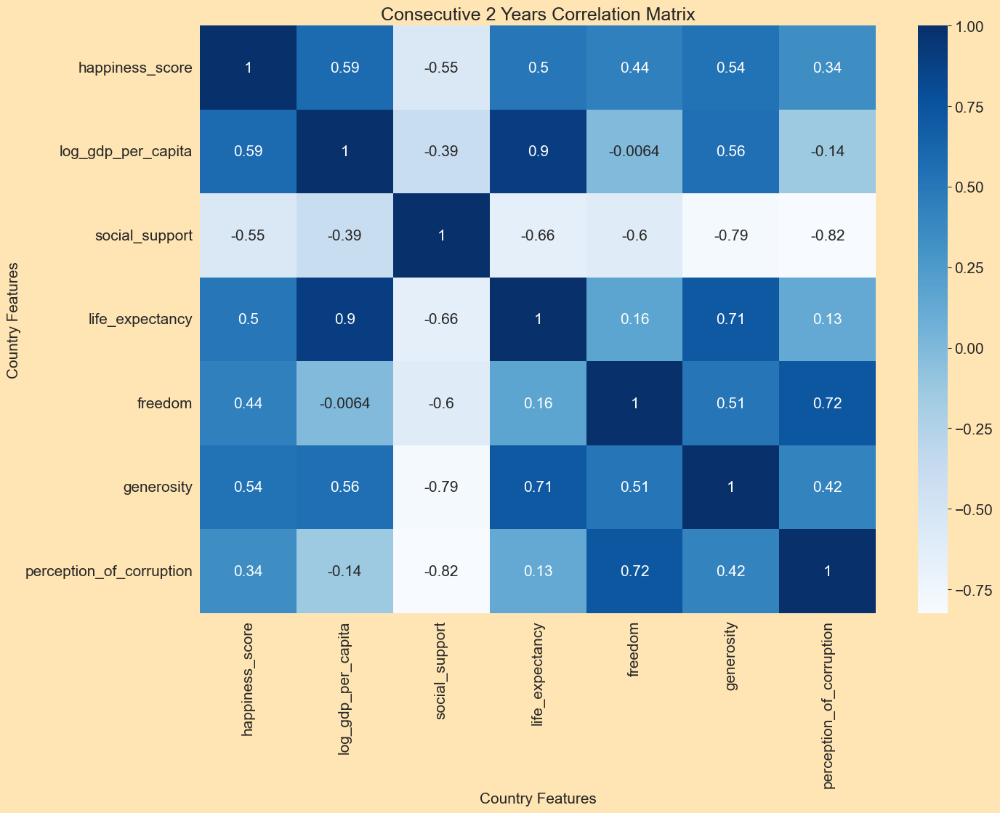

In [146]:
### What country feature correlates with happiness in con_02?

con_02_corr_matrix = con_02.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Consecutive 2 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [147]:
# Show what correlates to happiness in con_02

con_02_happiness_corr = con_02.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_02_happiness_corr

happiness_score             1.000000
life_expectancy             0.640779
log_gdp_per_capita          0.599925
social_support              0.441986
freedom                     0.332106
generosity                  0.102097
perception_of_corruption   -0.146824
Name: happiness_score, dtype: float64

In [148]:
# Show all positive correlations in con_02

con_02_corr = con_02.corr(numeric_only = True)
con_02_corr_unstack = con_02_corr.unstack().sort_values()
con_02_high_corr = con_02_corr_unstack.sort_values(ascending=False)
con_02_high_corr = con_02_high_corr[(con_02_high_corr < 1) & (con_02_high_corr > 0.5)].drop_duplicates()
con_02_high_corr

happiness_score     life_expectancy    0.640779
log_gdp_per_capita  life_expectancy    0.618527
                    happiness_score    0.599925
social_support      life_expectancy    0.505480
dtype: float64

### 3 consecutive years

In [149]:
test_data = data
con_03 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [150]:
# Find the difference between 3 consecutive years by country

con_03['diff']=con_03.groupby(['country_name',con_03['year'].diff().ne(1).cumsum()])['happiness_score'].diff(3)
con_03_all_diff = con_03[con_03['diff'].isna() == False]

print(con_03.shape)
con_03.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,0.108129
4,Afghanistan,2012,3.782938,-0.618841
5,Afghanistan,2013,3.572100,-1.186280
6,Afghanistan,2014,3.130896,-0.700824
7,Afghanistan,2015,3.982855,0.199917
8,Afghanistan,2016,4.220169,0.648068
9,Afghanistan,2017,2.661718,-0.469177


In [151]:
con_03['diff'].describe()

count    1582.000000
mean        0.033344
std         0.501231
min        -2.988377
25%        -0.213992
50%         0.035694
75%         0.314570
max         2.195163
Name: diff, dtype: float64

In [152]:
# Mean and Standard Deviation

con_03_mean = 0.033344
con_03_std = 0.501231

# 2 Standard Deviations

print(con_03_std * 2)

1.002462


In [153]:
# show differences that are unusallly large (2 standard deviations away)

con_03_top = con_03[con_03['diff'] > con_03_mean + (con_03_std * 2)].sort_values('diff', ascending=False)

print(con_03_top.shape)
con_03_top.sort_values('diff', ascending=False)

(31, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.195163
1200,Liberia,2019,5.121461,1.766785
819,Guinea,2018,5.252227,1.747533
2323,Zimbabwe,2011,4.845642,1.671378
772,Ghana,2017,5.481311,1.620960
1909,South Korea,2011,6.946599,1.556974
2079,Togo,2017,4.360805,1.521846
199,Benin,2017,4.853181,1.505762
1549,Niger,2018,5.164007,1.492553
541,Côte D'Ivoire,2017,5.037735,1.467366


In [154]:
con_03_top_index = con_03_top.index.tolist()
con_03_top_index.sort()

a = [x-1 for x in con_03_top_index]
b = [x-2 for x in con_03_top_index]
c = [x-3 for x in con_03_top_index]


con_03_top_all_index = con_03_top_index + a + b + c
con_03_top_all_index = list(set(con_03_top_all_index)) # Removing overlapping Country Year 
con_03_top_all_index.sort()

print(con_03_top_index[:12])
print(con_03_top_all_index[:12])

[77, 121, 133, 199, 200, 299, 380, 455, 500, 541, 627, 628]
[74, 75, 76, 77, 118, 119, 120, 121, 130, 131, 132, 133]


In [155]:
con_03 = data.iloc[con_03_top_all_index]

print(con_03.shape)
con_03.head(10)

(103, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
74,Armenia,Europe,2016,4.325472,9.357068,0.709218,66.275002,0.610987,-0.175243,0.921421
75,Armenia,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683
76,Armenia,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826
77,Armenia,Europe,2019,5.488087,9.569242,0.781604,67.099998,0.844324,-0.179027,0.583473
118,Azerbaijan,Asia & Pacific,2010,4.218611,9.552670,0.687001,61.700001,0.501071,-0.125315,0.858347
119,Azerbaijan,Asia & Pacific,2011,4.680470,9.540639,0.725194,61.980000,0.537484,-0.107818,0.795119
120,Azerbaijan,Asia & Pacific,2012,4.910772,9.548773,0.761873,62.259998,0.598859,-0.143209,0.763155
121,Azerbaijan,Asia & Pacific,2013,5.481178,9.592311,0.769690,62.540001,0.671957,-0.171054,0.698820
130,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915


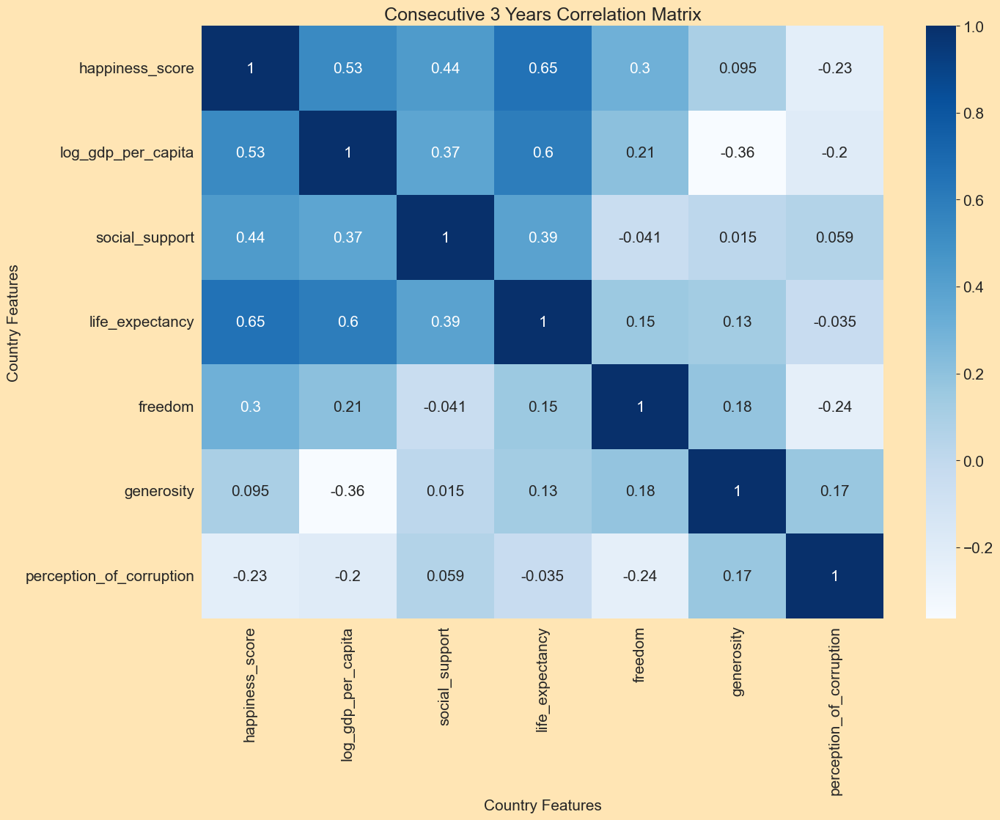

In [156]:
### What country feature correlates with happiness in con_03?

con_03_corr_matrix = con_03.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_03_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 3 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [157]:
# Show what correlates to happiness in con_3

con_03_happiness_corr = con_03.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_03_happiness_corr

happiness_score             1.000000
life_expectancy             0.651544
log_gdp_per_capita          0.529247
social_support              0.435028
freedom                     0.304465
generosity                  0.095338
perception_of_corruption   -0.230081
Name: happiness_score, dtype: float64

In [158]:
# Show all positive correlations in con_3

con_03_corr = con_03.corr(numeric_only = True)
con_03_corr_unstack = con_03_corr.unstack().sort_values()
con_03_high_corr = con_03_corr_unstack.sort_values(ascending=False)
con_03_high_corr = con_03_high_corr[(con_03_high_corr < 1) & (con_03_high_corr > 0.5)].drop_duplicates()
con_03_high_corr

happiness_score     life_expectancy    0.651544
log_gdp_per_capita  life_expectancy    0.597965
                    happiness_score    0.529247
dtype: float64

### 4 consecutive years

In [159]:
test_data = data
con_04 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [160]:
# Find the difference between 2 consecutive years by country

con_04['diff']=con_04.groupby(['country_name',con_04['year'].diff().ne(1).cumsum()])['happiness_score'].diff(4)
con_04_all_diff = con_04[con_04['diff'].isna() == False]

print(con_04.shape)
con_04.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,0.059348
5,Afghanistan,2013,3.572100,-0.829678
6,Afghanistan,2014,3.130896,-1.627485
7,Afghanistan,2015,3.982855,0.151135
8,Afghanistan,2016,4.220169,0.437231
9,Afghanistan,2017,2.661718,-0.910382


In [161]:
con_04['diff'].describe()

count    1422.000000
mean        0.045261
std         0.549342
min        -3.025463
25%        -0.244400
50%         0.046376
75%         0.370815
max         2.472408
Name: diff, dtype: float64

In [162]:
# Mean and Standard Deviation

con_04_mean = 0.045261
con_04_std = 0.549342

# 2 Standard Deviations

print(con_04_std * 2)

1.098684


In [163]:
# show differences that are unusallly large (2 standard deviations away)

con_04_top = con_04[con_04['diff'] > con_04_mean + (con_04_std * 2)].sort_values('diff', ascending=False)

print(con_04_top.shape)
con_04_top.sort_values('diff', ascending=False)

(29, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.472408
1200,Liberia,2019,5.121461,2.419870
819,Guinea,2018,5.252227,1.839744
2324,Zimbabwe,2012,4.955101,1.780837
542,Côte D'Ivoire,2018,5.268375,1.698006
2323,Zimbabwe,2011,4.845642,1.565395
300,Burkina Faso,2018,4.927236,1.445888
454,Congo Brazzaville,2018,5.490214,1.434202
1138,Kyrgyzstan,2020,6.249586,1.393052
1107,Kosovo,2018,6.391826,1.391450


In [164]:
con_04_top_index = con_04_top.index.tolist()
con_04_top_index.sort()

a = [x-1 for x in con_04_top_index]
b = [x-2 for x in con_04_top_index]
c = [x-3 for x in con_04_top_index]
d = [x-4 for x in con_04_top_index]

con_04_top_all_index = con_04_top_index + a + b + c + d
con_04_top_all_index = list(set(con_04_top_all_index)) # Removing overlapping Country Year 
con_04_top_all_index.sort()

print(con_04_top_index[:12])
print(con_04_top_all_index[:12])

[134, 199, 200, 201, 299, 300, 322, 454, 541, 542, 633, 819]
[130, 131, 132, 133, 134, 195, 196, 197, 198, 199, 200, 201]


In [165]:
con_04 = data.iloc[con_04_top_all_index]

print(con_04.shape)
con_04.head(10)

(113, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
130,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
133,Bahrain,Arab States,2014,6.165134,10.801981,NaN,65.959999,NaN,NaN,NaN
134,Bahrain,Arab States,2015,6.007375,10.788364,0.852551,66.199997,0.849521,0.107500,NaN
195,Benin,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827
197,Benin,Africa,2015,3.624664,7.955011,0.434389,54.299999,0.733384,-0.026173,0.850098
198,Benin,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
199,Benin,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235


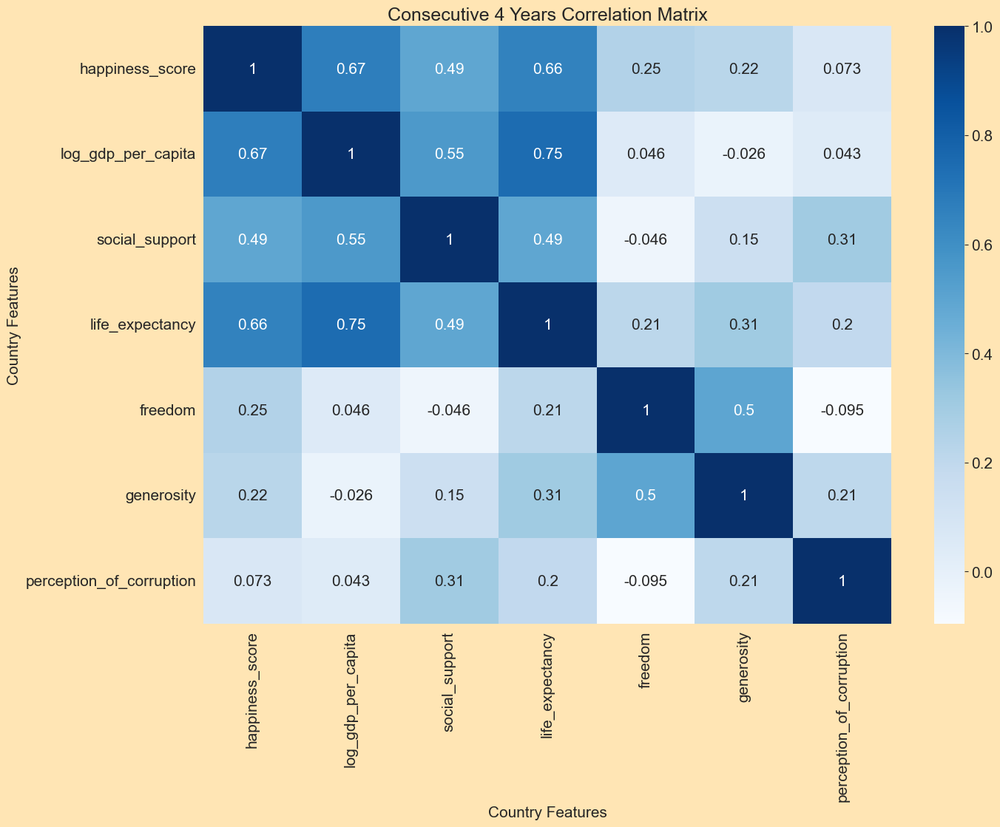

In [166]:
### What country feature correlates with happiness in con_04?

con_04_corr_matrix = con_04.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_04_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 4 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [167]:
# Show what correlates to happiness in con_04

con_04_happiness_corr = con_04.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_04_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.674586
life_expectancy             0.657116
social_support              0.494065
freedom                     0.247808
generosity                  0.224936
perception_of_corruption    0.072863
Name: happiness_score, dtype: float64

In [168]:
# Show all positive correlations in con_04

con_04_corr = con_04.corr(numeric_only = True)
con_04_corr_unstack = con_04_corr.unstack().sort_values()
con_04_high_corr = con_04_corr_unstack.sort_values(ascending=False)
con_04_high_corr = con_04_high_corr[(con_04_high_corr < 1) & (con_04_high_corr > 0.5)].drop_duplicates()
con_04_high_corr

life_expectancy     log_gdp_per_capita    0.747210
happiness_score     log_gdp_per_capita    0.674586
life_expectancy     happiness_score       0.657116
log_gdp_per_capita  social_support        0.553703
dtype: float64

### 5 consecutive years

In [169]:
test_data = data
con_05 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [170]:
con_05['diff']=con_05.groupby(['country_name',con_05['year'].diff().ne(1).cumsum()])['happiness_score'].diff(5)
con_05_all_diff = con_05[con_05['diff'].isna() == False]

print(con_05.shape)
con_05.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,-0.151489
6,Afghanistan,2014,3.130896,-1.270883
7,Afghanistan,2015,3.982855,-0.775526
8,Afghanistan,2016,4.220169,0.388449
9,Afghanistan,2017,2.661718,-1.121219


In [171]:
con_05['diff'].describe()

count    1275.000000
mean        0.065848
std         0.591635
min        -3.091914
25%        -0.265868
50%         0.059663
75%         0.429354
max         2.340414
Name: diff, dtype: float64

In [172]:
# Mean and Standard Deviation

con_05_mean = 0.065848
con_05_std = 0.591635

# 2 Standard Deviations

print(con_05_std * 2)

1.18327


In [173]:
con_05_top = con_05[con_05['diff'] > con_05_mean + (con_05_std * 2)].sort_values('diff', ascending=False)

print(con_05_top.shape)
con_05_top.sort_values('diff', ascending=False)

(31, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.340414
543,Côte D'Ivoire,2019,5.392012,1.821644
2324,Zimbabwe,2012,4.955101,1.674854
199,Benin,2017,4.853181,1.659712
201,Benin,2019,4.976361,1.628942
1909,South Korea,2011,6.946599,1.614421
300,Burkina Faso,2018,4.927236,1.601286
454,Congo Brazzaville,2018,5.490214,1.535264
542,Côte D'Ivoire,2018,5.268375,1.529009
2325,Zimbabwe,2013,4.690188,1.515924


In [174]:
con_05_top_index = con_05_top.index.tolist()
con_05_top_index.sort()

a = [x-1 for x in con_05_top_index]
b = [x-2 for x in con_05_top_index]
c = [x-3 for x in con_05_top_index]
d = [x-4 for x in con_05_top_index]
e = [x-5 for x in con_05_top_index]

con_05_top_all_index = con_05_top_index + a + b + c + d + e
con_05_top_all_index = list(set(con_05_top_all_index)) # Removing overlapping Country Year 
con_05_top_all_index.sort()

print(con_05_top_index[:12])
print(con_05_top_all_index[:12])

[135, 199, 200, 201, 300, 301, 322, 454, 500, 542, 543, 634]
[130, 131, 132, 133, 134, 135, 194, 195, 196, 197, 198, 199]


In [175]:
con_05 = data.iloc[con_05_top_all_index]

print(con_05.shape)
con_05.head(10)

(141, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
130,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
133,Bahrain,Arab States,2014,6.165134,10.801981,NaN,65.959999,NaN,NaN,NaN
134,Bahrain,Arab States,2015,6.007375,10.788364,0.852551,66.199997,0.849521,0.107500,NaN
135,Bahrain,Arab States,2016,6.169673,10.789037,0.862700,66.125000,0.888691,0.083302,NaN
194,Benin,Africa,2012,3.193469,7.894076,0.523027,53.520000,0.768971,-0.111104,0.805978
195,Benin,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827
197,Benin,Africa,2015,3.624664,7.955011,0.434389,54.299999,0.733384,-0.026173,0.850098


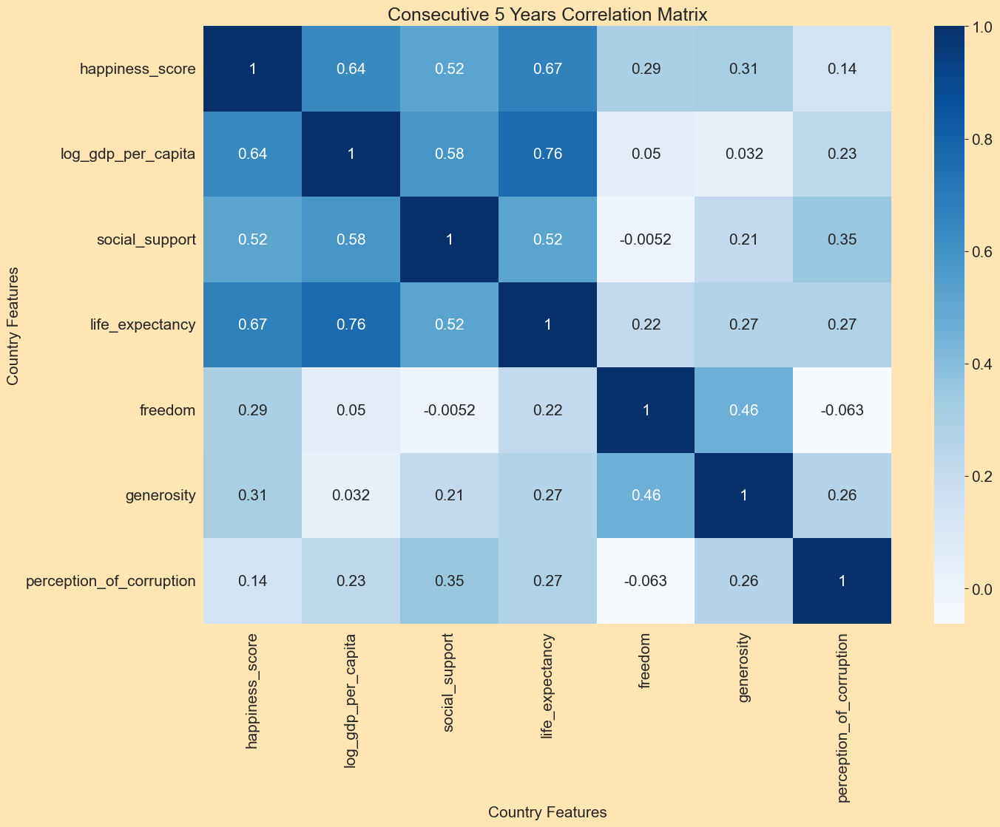

In [176]:
### What country feature correlates with happiness in con_05?

con_05_corr_matrix = con_05.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_05_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 5 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [177]:
# Show what correlates to happiness in con_05

con_05_happiness_corr = con_05.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_05_happiness_corr

happiness_score             1.000000
life_expectancy             0.669275
log_gdp_per_capita          0.638646
social_support              0.515857
generosity                  0.305687
freedom                     0.293084
perception_of_corruption    0.138979
Name: happiness_score, dtype: float64

In [178]:
# Show all positive correlations in con_05

con_05_corr = con_05.corr(numeric_only = True)
con_05_corr_unstack = con_05_corr.unstack().sort_values()
con_05_high_corr = con_05_corr_unstack.sort_values(ascending=False)
con_05_high_corr = con_05_high_corr[(con_05_high_corr < 1) & (con_05_high_corr > 0.5)].drop_duplicates()
con_05_high_corr

life_expectancy     log_gdp_per_capita    0.762204
happiness_score     life_expectancy       0.669275
                    log_gdp_per_capita    0.638646
log_gdp_per_capita  social_support        0.584694
social_support      life_expectancy       0.516787
                    happiness_score       0.515857
dtype: float64

### 6 consecutive years

In [179]:
test_data = data
con_06 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [180]:
con_06['diff']=con_06.groupby(['country_name',con_06['year'].diff().ne(1).cumsum()])['happiness_score'].diff(6)
con_06_all_diff = con_06[con_06['diff'].isna() == False]

print(con_06.shape)
con_06.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,-0.592694
7,Afghanistan,2015,3.982855,-0.418924
8,Afghanistan,2016,4.220169,-0.538212
9,Afghanistan,2017,2.661718,-1.170001


In [181]:
con_06['diff'].describe()

count    1136.000000
mean        0.087080
std         0.627010
min        -3.437340
25%        -0.249512
50%         0.072237
75%         0.468112
max         2.626358
Name: diff, dtype: float64

In [182]:
# Mean and Standard Deviation

con_06_mean = 0.065848
con_06_std = 0.591635

# 2 Standard Deviations

print(con_06_std * 2)

1.18327


In [183]:
con_06_top = con_06[con_06['diff'] > con_06_mean + (con_06_std * 2)].sort_values('diff', ascending=False)

print(con_06_top.shape)
con_06_top.sort_values('diff', ascending=False)

(33, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,2.626358
2270,Venezuela,2022,5.948992,1.907877
1800,Senegal,2019,5.488737,1.841370
823,Guinea,2022,5.317493,1.714638
544,Côte D'Ivoire,2020,5.256504,1.686135
458,Congo Brazzaville,2022,5.804919,1.685425
543,Côte D'Ivoire,2019,5.392012,1.652647
819,Guinea,2018,5.252227,1.600672
635,El Salvador,2017,6.339318,1.598023
1110,Kosovo,2021,6.648499,1.571039


In [184]:
con_06_top_index = con_06_top.index.tolist()
con_06_top_index.sort()

a = [x-1 for x in con_06_top_index]
b = [x-2 for x in con_06_top_index]
c = [x-3 for x in con_06_top_index]
d = [x-4 for x in con_06_top_index]
e = [x-5 for x in con_06_top_index]
f = [x-6 for x in con_06_top_index]

con_06_top_all_index = con_06_top_index + a + b + c + d + e + f
con_06_top_all_index = list(set(con_06_top_all_index)) # Removing overlapping Country Year 
con_06_top_all_index.sort()

print(con_06_top_index[:12])
print(con_06_top_all_index[:12])

[136, 200, 201, 301, 323, 454, 455, 458, 543, 544, 635, 775]
[130, 131, 132, 133, 134, 135, 136, 194, 195, 196, 197, 198]


In [185]:
con_06 = data.iloc[con_06_top_all_index]

print(con_06.shape)
con_06.head(10)

(176, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
130,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522
131,Bahrain,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915
132,Bahrain,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703
133,Bahrain,Arab States,2014,6.165134,10.801981,NaN,65.959999,NaN,NaN,NaN
134,Bahrain,Arab States,2015,6.007375,10.788364,0.852551,66.199997,0.849521,0.107500,NaN
135,Bahrain,Arab States,2016,6.169673,10.789037,0.862700,66.125000,0.888691,0.083302,NaN
136,Bahrain,Arab States,2017,6.227321,10.798135,0.875747,66.050003,0.905859,0.130106,NaN
194,Benin,Africa,2012,3.193469,7.894076,0.523027,53.520000,0.768971,-0.111104,0.805978
195,Benin,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827


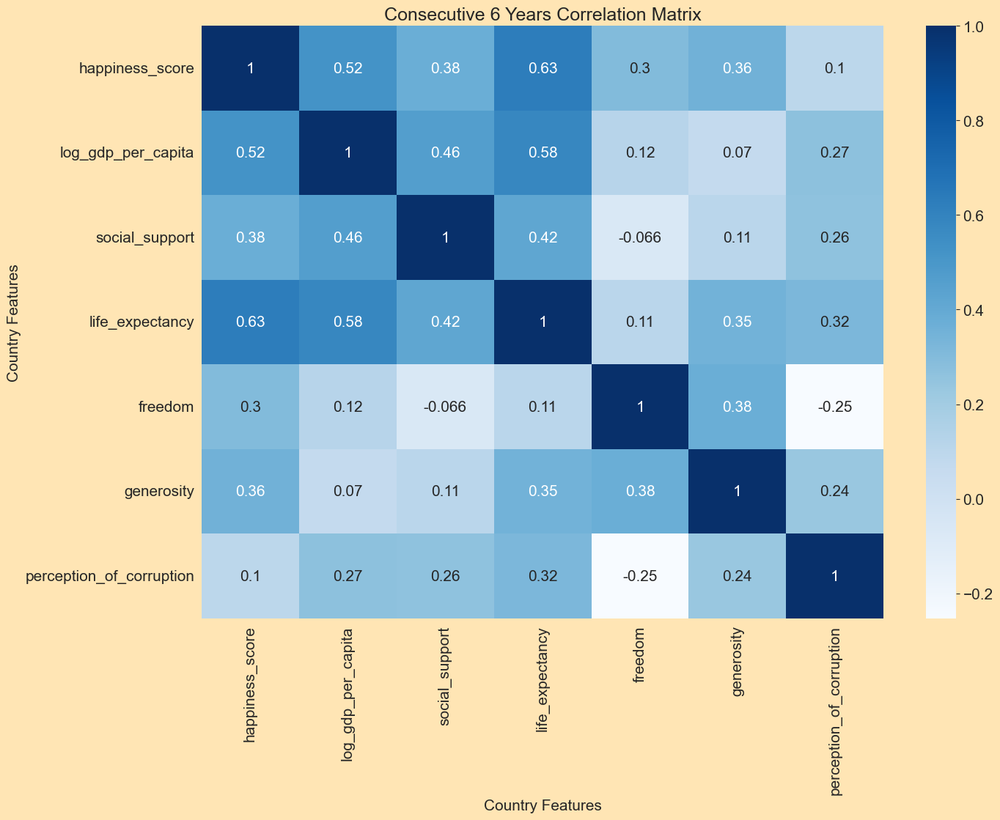

In [186]:
### What country feature correlates with happiness in con_06?

con_06_corr_matrix = con_06.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_06_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 6 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [187]:
# Show what correlates to happiness in con_06

con_06_happiness_corr = con_06.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_06_happiness_corr

happiness_score             1.000000
life_expectancy             0.631561
log_gdp_per_capita          0.524892
social_support              0.375707
generosity                  0.358365
freedom                     0.303516
perception_of_corruption    0.099675
Name: happiness_score, dtype: float64

In [188]:
# Show all positive correlations in con_06

con_06_corr = con_06.corr(numeric_only = True)
con_06_corr_unstack = con_06_corr.unstack().sort_values()
con_06_high_corr = con_06_corr_unstack.sort_values(ascending=False)
con_06_high_corr = con_06_high_corr[(con_06_high_corr < 1) & (con_06_high_corr > 0.5)].drop_duplicates()
con_06_high_corr

happiness_score     life_expectancy       0.631561
log_gdp_per_capita  life_expectancy       0.580647
happiness_score     log_gdp_per_capita    0.524892
dtype: float64

### 7 consecutive years

In [189]:
test_data = data
con_07 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [190]:
con_07['diff']=con_07.groupby(['country_name',con_07['year'].diff().ne(1).cumsum()])['happiness_score'].diff(7)
con_07_all_diff = con_07[con_07['diff'].isna() == False]

print(con_07.shape)
con_07.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,0.259265
8,Afghanistan,2016,4.220169,-0.181610
9,Afghanistan,2017,2.661718,-2.096663


In [191]:
con_07['diff'].describe()

count    1002.000000
mean        0.107698
std         0.648259
min        -3.147688
25%        -0.250718
50%         0.106192
75%         0.519246
max         1.949548
Name: diff, dtype: float64

In [192]:
# Mean and Standard Deviation

con_07_mean = 0.107698
con_07_std = 0.648259

# 2 Standard Deviations

print(con_07_std * 2)

1.296518


In [193]:
con_07_top = con_07[con_07['diff'] > con_07_mean + (con_07_std * 2)].sort_values('diff', ascending=False)

print(con_07_top.shape)
con_07_top.sort_values('diff', ascending=False)

(14, 4)


,country_name,year,happiness_score,diff
200,Benin,2018,5.819827,1.949548
1800,Senegal,2019,5.488737,1.820000
823,Guinea,2022,5.317493,1.812799
201,Benin,2019,4.976361,1.782892
1735,Romania,2020,6.785142,1.703558
1110,Kosovo,2021,6.648499,1.648124
285,Bulgaria,2020,5.597723,1.604702
1107,Kosovo,2018,6.391826,1.532324
822,Guinea,2021,4.944540,1.532057
544,Côte D'Ivoire,2020,5.256504,1.517138


In [194]:
con_07_top_index = con_07_top.index.tolist()
con_07_top_index.sort()

a = [x-1 for x in con_07_top_index]
b = [x-2 for x in con_07_top_index]
c = [x-3 for x in con_07_top_index]
d = [x-4 for x in con_07_top_index]
e = [x-5 for x in con_07_top_index]
f = [x-6 for x in con_07_top_index]
g = [x-7 for x in con_07_top_index]

con_07_top_all_index = con_07_top_index + a + b + c + d + e + f + g
con_07_top_all_index = list(set(con_07_top_all_index)) # Removing overlapping Country Year 
con_07_top_all_index.sort()

print(con_07_top_index[:12])
print(con_07_top_all_index[:12])

[200, 201, 285, 544, 545, 636, 822, 823, 824, 1107, 1110, 1735]
[193, 194, 195, 196, 197, 198, 199, 200, 201, 278, 279, 280]


In [195]:
con_07 = data.iloc[con_07_top_all_index]

print(con_07.shape)
con_07.head(10)

(79, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
193,Benin,Africa,2011,3.870280,7.876235,0.477494,53.259998,0.772919,-0.142097,0.849472
194,Benin,Africa,2012,3.193469,7.894076,0.523027,53.520000,0.768971,-0.111104,0.805978
195,Benin,Africa,2013,3.479413,7.934523,0.576823,53.779999,0.783240,-0.084524,0.855956
196,Benin,Africa,2014,3.347419,7.966898,0.506091,54.040001,0.775546,-0.095376,0.854827
197,Benin,Africa,2015,3.624664,7.955011,0.434389,54.299999,0.733384,-0.026173,0.850098
198,Benin,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
199,Benin,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235
200,Benin,Africa,2018,5.819827,8.019668,0.503544,55.200001,0.713264,0.002967,0.746511
201,Benin,Africa,2019,4.976361,8.057199,0.442154,55.500000,0.770360,-0.015219,0.698347
278,Bulgaria,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047


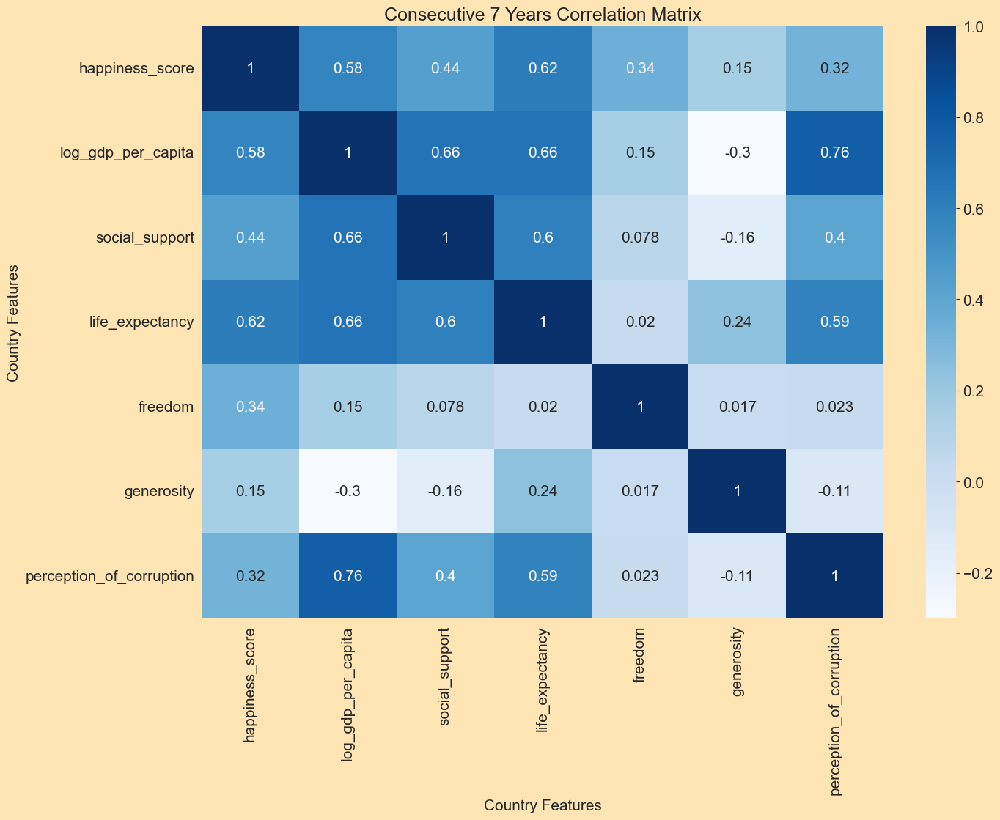

In [196]:
### What country feature correlates with happiness in con_07?

con_07_corr_matrix = con_07.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_07_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 7 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [197]:
# Show what correlates to happiness in con_07

con_07_happiness_corr = con_07.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_07_happiness_corr

happiness_score             1.000000
life_expectancy             0.616786
log_gdp_per_capita          0.579583
social_support              0.441358
freedom                     0.341853
perception_of_corruption    0.321987
generosity                  0.152653
Name: happiness_score, dtype: float64

In [198]:
# Show all positive correlations in con_07

con_07_corr = con_07.corr(numeric_only = True)
con_07_corr_unstack = con_07_corr.unstack().sort_values()
con_07_high_corr = con_07_corr_unstack.sort_values(ascending=False)
con_07_high_corr = con_07_high_corr[(con_07_high_corr < 1) & (con_07_high_corr > 0.5)].drop_duplicates()
con_07_high_corr

perception_of_corruption  log_gdp_per_capita    0.763797
life_expectancy           log_gdp_per_capita    0.664332
social_support            log_gdp_per_capita    0.660466
happiness_score           life_expectancy       0.616786
life_expectancy           social_support        0.600690
perception_of_corruption  life_expectancy       0.591794
happiness_score           log_gdp_per_capita    0.579583
dtype: float64

### 8 consecutive years

In [199]:
test_data = data
con_08 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [200]:
con_08['diff']=con_08.groupby(['country_name',con_08['year'].diff().ne(1).cumsum()])['happiness_score'].diff(8)
con_08_all_diff = con_08[con_08['diff'].isna() == False]

print(con_08.shape)
con_08.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,0.496579
9,Afghanistan,2017,2.661718,-1.740060


In [201]:
con_08['diff'].describe()

count    873.000000
mean       0.117230
std        0.673061
min       -2.880598
25%       -0.253854
50%        0.128982
75%        0.531732
max        1.937927
Name: diff, dtype: float64

In [202]:
# Mean and Standard Deviation

con_08_mean = 0.117230
con_08_std = 0.673061

# 2 Standard Deviations

print(con_08_std * 2)

1.346122


In [203]:
con_08_top = con_08[con_08['diff'] > con_08_mean + (con_08_std * 2)].sort_values('diff', ascending=False)

print(con_08_top.shape)
con_08_top.sort_values('diff', ascending=False)

(13, 4)


,country_name,year,happiness_score,diff
1902,South Africa,2021,5.598654,1.937927
823,Guinea,2022,5.317493,1.905010
1527,Nicaragua,2014,6.275267,1.815108
1481,Nepal,2020,5.982410,1.749166
458,Congo Brazzaville,2022,5.804919,1.748906
637,El Salvador,2019,6.454821,1.713526
1800,Senegal,2019,5.488737,1.654535
1480,Nepal,2019,5.448725,1.639280
1735,Romania,2020,6.785142,1.618268
824,Guinea,2023,5.071700,1.567007


In [204]:
con_08_top_index = con_08_top.index.tolist()
con_08_top_index.sort()

a = [x-1 for x in con_08_top_index]
b = [x-2 for x in con_08_top_index]
c = [x-3 for x in con_08_top_index]
d = [x-4 for x in con_08_top_index]
e = [x-5 for x in con_08_top_index]
f = [x-6 for x in con_08_top_index]
g = [x-7 for x in con_08_top_index]
h = [x-8 for x in con_08_top_index]

con_08_top_all_index = con_08_top_index + a + b + c + d + e + f + g + h
con_08_top_all_index = list(set(con_08_top_all_index)) # Removing overlapping Country Year 
con_08_top_all_index.sort()

print(con_08_top_index[:12])
print(con_08_top_all_index[:12])

[458, 637, 823, 824, 1108, 1480, 1481, 1527, 1735, 1736, 1800, 1815]
[450, 451, 452, 453, 454, 455, 456, 457, 458, 629, 630, 631]


In [205]:
con_08 = data.iloc[con_08_top_all_index]

print(con_08.shape)
con_08.head(10)

(93, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
450,Congo Brazzaville,Africa,2014,4.056013,8.579113,0.685935,54.520000,0.661638,-0.136911,0.808413
451,Congo Brazzaville,Africa,2015,4.690830,8.519078,0.642136,54.900002,0.850172,-0.125980,0.841359
452,Congo Brazzaville,Africa,2016,4.119493,8.381088,0.615449,55.224998,0.785907,-0.087659,0.790386
453,Congo Brazzaville,Africa,2017,4.883991,8.312363,0.655441,55.549999,0.777783,-0.144619,0.762783
454,Congo Brazzaville,Africa,2018,5.490214,8.239174,0.620623,55.875000,0.698700,-0.101779,0.738020
455,Congo Brazzaville,Africa,2019,5.212623,8.214752,0.624768,56.200001,0.686452,-0.056287,0.740589
456,Congo Brazzaville,Africa,2020,5.079139,8.127007,0.596515,56.525002,0.760728,-0.021083,0.727796
457,Congo Brazzaville,Africa,2021,4.920531,8.081596,0.567651,56.849998,0.737661,-0.019420,0.732730
458,Congo Brazzaville,Africa,2022,5.804919,8.077151,0.646345,57.174999,0.697694,0.027624,0.759754
629,El Salvador,South/Latin America,2011,4.741295,8.944544,0.731278,64.220001,0.747246,-0.129944,0.706553


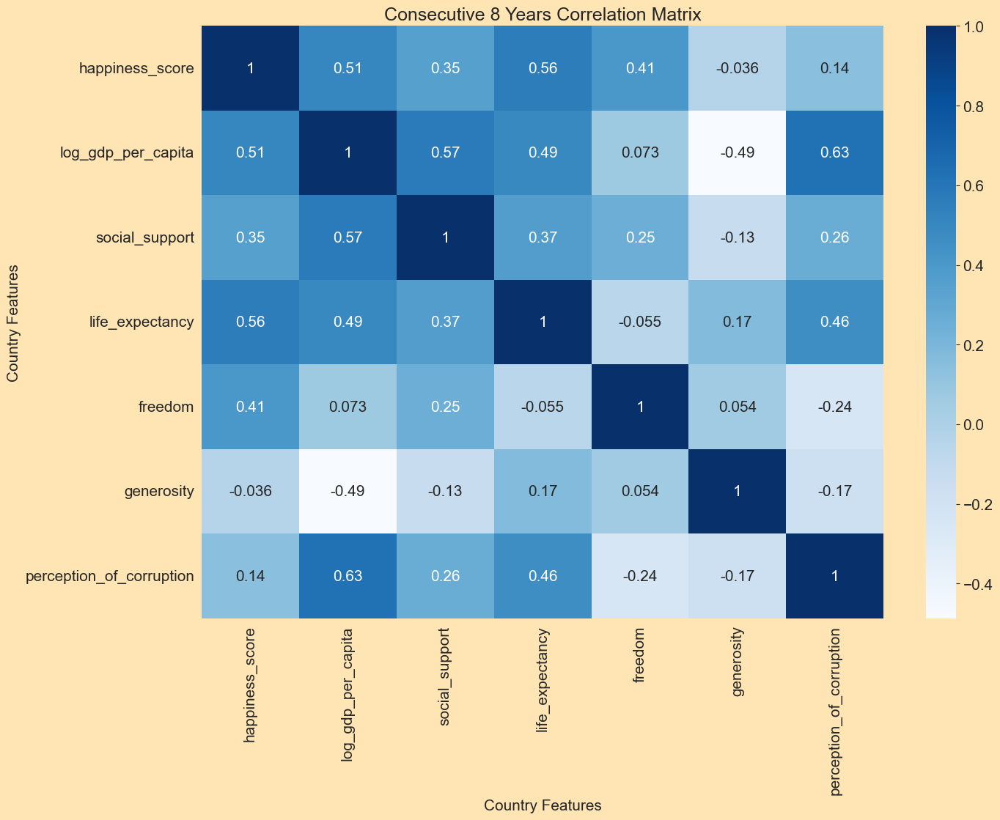

In [206]:
### What country feature correlates with happiness in con_08?

con_08_corr_matrix = con_08.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_08_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 8 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [207]:
# Show what correlates to happiness in con_08

con_08_happiness_corr = con_08.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_08_happiness_corr

happiness_score             1.000000
life_expectancy             0.563788
log_gdp_per_capita          0.508142
freedom                     0.405733
social_support              0.354644
perception_of_corruption    0.141865
generosity                 -0.036006
Name: happiness_score, dtype: float64

In [208]:
# Show all positive correlations in con_08

con_08_corr = con_08.corr(numeric_only = True)
con_08_corr_unstack = con_08_corr.unstack().sort_values()
con_08_high_corr = con_08_corr_unstack.sort_values(ascending=False)
con_08_high_corr = con_08_high_corr[(con_08_high_corr < 1) & (con_08_high_corr > 0.5)].drop_duplicates()
con_08_high_corr

perception_of_corruption  log_gdp_per_capita    0.625659
social_support            log_gdp_per_capita    0.570496
life_expectancy           happiness_score       0.563788
log_gdp_per_capita        happiness_score       0.508142
dtype: float64

### 9 consecutive years

In [209]:
test_data = data
con_09 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [210]:
con_09['diff']= con_09.groupby(['country_name',con_09['year'].diff().ne(1).cumsum()])['happiness_score'].diff(9)
con_09_all_diff = con_09[con_09['diff'].isna() == False]

print(con_09.shape)
con_09.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,-1.061872


In [211]:
con_09['diff'].describe()

count    745.000000
mean       0.124556
std        0.697727
min       -2.840826
25%       -0.261887
50%        0.111084
75%        0.559139
max        2.172966
Name: diff, dtype: float64

In [212]:
# Mean and Standard Deviation

con_09_mean = 0.124556
con_09_std = 0.697727

# 2 Standard Deviations

print(con_09_std * 2)

1.395454


In [213]:
con_09_top = con_09[con_09['diff'] > con_09_mean + (con_09_std * 2)].sort_values('diff', ascending=False)

print(con_09_top.shape)
con_09_top.sort_values('diff', ascending=False)

(8, 4)


,country_name,year,happiness_score,diff
1481,Nepal,2020,5.982410,2.172966
458,Congo Brazzaville,2022,5.804919,1.849968
1816,Serbia,2019,6.241407,1.780103
1735,Romania,2020,6.785142,1.762385
285,Bulgaria,2020,5.597723,1.722341
824,Guinea,2023,5.071700,1.659218
1815,Serbia,2018,5.936493,1.556181
881,Hungary,2021,6.226648,1.543290


In [214]:
con_09_top_index = con_09_top.index.tolist()
con_09_top_index.sort()

a = [x-1 for x in con_09_top_index]
b = [x-2 for x in con_09_top_index]
c = [x-3 for x in con_09_top_index]
d = [x-4 for x in con_09_top_index]
e = [x-5 for x in con_09_top_index]
f = [x-6 for x in con_09_top_index]
g = [x-7 for x in con_09_top_index]
h = [x-8 for x in con_09_top_index]
i = [x-9 for x in con_09_top_index]

con_09_top_all_index = con_09_top_index + a + b + c + d + e + f + g + h + i
con_09_top_all_index = list(set(con_09_top_all_index)) # Removing overlapping Country Year 
con_09_top_all_index.sort()

print(con_09_top_index[:12])
print(con_09_top_all_index[:12])

[285, 458, 824, 881, 1481, 1735, 1815, 1816]
[276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 449, 450]


In [215]:
con_09 = data.iloc[con_09_top_all_index]

print(con_09.shape)
con_09.head(10)

(71, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
276,Bulgaria,Europe,2011,3.875382,9.834396,0.860272,65.339996,0.663528,-0.234129,0.947979
277,Bulgaria,Europe,2012,4.222297,9.847710,0.837967,65.480003,0.641256,-0.178530,0.938209
278,Bulgaria,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047
279,Bulgaria,Europe,2014,4.438440,9.862991,0.885949,65.760002,0.575596,-0.060133,0.954637
280,Bulgaria,Europe,2015,4.865401,9.903078,0.907517,65.900002,0.636818,-0.204797,0.941280
281,Bulgaria,Europe,2016,4.837561,9.940038,0.926036,66.000000,0.700266,-0.174661,0.935988
282,Bulgaria,Europe,2017,5.096902,9.974589,0.941755,66.099998,0.689047,-0.158122,0.910800
283,Bulgaria,Europe,2018,5.098814,10.008304,0.923853,66.199997,0.724336,-0.179910,0.952014
284,Bulgaria,Europe,2019,5.108438,10.054930,0.948204,66.300003,0.821930,-0.112819,0.942806
285,Bulgaria,Europe,2020,5.597723,10.020541,0.916242,66.400002,0.818225,-0.010107,0.900633


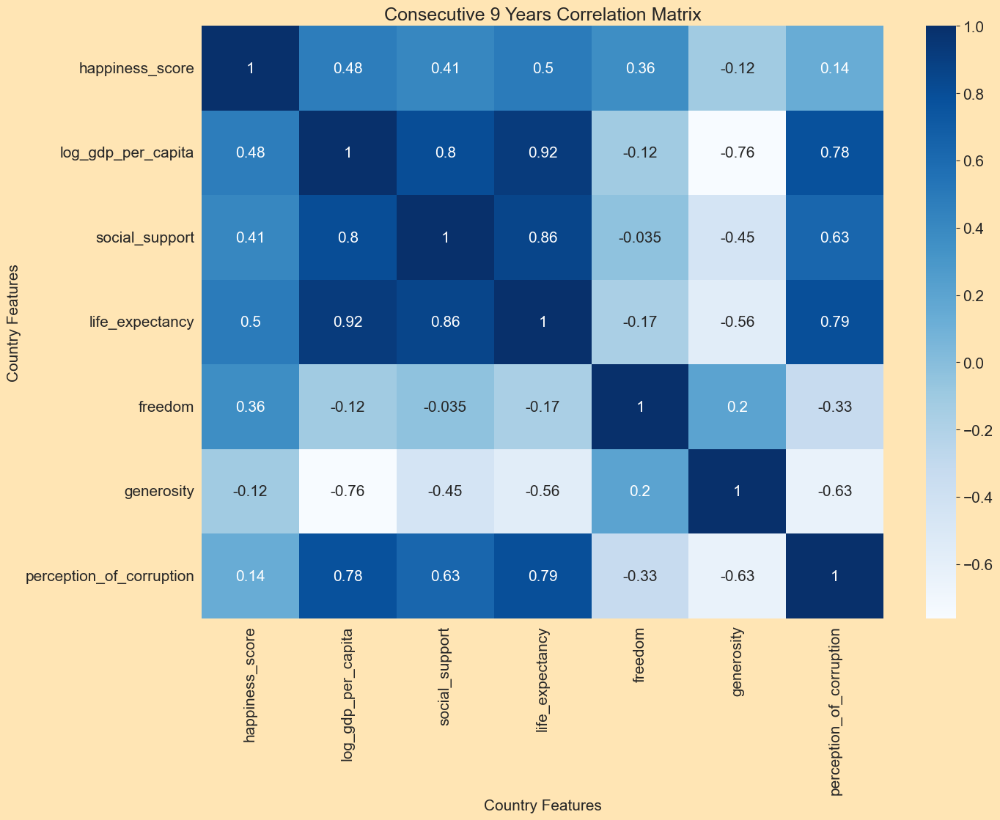

In [216]:
### What country feature correlates with happiness in con_09?

con_09_corr_matrix = con_09.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_09_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 9 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [217]:
# Show what correlates to happiness in con_09

con_09_happiness_corr = con_09.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_09_happiness_corr

happiness_score             1.000000
life_expectancy             0.496474
log_gdp_per_capita          0.482268
social_support              0.409962
freedom                     0.362443
perception_of_corruption    0.137365
generosity                 -0.118308
Name: happiness_score, dtype: float64

In [218]:
# Show all positive correlations in con_09

con_09_corr = con_09.corr(numeric_only = True)
con_09_corr_unstack = con_09_corr.unstack().sort_values()
con_09_high_corr = con_09_corr_unstack.sort_values(ascending=False)
con_09_high_corr = con_09_high_corr[(con_09_high_corr < 1) & (con_09_high_corr > 0.5)].drop_duplicates()
con_09_high_corr

log_gdp_per_capita        life_expectancy             0.918635
social_support            life_expectancy             0.862368
                          log_gdp_per_capita          0.804543
life_expectancy           perception_of_corruption    0.791614
perception_of_corruption  log_gdp_per_capita          0.778007
                          social_support              0.629482
dtype: float64

### 10 consecutive years

In [219]:
test_data = data
con_10 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [220]:
con_10['diff']= con_10.groupby(['country_name',con_10['year'].diff().ne(1).cumsum()])['happiness_score'].diff(10)
con_10_all_diff = con_10[con_10['diff'].isna() == False]

print(con_10.shape)
con_10.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [221]:
con_10['diff'].describe()

count    627.000000
mean       0.130076
std        0.718312
min       -3.008762
25%       -0.277050
50%        0.163187
75%        0.596876
max        1.885577
Name: diff, dtype: float64

In [222]:
# Mean and Standard Deviation

con_10_mean = 0.130076
con_10_std = 0.718312

# 2 Standard Deviations

print(con_10_std * 2)

1.436624


In [223]:
con_10_top = con_10[con_10['diff'] > con_10_mean + (con_10_std * 2)].sort_values('diff', ascending=False)

print(con_10_top.shape)
con_10_top.sort_values('diff', ascending=False)

(9, 4)


,country_name,year,happiness_score,diff
458,Congo Brazzaville,2022,5.804919,1.885577
1735,Romania,2020,6.785142,1.875977
1816,Serbia,2019,6.241407,1.861095
1110,Kosovo,2021,6.648499,1.788998
639,El Salvador,2021,6.431447,1.690152
285,Bulgaria,2020,5.597723,1.685447
823,Guinea,2022,5.317493,1.665938
1481,Nepal,2020,5.982410,1.632735
1817,Serbia,2020,6.041546,1.580242


In [224]:
con_10_top_index = con_10_top.index.tolist()
con_10_top_index.sort()

a = [x-1 for x in con_10_top_index]
b = [x-2 for x in con_10_top_index]
c = [x-3 for x in con_10_top_index]
d = [x-4 for x in con_10_top_index]
e = [x-5 for x in con_10_top_index]
f = [x-6 for x in con_10_top_index]
g = [x-7 for x in con_10_top_index]
h = [x-8 for x in con_10_top_index]
i = [x-9 for x in con_10_top_index]
j = [x-10 for x in con_10_top_index]


con_10_top_all_index = con_10_top_index + a + b + c + d + e + f + g + h + i + j
con_10_top_all_index = list(set(con_10_top_all_index)) # Removing overlapping Country Year 
con_10_top_all_index.sort()

print(con_10_top_index[:12])
print(con_10_top_all_index[:12])

[285, 458, 639, 823, 1110, 1481, 1735, 1816, 1817]
[275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 448]


In [225]:
con_10 = data.iloc[con_10_top_all_index]

print(con_10.shape)
con_10.head(10)

(89, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
275,Bulgaria,Europe,2010,3.912276,9.807190,0.843272,65.199997,0.544536,-0.150703,0.940970
276,Bulgaria,Europe,2011,3.875382,9.834396,0.860272,65.339996,0.663528,-0.234129,0.947979
277,Bulgaria,Europe,2012,4.222297,9.847710,0.837967,65.480003,0.641256,-0.178530,0.938209
278,Bulgaria,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047
279,Bulgaria,Europe,2014,4.438440,9.862991,0.885949,65.760002,0.575596,-0.060133,0.954637
280,Bulgaria,Europe,2015,4.865401,9.903078,0.907517,65.900002,0.636818,-0.204797,0.941280
281,Bulgaria,Europe,2016,4.837561,9.940038,0.926036,66.000000,0.700266,-0.174661,0.935988
282,Bulgaria,Europe,2017,5.096902,9.974589,0.941755,66.099998,0.689047,-0.158122,0.910800
283,Bulgaria,Europe,2018,5.098814,10.008304,0.923853,66.199997,0.724336,-0.179910,0.952014
284,Bulgaria,Europe,2019,5.108438,10.054930,0.948204,66.300003,0.821930,-0.112819,0.942806


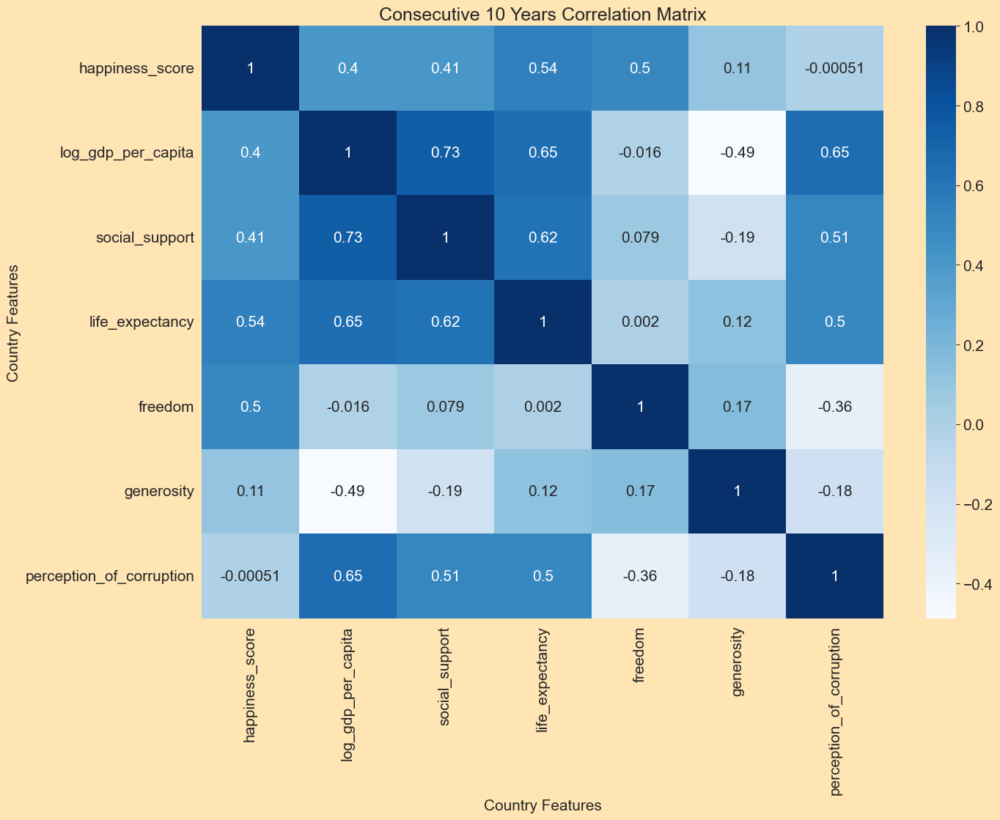

In [226]:
### What country feature correlates with happiness in con_10?

con_10_corr_matrix = con_10.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_10_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 10 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [227]:
# Show what correlates to happiness in con_10

con_10_happiness_corr = con_10.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_10_happiness_corr

happiness_score             1.000000
life_expectancy             0.544906
freedom                     0.501153
social_support              0.412884
log_gdp_per_capita          0.401828
generosity                  0.105646
perception_of_corruption   -0.000509
Name: happiness_score, dtype: float64

In [228]:
# Show all positive correlations in con_10

con_10_corr = con_10.corr(numeric_only = True)
con_10_corr_unstack = con_10_corr.unstack().sort_values()
con_10_high_corr = con_10_corr_unstack.sort_values(ascending=False)
con_10_high_corr = con_10_high_corr[(con_10_high_corr < 1) & (con_10_high_corr > 0.5)].drop_duplicates()
con_10_high_corr

log_gdp_per_capita        social_support              0.734404
perception_of_corruption  log_gdp_per_capita          0.648746
life_expectancy           log_gdp_per_capita          0.645279
                          social_support              0.617645
happiness_score           life_expectancy             0.544906
perception_of_corruption  social_support              0.507651
life_expectancy           perception_of_corruption    0.504049
happiness_score           freedom                     0.501153
dtype: float64

### 11 consecutive years

In [229]:
test_data = data
con_11 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [230]:
con_11['diff']=con_11.groupby(['country_name',con_11['year'].diff().ne(1).cumsum()])['happiness_score'].diff(11)
con_11_all_diff = con_11[con_11['diff'].isna() == False]

print(con_11.shape)
con_11.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [231]:
con_11['diff'].describe()

count    515.000000
mean       0.131745
std        0.736659
min       -2.853090
25%       -0.279125
50%        0.144520
75%        0.601762
max        2.016198
Name: diff, dtype: float64

In [232]:
# Mean and Standard Deviation

con_11_mean = 0.131745
con_11_std = 0.736659

# 2 Standard Deviations

print(con_11_std * 2)

1.473318


In [233]:
con_11_top = con_11[con_11['diff'] > con_11_mean + (con_11_std * 2)].sort_values('diff', ascending=False)

print(con_11_top.shape)
con_11_top.sort_values('diff', ascending=False)

(9, 4)


,country_name,year,happiness_score,diff
1530,Nicaragua,2017,6.476357,2.016198
1224,Lithuania,2021,6.864573,1.798748
1818,Serbia,2021,6.245267,1.783963
640,El Salvador,2022,6.492156,1.750861
1680,Philippines,2019,6.267745,1.678680
1483,Nepal,2022,5.474176,1.664731
1817,Serbia,2020,6.041546,1.661234
1736,Romania,2021,6.548726,1.639560
1225,Lithuania,2022,7.037577,1.605140


In [234]:
con_11_top_index = con_11_top.index.tolist()
con_11_top_index.sort()

a = [x-1 for x in con_11_top_index]
b = [x-2 for x in con_11_top_index]
c = [x-3 for x in con_11_top_index]
d = [x-4 for x in con_11_top_index]
e = [x-5 for x in con_11_top_index]
f = [x-6 for x in con_11_top_index]
g = [x-7 for x in con_11_top_index]
h = [x-8 for x in con_11_top_index]
i = [x-9 for x in con_11_top_index]
j = [x-10 for x in con_11_top_index]
k = [x-11 for x in con_11_top_index]

con_11_top_all_index = con_11_top_index + a + b + c + d + e + f + g + h + i + j + k
con_11_top_all_index = list(set(con_11_top_all_index)) # Removing overlapping Country Year 
con_11_top_all_index.sort()

print(con_11_top_index[:12])
print(con_11_top_all_index[:12])

[640, 1224, 1225, 1483, 1530, 1680, 1736, 1817, 1818]
[629, 630, 631, 632, 633, 634, 635, 636, 637, 638, 639, 640]


In [235]:
con_11 = data.iloc[con_11_top_all_index]

print(con_11.shape)
con_11.head(10)

(86, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
629,El Salvador,South/Latin America,2011,4.741295,8.944544,0.731278,64.220001,0.747246,-0.129944,0.706553
630,El Salvador,South/Latin America,2012,5.934371,8.968486,0.806015,64.040001,0.682745,-0.158484,0.786295
631,El Salvador,South/Latin America,2013,6.325063,8.986650,0.826859,63.860001,0.715570,-0.153323,0.771751
632,El Salvador,South/Latin America,2014,5.856524,8.999740,0.797612,63.680000,0.778015,-0.197871,0.781460
633,El Salvador,South/Latin America,2015,6.018496,9.019994,0.790755,63.500000,0.733356,-0.160052,0.804544
634,El Salvador,South/Latin America,2016,6.139825,9.041951,0.793660,63.849998,0.799847,-0.188904,0.797312
635,El Salvador,South/Latin America,2017,6.339318,9.061599,0.828953,64.199997,0.757827,-0.176094,0.777749
636,El Salvador,South/Latin America,2018,6.241199,9.083893,0.820300,64.550003,0.863335,-0.099741,0.800700
637,El Salvador,South/Latin America,2019,6.454821,9.107358,0.764391,64.900002,0.877391,-0.113695,0.681576
638,El Salvador,South/Latin America,2020,5.461927,9.020058,0.695624,65.250000,0.923945,-0.129366,0.583036


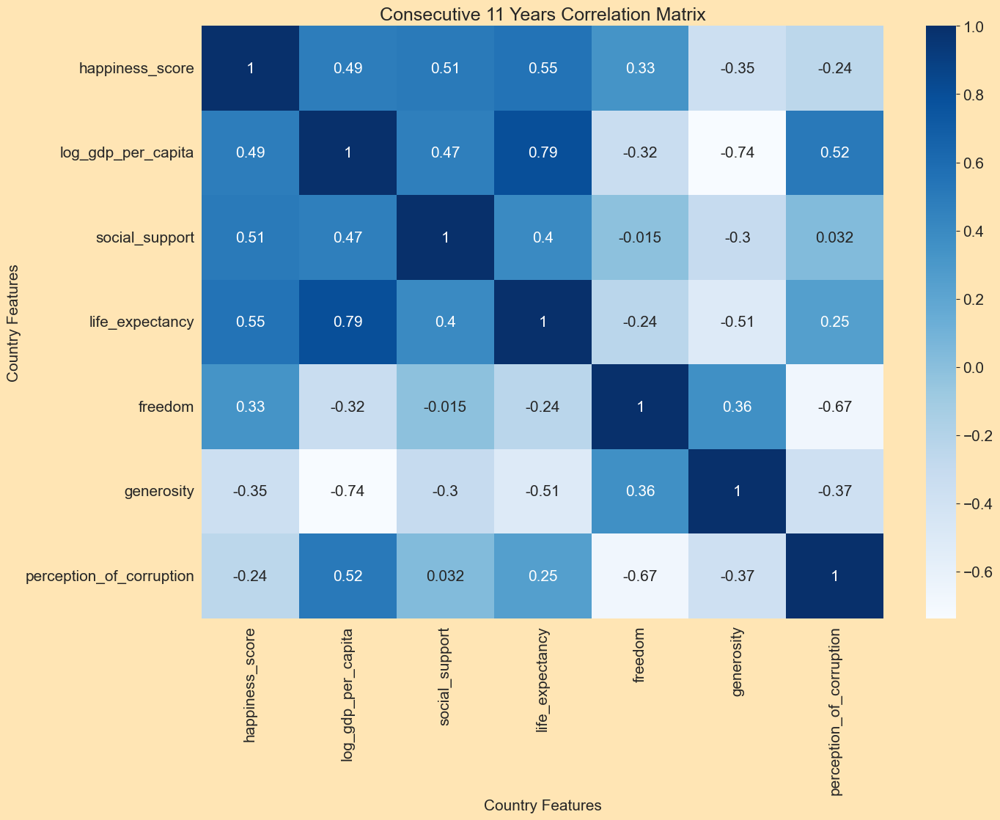

In [236]:
### What country feature correlates with happiness in con_11?

con_11_corr_matrix = con_11.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_11_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 11 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [237]:
# Show what correlates to happiness in con_11

con_11_happiness_corr = con_11.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_11_happiness_corr

happiness_score             1.000000
life_expectancy             0.551412
social_support              0.509441
log_gdp_per_capita          0.486428
freedom                     0.330826
perception_of_corruption   -0.244832
generosity                 -0.352265
Name: happiness_score, dtype: float64

In [238]:
# Show all positive correlations in con_11

con_11_corr = con_11.corr(numeric_only = True)
con_11_corr_unstack = con_11_corr.unstack().sort_values()
con_11_high_corr = con_11_corr_unstack.sort_values(ascending=False)
con_11_high_corr = con_11_high_corr[(con_11_high_corr < 1) & (con_11_high_corr > 0.5)].drop_duplicates()
con_11_high_corr

life_expectancy           log_gdp_per_capita    0.790502
happiness_score           life_expectancy       0.551412
perception_of_corruption  log_gdp_per_capita    0.517392
happiness_score           social_support        0.509441
dtype: float64

### 12 consecutive years

In [239]:
test_data = data
con_12 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [240]:
con_12['diff']= con_12.groupby(['country_name',con_12['year'].diff().ne(1).cumsum()])['happiness_score'].diff(12)
con_12_all_diff = con_12[con_12['diff'].isna() == False]

print(con_12.shape)
con_12.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [241]:
con_12['diff'].describe()

count    408.000000
mean       0.115730
std        0.736799
min       -3.027189
25%       -0.292052
50%        0.145449
75%        0.586084
max        1.971752
Name: diff, dtype: float64

In [242]:
# Mean and Standard Deviation

con_12_mean = 0.115730
con_12_std = 0.736799

# 2 Standard Deviations

print(con_12_std * 2)

1.473598


In [243]:
con_12_top = con_12[con_12['diff'] > con_12_mean + (con_12_std * 2)].sort_values('diff', ascending=False)

print(con_12_top.shape)
con_12_top.sort_values('diff', ascending=False)

(3, 4)


,country_name,year,happiness_score,diff
1225,Lithuania,2022,7.037577,1.971752
1818,Serbia,2021,6.245267,1.864955
288,Bulgaria,2023,5.466100,1.590718


In [244]:
con_12_top_index = con_12_top.index.tolist()
con_12_top_index.sort()

a = [x-1 for x in con_12_top_index]
b = [x-2 for x in con_12_top_index]
c = [x-3 for x in con_12_top_index]
d = [x-4 for x in con_12_top_index]
e = [x-5 for x in con_12_top_index]
f = [x-6 for x in con_12_top_index]
g = [x-7 for x in con_12_top_index]
h = [x-8 for x in con_12_top_index]
i = [x-9 for x in con_12_top_index]
j = [x-10 for x in con_12_top_index]
k = [x-11 for x in con_12_top_index]
l = [x-12 for x in con_12_top_index]

con_12_top_all_index = con_12_top_index + a + b + c + d + e + f + g + h + i + j + k + l
con_12_top_all_index = list(set(con_12_top_all_index)) # Removing overlapping Country Year 
con_12_top_all_index.sort()

print(con_12_top_index[:12])
print(con_12_top_all_index[:12])

[288, 1225, 1818]
[276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287]


In [245]:
con_12 = data.iloc[con_12_top_all_index]

print(con_12.shape)
con_12.head(10)

(39, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
276,Bulgaria,Europe,2011,3.875382,9.834396,0.860272,65.339996,0.663528,-0.234129,0.947979
277,Bulgaria,Europe,2012,4.222297,9.847710,0.837967,65.480003,0.641256,-0.178530,0.938209
278,Bulgaria,Europe,2013,3.993021,9.847686,0.829132,65.620003,0.603213,-0.196905,0.962047
279,Bulgaria,Europe,2014,4.438440,9.862991,0.885949,65.760002,0.575596,-0.060133,0.954637
280,Bulgaria,Europe,2015,4.865401,9.903078,0.907517,65.900002,0.636818,-0.204797,0.941280
281,Bulgaria,Europe,2016,4.837561,9.940038,0.926036,66.000000,0.700266,-0.174661,0.935988
282,Bulgaria,Europe,2017,5.096902,9.974589,0.941755,66.099998,0.689047,-0.158122,0.910800
283,Bulgaria,Europe,2018,5.098814,10.008304,0.923853,66.199997,0.724336,-0.179910,0.952014
284,Bulgaria,Europe,2019,5.108438,10.054930,0.948204,66.300003,0.821930,-0.112819,0.942806
285,Bulgaria,Europe,2020,5.597723,10.020541,0.916242,66.400002,0.818225,-0.010107,0.900633


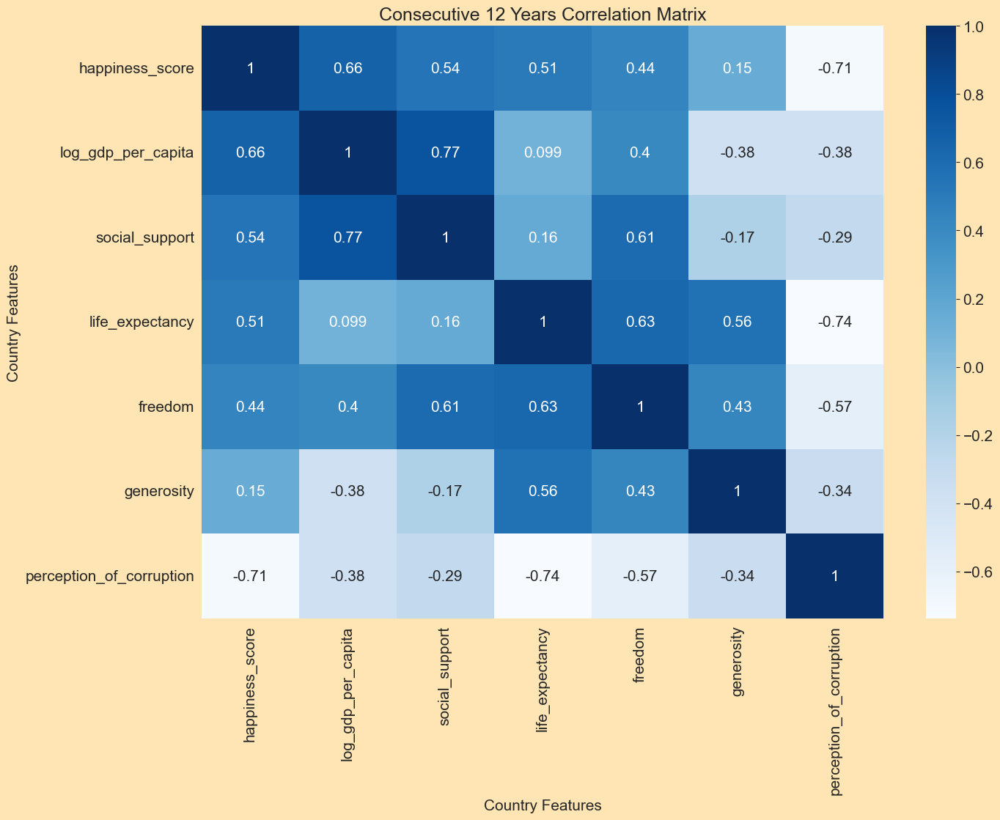

In [246]:
### What country feature correlates with happiness in con_12?

con_12_corr_matrix = con_12.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_12_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 12 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [247]:
# Show what correlates to happiness in con_12

con_12_happiness_corr = con_12.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_12_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.662678
social_support              0.539948
life_expectancy             0.510479
freedom                     0.440201
generosity                  0.147374
perception_of_corruption   -0.708543
Name: happiness_score, dtype: float64

In [248]:
# Show all positive correlations in con_12

con_12_corr = con_12.corr(numeric_only = True)
con_12_corr_unstack = con_12_corr.unstack().sort_values()
con_12_high_corr = con_12_corr_unstack.sort_values(ascending=False)
con_12_high_corr = con_12_high_corr[(con_12_high_corr < 1) & (con_12_high_corr > 0.5)].drop_duplicates()
con_12_high_corr

log_gdp_per_capita  social_support        0.768052
happiness_score     log_gdp_per_capita    0.662678
life_expectancy     freedom               0.631343
social_support      freedom               0.608118
life_expectancy     generosity            0.559708
happiness_score     social_support        0.539948
                    life_expectancy       0.510479
dtype: float64

### 13 consecutive years

In [249]:
test_data = data
con_13 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [250]:
con_13['diff']= con_13.groupby(['country_name',con_13['year'].diff().ne(1).cumsum()])['happiness_score'].diff(13)
con_13_all_diff = con_13[con_13['diff'].isna() == False]

print(con_13.shape)
con_13.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [251]:
con_13['diff'].describe()

count    306.000000
mean       0.113862
std        0.742909
min       -2.853571
25%       -0.272836
50%        0.113154
75%        0.580346
max        1.697175
Name: diff, dtype: float64

In [252]:
# Mean and Standard Deviation

con_13_mean = 0.113862
con_13_std = 0.742909

# 2 Standard Deviations

print(con_13_std * 2)

1.485818


In [253]:
con_13_top = con_13[con_13['diff'] > con_13_mean + (con_13_std * 2)].sort_values('diff', ascending=False)

print(con_13_top.shape)
con_13_top.sort_values('diff', ascending=False)

(3, 4)


,country_name,year,happiness_score,diff
1226,Lithuania,2023,6.763000,1.697175
1738,Romania,2023,6.589100,1.679934
1532,Nicaragua,2019,6.112545,1.652387


In [254]:
con_13_top_index = con_13_top.index.tolist()
con_13_top_index.sort()

a = [x-1 for x in con_13_top_index]
b = [x-2 for x in con_13_top_index]
c = [x-3 for x in con_13_top_index]
d = [x-4 for x in con_13_top_index]
e = [x-5 for x in con_13_top_index]
f = [x-6 for x in con_13_top_index]
g = [x-7 for x in con_13_top_index]
h = [x-8 for x in con_13_top_index]
i = [x-9 for x in con_13_top_index]
j = [x-10 for x in con_13_top_index]
k = [x-11 for x in con_13_top_index]
l = [x-12 for x in con_13_top_index]
m = [x-13 for x in con_13_top_index]

con_13_top_all_index = con_13_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m
con_13_top_all_index = list(set(con_13_top_all_index)) # Removing overlapping Country Year 
con_13_top_all_index.sort()

print(con_13_top_index[:12])
print(con_13_top_all_index[:20])

[1226, 1532, 1738]
[1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1519, 1520, 1521, 1522, 1523, 1524]


In [255]:
con_13 = data.iloc[con_13_top_all_index]

print(con_13.shape)
con_13.head(10)

(42, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1213,Lithuania,Europe,2010,5.065825,10.083422,0.881811,64.300003,0.519352,-0.278437,0.962167
1214,Lithuania,Europe,2011,5.432437,10.164642,0.911411,64.500000,0.565797,-0.151547,0.963512
1215,Lithuania,Europe,2012,5.771037,10.215773,0.918690,64.699997,0.503027,-0.276897,0.956959
1216,Lithuania,Europe,2013,5.595689,10.260778,0.912514,64.900002,0.555815,-0.240327,0.936336
1217,Lithuania,Europe,2014,6.125724,10.304135,0.908240,65.099998,0.507947,-0.267209,0.956348
1218,Lithuania,Europe,2015,5.711378,10.333587,0.928524,65.300003,0.641470,-0.257425,0.924174
1219,Lithuania,Europe,2016,5.865552,10.371170,0.937873,65.650002,0.614239,-0.270125,0.949393
1220,Lithuania,Europe,2017,6.272941,10.427088,0.926317,66.000000,0.749307,-0.177431,0.789710
1221,Lithuania,Europe,2018,6.308879,10.475785,0.929350,66.349998,0.698945,-0.240819,0.851745
1222,Lithuania,Europe,2019,6.064098,10.523646,0.917578,66.699997,0.780266,-0.255955,0.782501


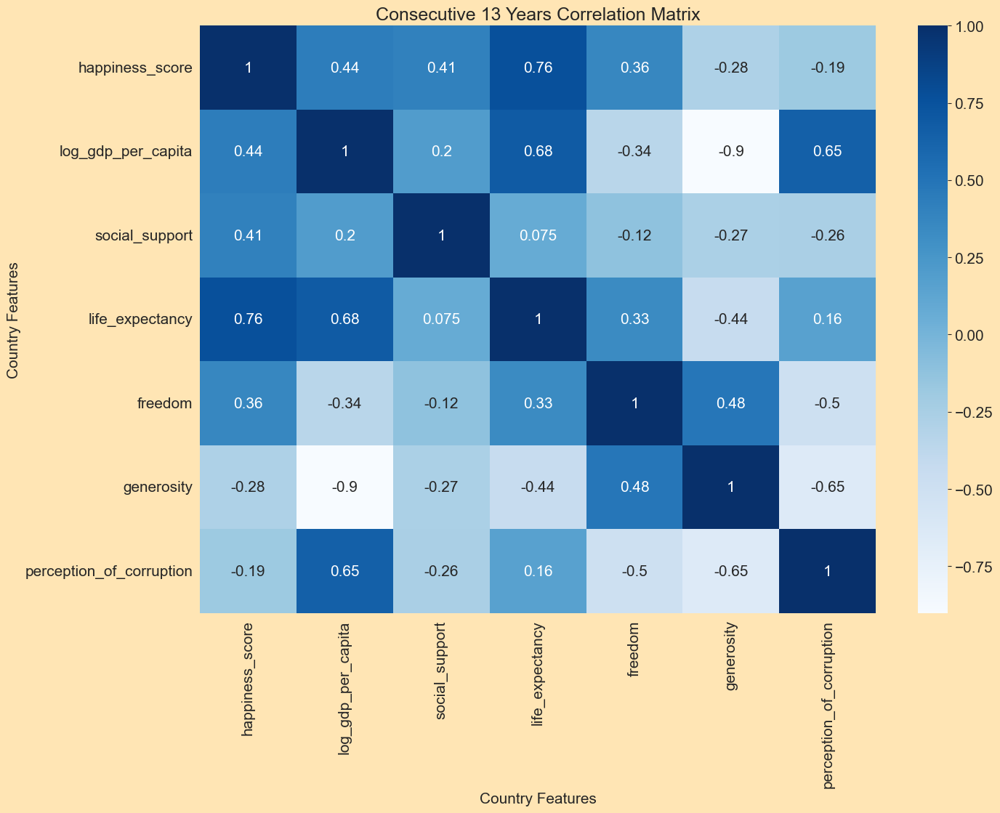

In [256]:
### What country feature correlates with happiness in con_13?

con_13_corr_matrix = con_13.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_13_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 13 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [257]:
# Show what correlates to happiness in con_13

con_13_happiness_corr = con_13.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_13_happiness_corr

happiness_score             1.000000
life_expectancy             0.762713
log_gdp_per_capita          0.438759
social_support              0.411240
freedom                     0.363639
perception_of_corruption   -0.188263
generosity                 -0.278459
Name: happiness_score, dtype: float64

In [258]:
# Show all positive correlations in con_13

con_13_corr = con_13.corr(numeric_only = True)
con_13_corr_unstack = con_13_corr.unstack().sort_values()
con_13_high_corr = con_13_corr_unstack.sort_values(ascending=False)
con_13_high_corr = con_13_high_corr[(con_13_high_corr < 1) & (con_13_high_corr > 0.5)].drop_duplicates()
con_13_high_corr

happiness_score     life_expectancy             0.762713
life_expectancy     log_gdp_per_capita          0.682661
log_gdp_per_capita  perception_of_corruption    0.650845
dtype: float64

### 14 consecutive years

In [259]:
test_data = data
con_14 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [260]:
con_14['diff']= con_14.groupby(['country_name',con_14['year'].diff().ne(1).cumsum()])['happiness_score'].diff(14)
con_14_all_diff = con_14[con_14['diff'].isna() == False]

print(con_14.shape)
con_14.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [261]:
con_14['diff'].describe()

count    214.000000
mean       0.104612
std        0.747060
min       -2.813799
25%       -0.374635
50%        0.191475
75%        0.607261
max        1.826732
Name: diff, dtype: float64

In [262]:
# Mean and Standard Deviation

con_14_mean = 0.104612
con_14_std = 0.747060

# 2 Standard Deviations

print(con_14_std * 2)

1.49412


In [263]:
con_14_top = con_14[con_14['diff'] > con_14_mean + (con_14_std * 2)].sort_values('diff', ascending=False)

print(con_14_top.shape)
con_14_top.sort_values('diff', ascending=False)

(2, 4)


,country_name,year,happiness_score,diff
1533,Nicaragua,2020,6.286890,1.826732
1138,Kyrgyzstan,2020,6.249586,1.608187


In [264]:
con_14_top_index = con_14_top.index.tolist()
con_14_top_index.sort()

a = [x-1 for x in con_14_top_index]
b = [x-2 for x in con_14_top_index]
c = [x-3 for x in con_14_top_index]
d = [x-4 for x in con_14_top_index]
e = [x-5 for x in con_14_top_index]
f = [x-6 for x in con_14_top_index]
g = [x-7 for x in con_14_top_index]
h = [x-8 for x in con_14_top_index]
i = [x-9 for x in con_14_top_index]
j = [x-10 for x in con_14_top_index]
k = [x-11 for x in con_14_top_index]
l = [x-12 for x in con_14_top_index]
m = [x-13 for x in con_14_top_index]
n = [x-14 for x in con_14_top_index]

con_14_top_all_index = con_14_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m + n
con_14_top_all_index = list(set(con_14_top_all_index)) # Removing overlapping Country Year 
con_14_top_all_index.sort()

print(con_14_top_index[:12])
print(con_14_top_all_index[:20])

[1138, 1533]
[1124, 1125, 1126, 1127, 1128, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1136, 1137, 1138, 1519, 1520, 1521, 1522, 1523]


In [265]:
con_14 = data.iloc[con_14_top_all_index]

print(con_14.shape)
con_14.head(10)

(30, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1124,Kyrgyzstan,Asia & Pacific,2006,4.641399,8.185375,0.844137,59.919998,0.677572,-0.142217,0.878633
1125,Kyrgyzstan,Asia & Pacific,2007,4.697762,8.257814,0.833098,60.340000,0.683523,-0.093482,0.929055
1126,Kyrgyzstan,Asia & Pacific,2008,4.736588,8.328985,0.792133,60.759998,0.719029,-0.101964,0.922627
1127,Kyrgyzstan,Asia & Pacific,2009,5.069054,8.345366,0.854936,61.180000,0.698920,-0.142075,0.896227
1128,Kyrgyzstan,Asia & Pacific,2010,4.996411,8.328712,0.885363,61.599998,0.720051,-0.073847,0.925794
1129,Kyrgyzstan,Asia & Pacific,2011,4.921049,8.374398,0.891404,62.020000,0.747808,-0.156829,0.932497
1130,Kyrgyzstan,Asia & Pacific,2012,5.207786,8.356864,0.856182,62.439999,0.702732,-0.081130,0.892037
1131,Kyrgyzstan,Asia & Pacific,2013,5.402427,8.440616,0.850716,62.860001,0.755037,-0.087396,0.899560
1132,Kyrgyzstan,Asia & Pacific,2014,5.252193,8.460006,0.898025,63.279999,0.736290,0.353036,0.896767
1133,Kyrgyzstan,Asia & Pacific,2015,4.905376,8.477442,0.856585,63.700001,0.813176,0.197422,0.857725


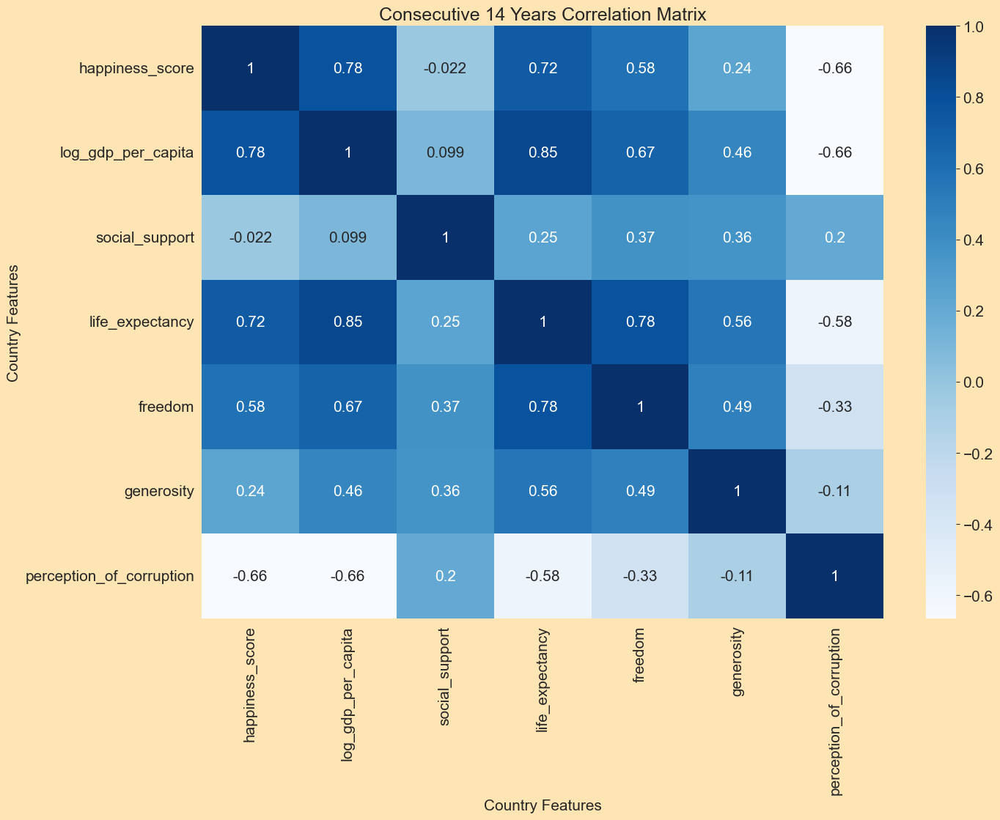

In [266]:
### What country feature correlates with happiness in con_14?

con_14_corr_matrix = con_14.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_14_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 14 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [267]:
# Show what correlates to happiness in con_14

con_14_happiness_corr = con_14.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_14_happiness_corr

happiness_score             1.000000
log_gdp_per_capita          0.784836
life_expectancy             0.723550
freedom                     0.583744
generosity                  0.238174
social_support             -0.022171
perception_of_corruption   -0.660125
Name: happiness_score, dtype: float64

In [268]:
# Show all positive correlations in con_14

con_14_corr = con_14.corr(numeric_only = True)
con_14_corr_unstack = con_14_corr.unstack().sort_values()
con_14_high_corr = con_14_corr_unstack.sort_values(ascending=False)
con_14_high_corr = con_14_high_corr[(con_14_high_corr < 1) & (con_14_high_corr > 0.5)].drop_duplicates()
con_14_high_corr

log_gdp_per_capita  life_expectancy       0.851396
happiness_score     log_gdp_per_capita    0.784836
life_expectancy     freedom               0.779116
happiness_score     life_expectancy       0.723550
log_gdp_per_capita  freedom               0.668554
happiness_score     freedom               0.583744
life_expectancy     generosity            0.555912
dtype: float64

### 15 consecutive years

In [269]:
test_data = data
con_15 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [270]:
con_15['diff']= con_15.groupby(['country_name',con_15['year'].diff().ne(1).cumsum()])['happiness_score'].diff(15)
con_15_all_diff = con_15[con_15['diff'].isna() == False]

print(con_15.shape)
con_15.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [271]:
con_15['diff'].describe()

count    141.000000
mean       0.168370
std        0.715128
min       -2.202651
25%       -0.346765
50%        0.226833
75%        0.725892
max        1.635190
Name: diff, dtype: float64

In [272]:
# Mean and Standard Deviation

con_15_mean = 0.168370
con_15_std = 0.715128

# 2 Standard Deviations

print(con_15_std * 2)

1.430256


In [273]:
con_15_top = con_15[con_15['diff'] > con_15_mean + (con_15_std * 2)].sort_values('diff', ascending=False)

print(con_15_top.shape)
con_15_top.sort_values('diff', ascending=False)

(1, 4)


,country_name,year,happiness_score,diff
1534,Nicaragua,2021,6.095349,1.63519


In [274]:
con_15_top_index = con_15_top.index.tolist()
con_15_top_index.sort()

a = [x-1 for x in con_15_top_index]
b = [x-2 for x in con_15_top_index]
c = [x-3 for x in con_15_top_index]
d = [x-4 for x in con_15_top_index]
e = [x-5 for x in con_15_top_index]
f = [x-6 for x in con_15_top_index]
g = [x-7 for x in con_15_top_index]
h = [x-8 for x in con_15_top_index]
i = [x-9 for x in con_15_top_index]
j = [x-10 for x in con_15_top_index]
k = [x-11 for x in con_15_top_index]
l = [x-12 for x in con_15_top_index]
m = [x-13 for x in con_15_top_index]
n = [x-14 for x in con_15_top_index]
o = [x-15 for x in con_15_top_index]

con_15_top_all_index = con_15_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m + n + o
con_15_top_all_index = list(set(con_15_top_all_index)) # Removing overlapping Country Year 
con_15_top_all_index.sort()

print(con_15_top_index[:12])
print(con_15_top_all_index[:20])

[1534]
[1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532, 1533, 1534]


In [275]:
con_15 = data.iloc[con_15_top_all_index]

print(con_15.shape)
con_15.head(10)

(16, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1519,Nicaragua,South/Central America,2006,4.460158,8.395246,0.877170,64.300003,0.745456,0.007598,0.844391
1520,Nicaragua,South/Central America,2007,4.944091,8.430822,0.866213,64.400002,0.835560,0.138307,0.825799
1521,Nicaragua,South/Central America,2008,5.103827,8.450392,0.857186,64.500000,0.790831,0.073447,0.818949
1522,Nicaragua,South/Central America,2009,5.352805,8.402441,0.834688,64.599998,0.746065,0.068298,0.794487
1523,Nicaragua,South/Central America,2010,5.686699,8.430954,0.863152,64.699997,0.791773,0.016336,0.801729
1524,Nicaragua,South/Central America,2011,5.385705,8.477496,0.800305,64.800003,0.778591,-0.021449,0.760243
1525,Nicaragua,South/Central America,2012,5.448006,8.525718,0.894054,64.900002,0.850305,0.015352,0.643579
1526,Nicaragua,South/Central America,2013,5.772275,8.559204,0.868216,65.000000,0.859149,0.037441,0.636247
1527,Nicaragua,South/Central America,2014,6.275267,8.591465,0.838567,65.099998,0.817321,0.102353,0.698808
1528,Nicaragua,South/Central America,2015,5.924113,8.623894,0.826909,65.199997,0.809259,0.075562,0.727998


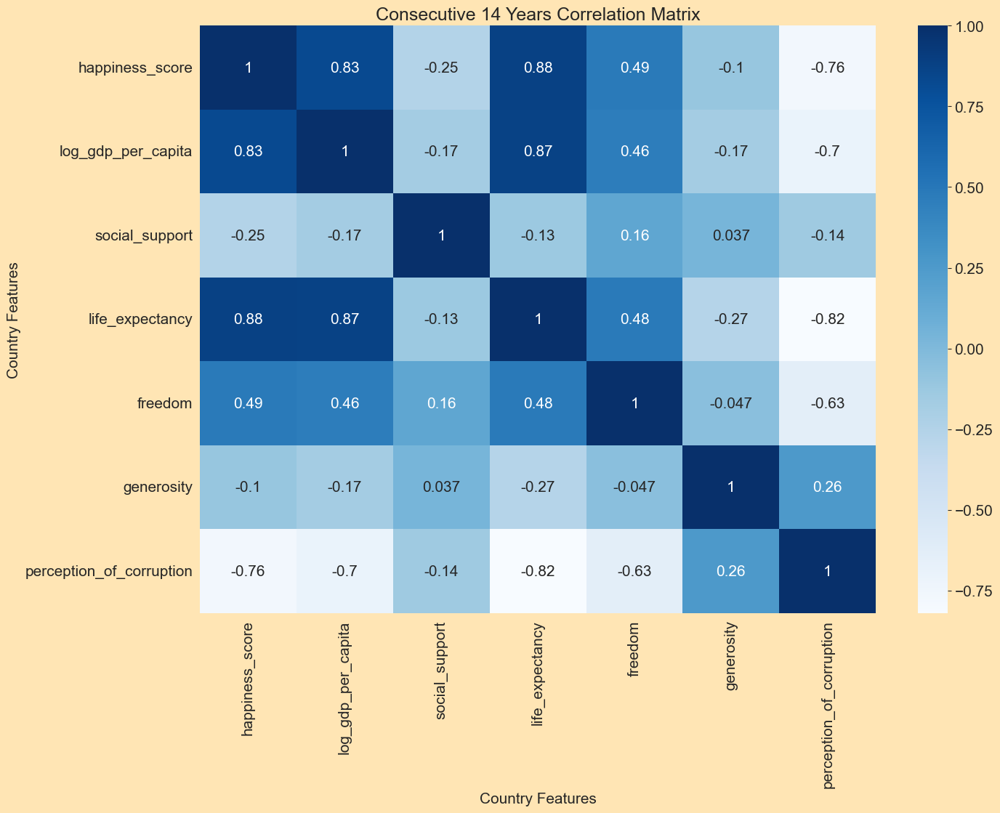

In [276]:
### What country feature correlates with happiness in con_15?

con_15_corr_matrix = con_15.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_15_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 14 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [277]:
# Show what correlates to happiness in con_15

con_15_happiness_corr = con_15.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_15_happiness_corr

happiness_score             1.000000
life_expectancy             0.884801
log_gdp_per_capita          0.829322
freedom                     0.485684
generosity                 -0.102868
social_support             -0.251648
perception_of_corruption   -0.763785
Name: happiness_score, dtype: float64

In [278]:
# Show all positive correlations in con_15

con_15_corr = con_15.corr(numeric_only = True)
con_15_corr_unstack = con_15_corr.unstack().sort_values()
con_15_high_corr = con_15_corr_unstack.sort_values(ascending=False)
con_15_high_corr = con_15_high_corr[(con_15_high_corr < 1) & (con_15_high_corr > 0.5)].drop_duplicates()
con_15_high_corr

happiness_score     life_expectancy       0.884801
life_expectancy     log_gdp_per_capita    0.873658
log_gdp_per_capita  happiness_score       0.829322
dtype: float64

### 16 consecutive years

In [279]:
test_data = data
con_16 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [280]:
con_16['diff']= con_16.groupby(['country_name',con_16['year'].diff().ne(1).cumsum()])['happiness_score'].diff(16)
con_16_all_diff = con_16[con_16['diff'].isna() == False]

print(con_16.shape)
con_16.head(20)

(2336, 4)


,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,NaN
3,Afghanistan,2011,3.831719,NaN
4,Afghanistan,2012,3.782938,NaN
5,Afghanistan,2013,3.572100,NaN
6,Afghanistan,2014,3.130896,NaN
7,Afghanistan,2015,3.982855,NaN
8,Afghanistan,2016,4.220169,NaN
9,Afghanistan,2017,2.661718,NaN


In [281]:
con_16['diff'].describe()

count    82.000000
mean      0.234378
std       0.697721
min      -1.478257
25%      -0.192104
50%       0.274733
75%       0.670579
max       1.932099
Name: diff, dtype: float64

In [282]:
# Mean and Standard Deviation

con_16_mean = 0.234378
con_16_std = 0.697721

# 2 Standard Deviations

print(con_16_std * 2)

1.395442


In [283]:
con_16_top = con_16[con_16['diff'] > con_16_mean + (con_16_std * 2)].sort_values('diff', ascending=False)

print(con_16_top.shape)
con_16_top.sort_values('diff', ascending=False)

(1, 4)


,country_name,year,happiness_score,diff
1535,Nicaragua,2022,6.392258,1.932099


In [284]:
con_16_top_index = con_16_top.index.tolist()
con_16_top_index.sort()

a = [x-1 for x in con_16_top_index]
b = [x-2 for x in con_16_top_index]
c = [x-3 for x in con_16_top_index]
d = [x-4 for x in con_16_top_index]
e = [x-5 for x in con_16_top_index]
f = [x-6 for x in con_16_top_index]
g = [x-7 for x in con_16_top_index]
h = [x-8 for x in con_16_top_index]
i = [x-9 for x in con_16_top_index]
j = [x-10 for x in con_16_top_index]
k = [x-11 for x in con_16_top_index]
l = [x-12 for x in con_16_top_index]
m = [x-13 for x in con_16_top_index]
n = [x-14 for x in con_16_top_index]
o = [x-15 for x in con_16_top_index]
p = [x-16 for x in con_16_top_index]


con_16_top_all_index = con_16_top_index + a + b + c + d + e + f + g + h + i + j + k + l + m + n + o + p
con_16_top_all_index = list(set(con_16_top_all_index)) # Removing overlapping Country Year 
con_16_top_all_index.sort()

print(con_16_top_index[:12])
print(con_16_top_all_index[:20])

[1535]
[1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532, 1533, 1534, 1535]


In [285]:
con_16 = data.iloc[con_16_top_all_index]

print(con_16.shape)
con_16.head(10)

(17, 10)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1519,Nicaragua,South/Central America,2006,4.460158,8.395246,0.877170,64.300003,0.745456,0.007598,0.844391
1520,Nicaragua,South/Central America,2007,4.944091,8.430822,0.866213,64.400002,0.835560,0.138307,0.825799
1521,Nicaragua,South/Central America,2008,5.103827,8.450392,0.857186,64.500000,0.790831,0.073447,0.818949
1522,Nicaragua,South/Central America,2009,5.352805,8.402441,0.834688,64.599998,0.746065,0.068298,0.794487
1523,Nicaragua,South/Central America,2010,5.686699,8.430954,0.863152,64.699997,0.791773,0.016336,0.801729
1524,Nicaragua,South/Central America,2011,5.385705,8.477496,0.800305,64.800003,0.778591,-0.021449,0.760243
1525,Nicaragua,South/Central America,2012,5.448006,8.525718,0.894054,64.900002,0.850305,0.015352,0.643579
1526,Nicaragua,South/Central America,2013,5.772275,8.559204,0.868216,65.000000,0.859149,0.037441,0.636247
1527,Nicaragua,South/Central America,2014,6.275267,8.591465,0.838567,65.099998,0.817321,0.102353,0.698808
1528,Nicaragua,South/Central America,2015,5.924113,8.623894,0.826909,65.199997,0.809259,0.075562,0.727998


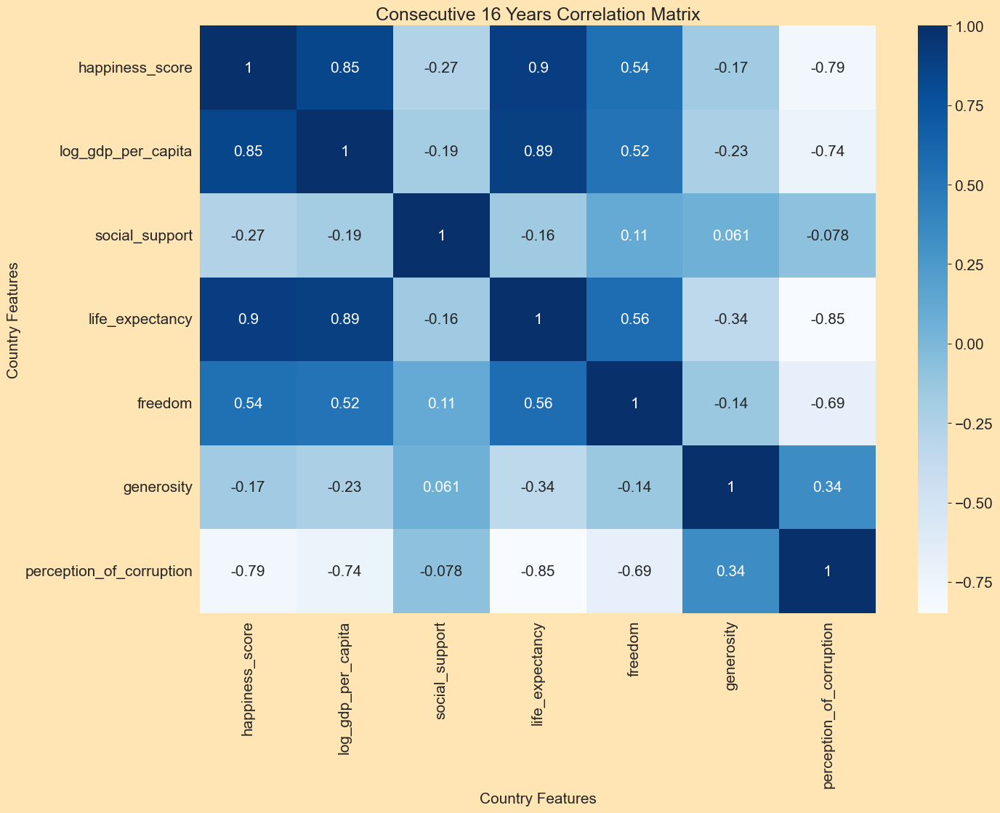

In [286]:
### What country feature correlates with happiness in con_16?

con_16_corr_matrix = con_16.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_16_corr_matrix, annot=True, cmap="Blues")

plt.title('Consecutive 16 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [287]:
# Show what correlates to happiness in con_16

con_16_happiness_corr = con_16.corr(numeric_only = True)['happiness_score'].sort_values(ascending=False)
con_16_happiness_corr

happiness_score             1.000000
life_expectancy             0.895099
log_gdp_per_capita          0.845067
freedom                     0.544189
generosity                 -0.170682
social_support             -0.269135
perception_of_corruption   -0.785742
Name: happiness_score, dtype: float64

In [288]:
# Show all positive correlations in con_16

con_16_corr = con_16.corr(numeric_only = True)
con_16_corr_unstack = con_16_corr.unstack().sort_values()
con_16_high_corr = con_16_corr_unstack.sort_values(ascending=False)
con_16_high_corr = con_16_high_corr[(con_16_high_corr < 1) & (con_16_high_corr > 0.5)].drop_duplicates()
con_16_high_corr

happiness_score     life_expectancy       0.895099
life_expectancy     log_gdp_per_capita    0.885610
log_gdp_per_capita  happiness_score       0.845067
life_expectancy     freedom               0.560761
happiness_score     freedom               0.544189
freedom             log_gdp_per_capita    0.523309
dtype: float64

In [289]:
con_01_top= con_01_top.reset_index().drop('index', axis=1)
con_01_top['consecutive_years'] = 'con_02'

con_02_top= con_02_top.reset_index().drop('index', axis=1)
con_02_top['consecutive_years'] = 'con_02'

con_03_top = con_03_top.reset_index().drop('index', axis=1)
con_03_top['consecutive_years'] = 'con_03'

con_04_top = con_04_top.reset_index().drop('index', axis=1)
con_04_top['consecutive_years'] = 'con_04'

con_05_top = con_05_top.reset_index().drop('index', axis=1)
con_05_top['consecutive_years'] = 'con_05'

con_06_top = con_06_top.reset_index().drop('index', axis=1)
con_06_top['consecutive_years'] = 'con_06'

con_07_top = con_07_top.reset_index().drop('index', axis=1)
con_07_top['consecutive_years'] = 'con_07'

con_08_top = con_08_top.reset_index().drop('index', axis=1)
con_08_top['consecutive_years'] = 'con_08'

con_09_top = con_09_top.reset_index().drop('index', axis=1)
con_09_top['consecutive_years'] = 'con_09'

con_10_top = con_10_top.reset_index().drop('index', axis=1)
con_10_top['consecutive_years'] = 'con_10'

con_11_top = con_11_top.reset_index().drop('index', axis=1)
con_11_top['consecutive_years'] = 'con_11'

con_12_top = con_12_top.reset_index().drop('index', axis=1)
con_12_top['consecutive_years'] = 'con_12'

con_13_top = con_14_top.reset_index().drop('index', axis=1)
con_13_top['consecutive_years'] = 'con_13'

con_14_top = con_14_top.reset_index().drop('index', axis=1)
con_14_top['consecutive_years'] = 'con_14'

con_15_top = con_15_top.reset_index().drop('index', axis=1)
con_15_top['consecutive_years'] = 'con_15'

con_16_top = con_16_top.reset_index().drop('index', axis=1)
con_16_top['consecutive_years'] = 'con_16'

con_top_all = pd.concat([con_02_top, con_03_top, con_04_top, con_05_top, con_06_top, con_07_top, con_08_top, con_09_top, con_10_top, con_11_top, con_12_top, con_13_top, con_14_top, con_15_top, con_16_top])

print(con_top_all.shape)
con_top_all.sort_values('diff', ascending=False).reset_index().drop('index', axis=1).head(10)

(234, 5)


,country_name,year,happiness_score,diff,consecutive_years
0,Benin,2018,5.819827,2.626358,con_06
1,Benin,2018,5.819827,2.472408,con_04
2,Liberia,2019,5.121461,2.419870,con_04
3,Benin,2018,5.819827,2.340414,con_05
4,Benin,2018,5.819827,2.195163,con_03
5,Nepal,2020,5.982410,2.172966,con_09
6,Nicaragua,2017,6.476357,2.016198,con_11
7,Lithuania,2022,7.037577,1.971752,con_12
8,Benin,2018,5.819827,1.949548,con_07
9,South Africa,2021,5.598654,1.937927,con_08


In [290]:
con_top_all.describe()

,happiness_score,diff
count,234.000000,234.000000
mean,5.636345,1.467428
std,0.739208,0.291887
min,3.878578,0.936035
25%,5.004074,1.263807
50%,5.597723,1.446630
75%,6.241407,1.654063
max,7.478455,2.626358


In [291]:
con_01 = con_01.reset_index().drop('index', axis=1)
con_01['consecutive_years'] = 'con_01'

con_02 = con_02.reset_index().drop('index', axis=1)
con_02['consecutive_years'] = 'con_02'

con_03 = con_03.reset_index().drop('index', axis=1)
con_03['consecutive_years'] = 'con_03'

con_04 = con_04.reset_index().drop('index', axis=1)
con_04['consecutive_years'] = 'con_04'

con_05 = con_05.reset_index().drop('index', axis=1)
con_05['consecutive_years'] = 'con_05'

con_06 = con_06.reset_index().drop('index', axis=1)
con_06['consecutive_years'] = 'con_06'

con_07 = con_07.reset_index().drop('index', axis=1)
con_07['consecutive_years'] = 'con_07'

con_08 = con_08.reset_index().drop('index', axis=1)
con_08['consecutive_years'] = 'con_08'

con_09 = con_09.reset_index().drop('index', axis=1)
con_09['consecutive_years'] = 'con_09'

con_10 = con_10.reset_index().drop('index', axis=1)
con_10['consecutive_years'] = 'con_10'

con_11 = con_11.reset_index().drop('index', axis=1)
con_11['consecutive_years'] = 'con_11'

con_12 = con_12.reset_index().drop('index', axis=1)
con_12['consecutive_years'] = 'con_12'

con_13 = con_13.reset_index().drop('index', axis=1)
con_13['consecutive_years'] = 'con_13'

con_14 = con_14.reset_index().drop('index', axis=1)
con_14['consecutive_years'] = 'con_14'

con_15 = con_15.reset_index().drop('index', axis=1)
con_15['consecutive_years'] = 'con_15'

con_16 = con_16.reset_index().drop('index', axis=1)
con_16['consecutive_years'] = 'con_16'

con_all = pd.concat([con_02, con_03, con_04, con_05, con_06, con_07, con_08, con_09, con_10, con_11, con_12, con_13, con_14, con_15, con_16])

print(con_all.shape)
con_all.head(10)

(1231, 11)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,consecutive_years
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,con_02
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,con_02
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,con_02
3,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,con_02
4,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,con_02
5,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,con_02
6,Armenia,Europe,2017,4.287736,9.434255,0.697925,66.550003,0.613697,-0.152285,0.864683,con_02
7,Armenia,Europe,2018,5.062449,9.490351,0.814449,66.824997,0.807644,-0.168633,0.676826,con_02
8,Armenia,Europe,2019,5.488087,9.569242,0.781604,67.099998,0.844324,-0.179027,0.583473,con_02
9,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522,con_02


In [292]:
con_all.describe()

,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,1231.000000,1225.000000,1226.000000,1231.000000,1226.000000,1210.000000,1214.000000
mean,5.088335,8.778385,0.770605,61.499375,0.722360,-0.024275,0.821451
std,0.892769,0.990549,0.115159,7.074167,0.120354,0.129968,0.093721
min,2.701591,5.526723,0.372908,41.599998,0.294612,-0.278437,0.437915
25%,4.542546,7.992942,0.700241,55.025002,0.661992,-0.116701,0.762783
50%,5.077461,8.559204,0.793660,63.680000,0.731157,-0.043919,0.818949
75%,5.774883,9.592311,0.856585,65.954998,0.799847,0.056086,0.907405
max,7.478455,10.801981,0.952761,79.022000,0.963775,0.550825,0.976917


In [293]:
con_all.groupby('consecutive_years')['happiness_score'].count()

consecutive_years
con_02    136
con_03    103
con_04    113
con_05    141
con_06    176
con_07     79
con_08     93
con_09     71
con_10     89
con_11     86
con_12     39
con_13     42
con_14     30
con_15     16
con_16     17
Name: happiness_score, dtype: int64

(1231, 11)


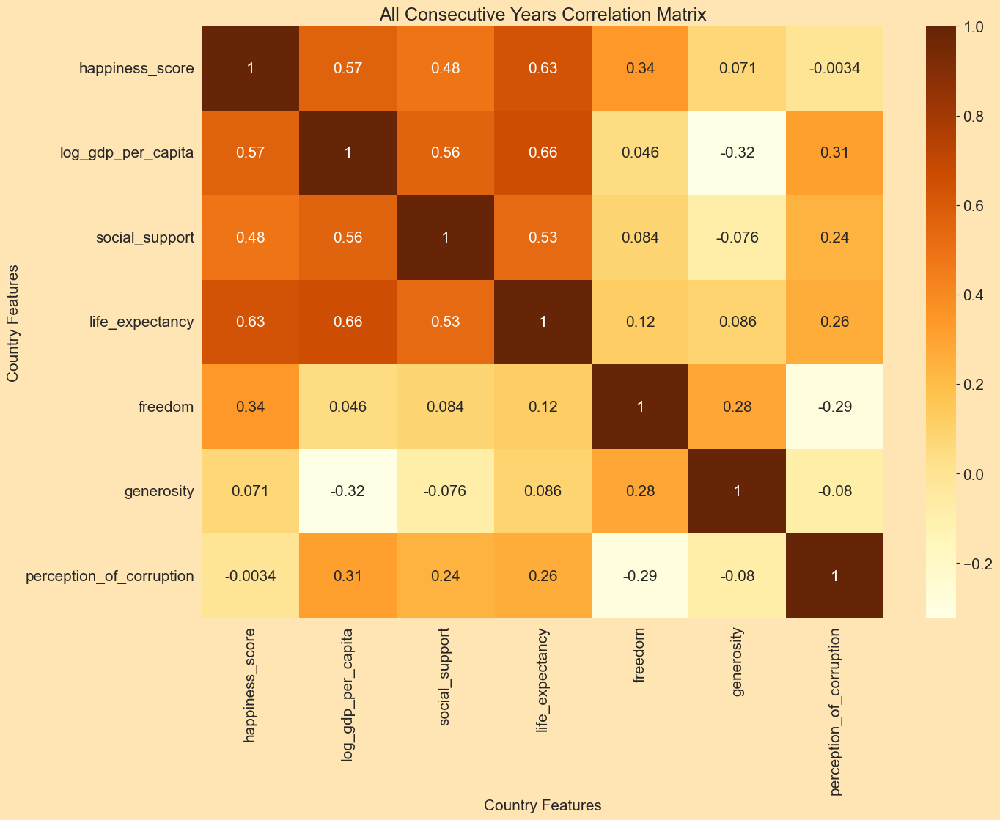

In [294]:
con_all_corr_matrix = con_all.corr(numeric_only = True, method = "pearson")
sns.heatmap(con_all_corr_matrix, annot=True, cmap="YlOrBr")

plt.title('All Consecutive Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

print(con_all.shape)
plt.show()

In [295]:
distinct_con_all = con_all.drop_duplicates(subset=['country_name', 'year'], keep='first')
print(distinct_con_all.shape)
distinct_con_all.describe()

(385, 11)


,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,385.000000,382.000000,384.000000,385.000000,384.000000,379.000000,378.000000
mean,5.070101,8.771772,0.775118,61.009421,0.719239,-0.020822,0.824234
std,0.919283,1.021744,0.117889,6.575515,0.126546,0.137104,0.090930
min,2.701591,5.526723,0.372908,41.599998,0.294612,-0.278437,0.437915
25%,4.460158,7.958061,0.701312,55.200001,0.653785,-0.115426,0.770945
50%,5.034863,8.568066,0.796859,61.924999,0.725011,-0.044104,0.826638
75%,5.752755,9.589943,0.860089,65.800003,0.812373,0.055068,0.896632
max,7.478455,10.801981,0.952761,79.022000,0.963775,0.550825,0.976917


In [296]:
distinct_con_all.groupby('consecutive_years')['happiness_score'].count()

consecutive_years
con_02    136
con_03     37
con_04     46
con_05     35
con_06     44
con_07     22
con_08     10
con_09      7
con_10      4
con_11     24
con_12      3
con_13      5
con_14     10
con_15      1
con_16      1
Name: happiness_score, dtype: int64

(385, 11)


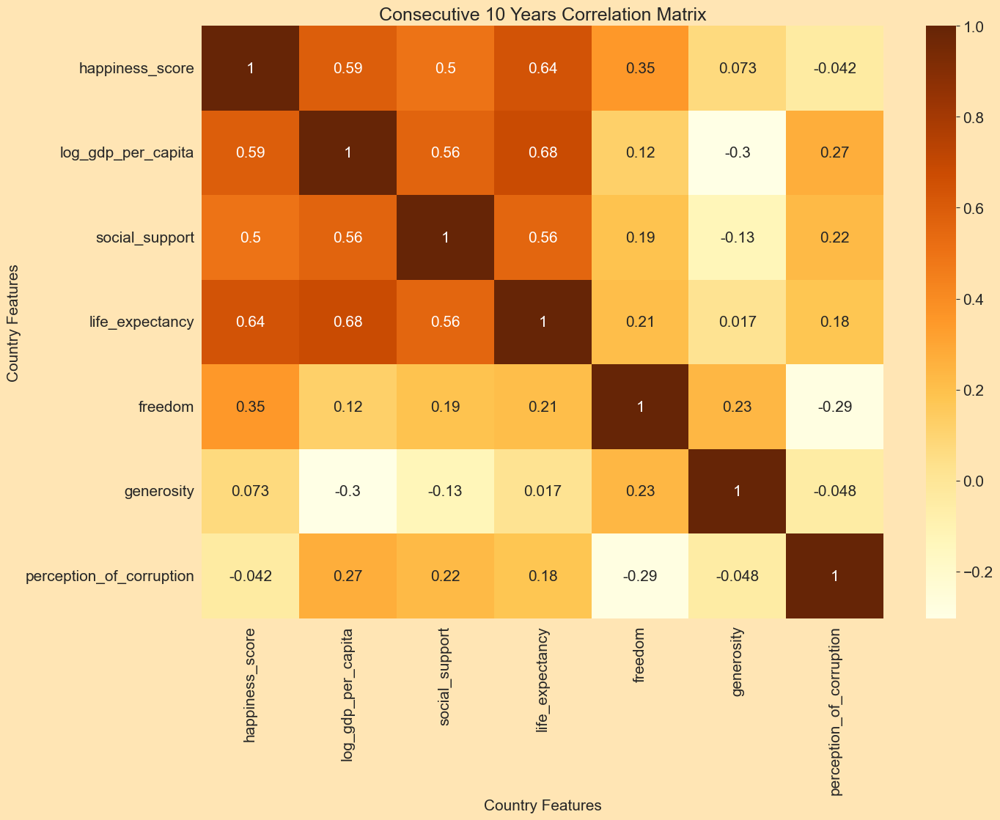

In [297]:

distinct_con_all_corr_matrix = distinct_con_all.corr(numeric_only = True, method = "pearson")
sns.heatmap(distinct_con_all_corr_matrix, annot=True, cmap="YlOrBr")

plt.title('Consecutive 10 Years Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

print(distinct_con_all.shape)
plt.show()

In [298]:
con_01_all_diff = con_01_all_diff.reset_index().drop('index', axis=1)
con_01_all_diff['consecutive_years'] = 'con_01'

con_02_all_diff = con_02_all_diff.reset_index().drop('index', axis=1)
con_02_all_diff['consecutive_years'] = 'con_02'

con_03_all_diff = con_03_all_diff.reset_index().drop('index', axis=1)
con_03_all_diff['consecutive_years'] = 'con_03'

con_04_all_diff = con_04_all_diff.reset_index().drop('index', axis=1)
con_04_all_diff['consecutive_years'] = 'con_04'

con_05_all_diff = con_05_all_diff.reset_index().drop('index', axis=1)
con_05_all_diff['consecutive_years'] = 'con_05'

con_06_all_diff = con_06_all_diff.reset_index().drop('index', axis=1)
con_06_all_diff['consecutive_years'] = 'con_06'

con_07_all_diff = con_07_all_diff.reset_index().drop('index', axis=1)
con_07_all_diff['consecutive_years'] = 'con_07'

con_08_all_diff = con_08_all_diff.reset_index().drop('index', axis=1)
con_08_all_diff['consecutive_years'] = 'con_08'

con_09_all_diff = con_09_all_diff.reset_index().drop('index', axis=1)
con_09_all_diff['consecutive_years'] = 'con_09'

con_10_all_diff = con_10_all_diff.reset_index().drop('index', axis=1)
con_10_all_diff['consecutive_years'] = 'con_10'

con_11_all_diff = con_11_all_diff.reset_index().drop('index', axis=1)
con_11_all_diff['consecutive_years'] = 'con_11'

con_12_all_diff = con_12_all_diff.reset_index().drop('index', axis=1)
con_12_all_diff['consecutive_years'] = 'con_12'

con_13_all_diff = con_13_all_diff.reset_index().drop('index', axis=1)
con_13_all_diff['consecutive_years'] = 'con_13'

con_14_all_diff = con_14_all_diff.reset_index().drop('index', axis=1)
con_14_all_diff['consecutive_years'] = 'con_14'

con_15_all_diff = con_15_all_diff.reset_index().drop('index', axis=1)
con_15_all_diff['consecutive_years'] = 'con_15'

con_16_all_diff = con_16_all_diff.reset_index().drop('index', axis=1)
con_16_all_diff['consecutive_years'] = 'con_16'

con_all_diff = pd.concat([con_01_all_diff, con_02_all_diff, con_03_all_diff, con_04_all_diff, con_05_all_diff, con_06_all_diff, con_07_all_diff, con_08_all_diff, con_09_all_diff, con_10_all_diff, con_11_all_diff, con_12_all_diff, con_13_all_diff, con_14_all_diff, con_15_all_diff, con_16_all_diff])

print(con_all_diff.shape)
con_all_diff.sort_values('diff', ascending=False).reset_index().drop('index', axis=1).head(10)

(14070, 5)


,country_name,year,happiness_score,diff,consecutive_years
0,Benin,2018,5.819827,2.626358,con_06
1,Benin,2018,5.819827,2.472408,con_04
2,Liberia,2019,5.121461,2.419870,con_04
3,Benin,2018,5.819827,2.340414,con_05
4,Benin,2018,5.819827,2.195163,con_03
5,Nepal,2020,5.982410,2.172966,con_09
6,Nicaragua,2017,6.476357,2.016198,con_11
7,Lithuania,2022,7.037577,1.971752,con_12
8,Benin,2018,5.819827,1.949548,con_07
9,South Africa,2021,5.598654,1.937927,con_08


In [299]:
con_all_diff.describe()

,happiness_score,diff
count,14070.000000,14070.000000
mean,5.596594,0.068349
std,1.076589,0.583583
min,1.281271,-3.437340
25%,4.844028,-0.229961
50%,5.686612,0.058782
75%,6.379925,0.396194
max,7.970892,2.626358


In [300]:
# Mean and Standard Deviation

con_all_diff_mean = 0.062161
con_all_diff_std = 0.564237

# 2 Standard Deviations

print(con_all_diff_std * 2)
print(con_all_diff_std * 3)

1.128474
1.692711


In [301]:
con_all_diff_top2std = con_all_diff[con_all_diff['diff'] > con_all_diff_mean + (con_all_diff_std * 2)].sort_values('diff', ascending=False)

print(con_all_diff_top2std.shape)
con_all_diff_top2std.sort_values('diff', ascending=False).head(10)

(416, 5)


,country_name,year,happiness_score,diff,consecutive_years
91,Benin,2018,5.819827,2.626358,con_06
117,Benin,2018,5.819827,2.472408,con_04
739,Liberia,2019,5.121461,2.419870,con_04
104,Benin,2018,5.819827,2.340414,con_05
131,Benin,2018,5.819827,2.195163,con_03
465,Nepal,2020,5.982410,2.172966,con_09
330,Nicaragua,2017,6.476357,2.016198,con_11
224,Lithuania,2022,7.037577,1.971752,con_12
79,Benin,2018,5.819827,1.949548,con_07
695,South Africa,2021,5.598654,1.937927,con_08


In [302]:
con_all_diff_top2std.groupby('consecutive_years')['consecutive_years'].count().sort_values(ascending=False)

consecutive_years
con_08    42
con_06    40
con_09    40
con_05    38
con_07    38
con_10    36
con_11    32
con_04    25
con_12    25
con_02    24
con_13    22
con_03    18
con_14    14
con_15     9
con_01     8
con_16     5
Name: consecutive_years, dtype: int64

In [303]:
con_all_diff_top2std.groupby('consecutive_years')['consecutive_years'].count().sort_values(ascending=False).describe()

count    16.000000
mean     26.000000
std      12.532624
min       5.000000
25%      17.000000
50%      25.000000
75%      38.000000
max      42.000000
Name: consecutive_years, dtype: float64

In [304]:
con_all_diff_top3std = con_all_diff[con_all_diff['diff'] > con_all_diff_mean + (con_all_diff_std * 3)].sort_values('diff', ascending=False)

print(con_all_diff_top3std.shape)
con_all_diff_top3std.sort_values('diff', ascending=False).head(10)

(35, 5)


,country_name,year,happiness_score,diff,consecutive_years
91,Benin,2018,5.819827,2.626358,con_06
117,Benin,2018,5.819827,2.472408,con_04
739,Liberia,2019,5.121461,2.419870,con_04
104,Benin,2018,5.819827,2.340414,con_05
131,Benin,2018,5.819827,2.195163,con_03
465,Nepal,2020,5.982410,2.172966,con_09
330,Nicaragua,2017,6.476357,2.016198,con_11
224,Lithuania,2022,7.037577,1.971752,con_12
79,Benin,2018,5.819827,1.949548,con_07
695,South Africa,2021,5.598654,1.937927,con_08


In [305]:
con_all_diff_top3std.groupby('consecutive_years')['consecutive_years'].count()

consecutive_years
con_02    2
con_03    2
con_04    4
con_05    2
con_06    3
con_07    4
con_08    3
con_09    4
con_10    4
con_11    3
con_12    2
con_14    1
con_16    1
Name: consecutive_years, dtype: int64

In [306]:
con_all_diff_top4std = con_all_diff[con_all_diff['diff'] > con_all_diff_mean + (con_all_diff_std * 4)].sort_values('diff', ascending=False)

print(con_all_diff_top4std.shape)
con_all_diff_top4std.sort_values('diff', ascending=False)

(4, 5)


,country_name,year,happiness_score,diff,consecutive_years
91,Benin,2018,5.819827,2.626358,con_06
117,Benin,2018,5.819827,2.472408,con_04
739,Liberia,2019,5.121461,2.419870,con_04
104,Benin,2018,5.819827,2.340414,con_05


In [307]:
Beans

NameError: name 'Beans' is not defined

In [ ]:
Bahrain_2011_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2011, 2012, 2013]) == True)]
Bahrain_2011_2013.loc[Bahrain_2011_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2011-2013'

fig, ax = plt.subplots(6, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )


sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2011_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Perception of Corruption')
ax[5].grid(linewidth=2)
ax[5].legend(title='')

In [ ]:
Benin_2016_2018 = data[(data['country_name'] == 'Benin') & (data['year'].isin([2016, 2017, 2018]) == True)]
Benin_2016_2018.loc[Benin_2016_2018['country_name'] == 'Benin', 'country_name'] = 'Benin 2016-2018'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Benin', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2005]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Benin_2016_2018, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Benin_2016_2018, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Benin_2016_2018, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Benin_2016_2018, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Benin_2016_2018, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Benin_2016_2018, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Benin_2016_2018, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

In [ ]:
Liberia_2015_2017 = data[(data['country_name'] == 'Liberia') & (data['year'].isin([2015, 2016, 2017]) == True)]
Liberia_2015_2017.loc[Liberia_2015_2017['country_name'] == 'Liberia', 'country_name'] = 'Liberia 2015-2017'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Liberia', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2006]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Liberia_2015_2017, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Liberia_2015_2017, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Liberia_2015_2017, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Liberia_2015_2017, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Liberia_2015_2017, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Liberia_2015_2017, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Liberia_2015_2017, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

In [ ]:
Bahrain_2011_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2011, 2012, 2013]) == True)]
Bahrain_2011_2013.loc[Bahrain_2011_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2011-2013'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2011_2013, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Bahrain_2011_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

In [ ]:
%whos DataFrame